## An introduction to seaborn

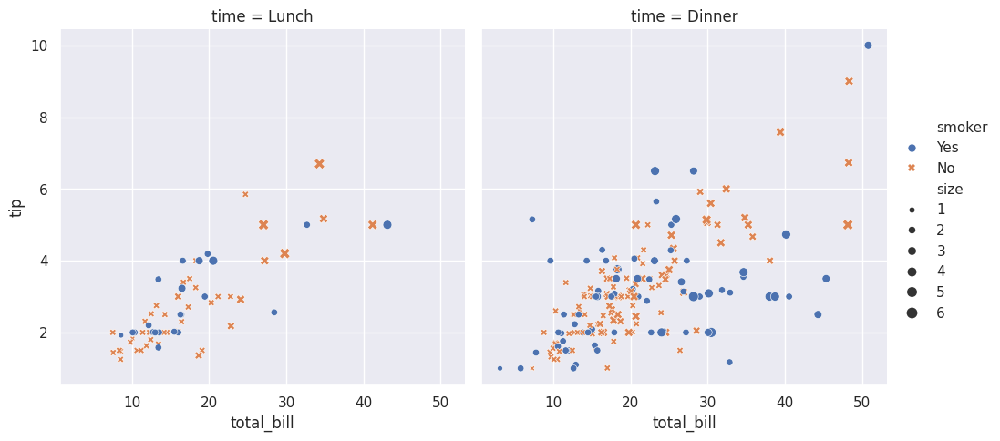

In [2]:
import seaborn as sns

# default theme
sns.set_theme()

# loading an example dataset
tips=sns.load_dataset("tips")

# create a visualization(statistical relationship)
sns.relplot(
    data=tips,
    x="total_bill",y="tip",col="time",hue="smoker",style="smoker",size="size" 
)
# col for categories for which seperate plots will be drawn
# hue for color differention and style for marker style
# size for number of people


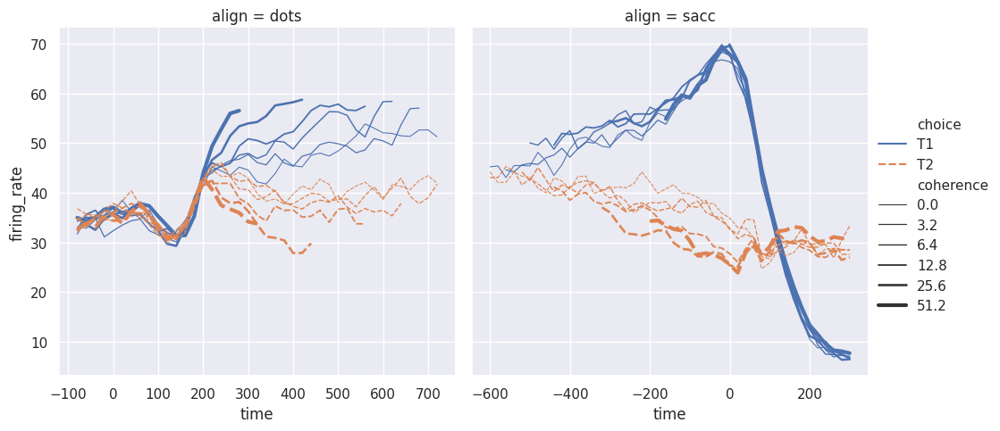

In [90]:
dots=sns.load_dataset("dots")

sns.relplot(
    data=dots,kind="line",x="time",y="firing_rate",col="align",hue="choice",style="choice",size="coherence",facet_kws=dict(sharex=False)
)

# sharex=False ensures each subplot has its own xaxis

In [13]:
dots.head(100)

,align,choice,time,coherence,firing_rate
0,dots,T1,-80,0.0,33.189967
1,dots,T1,-80,3.2,31.691726
2,dots,T1,-80,6.4,34.279840
3,dots,T1,-80,12.8,32.631874
4,dots,T1,-80,25.6,35.060487
...,...,...,...,...,...
95,dots,T1,220,51.2,49.445559
96,dots,T1,240,0.0,44.426667
97,dots,T1,240,3.2,45.557998
98,dots,T1,240,6.4,45.335315


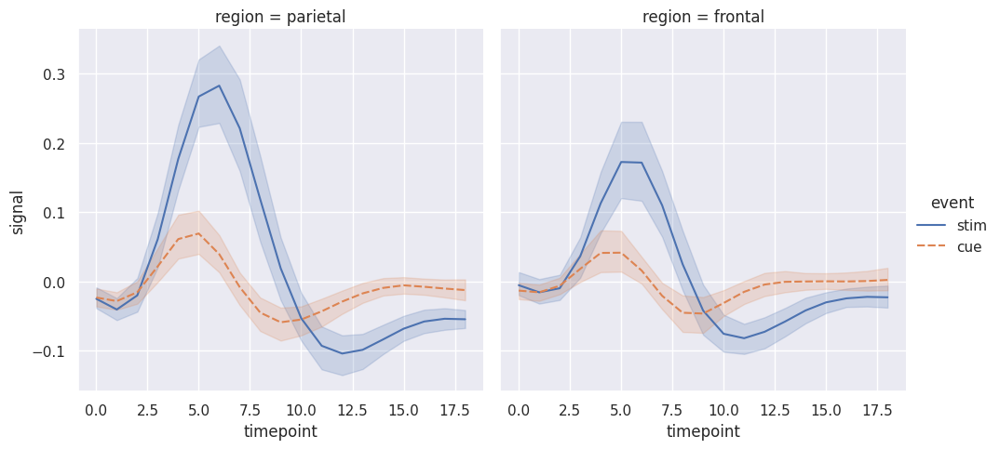

In [9]:
fmri=sns.load_dataset("fmri")
sns.relplot(data=fmri,kind="line",x="timepoint",y="signal",col="region",hue="event",style="event")

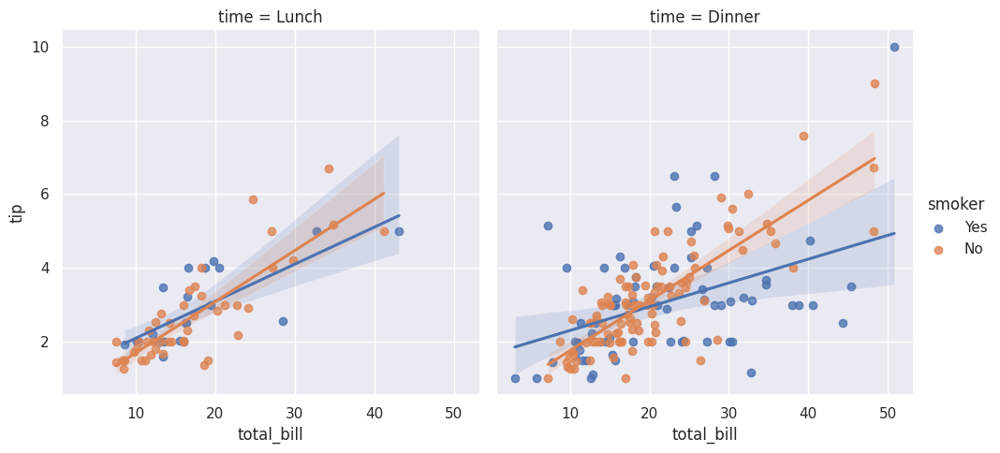

In [15]:
sns.lmplot(data=tips,x="total_bill", y="tip",col="time",hue="smoker")

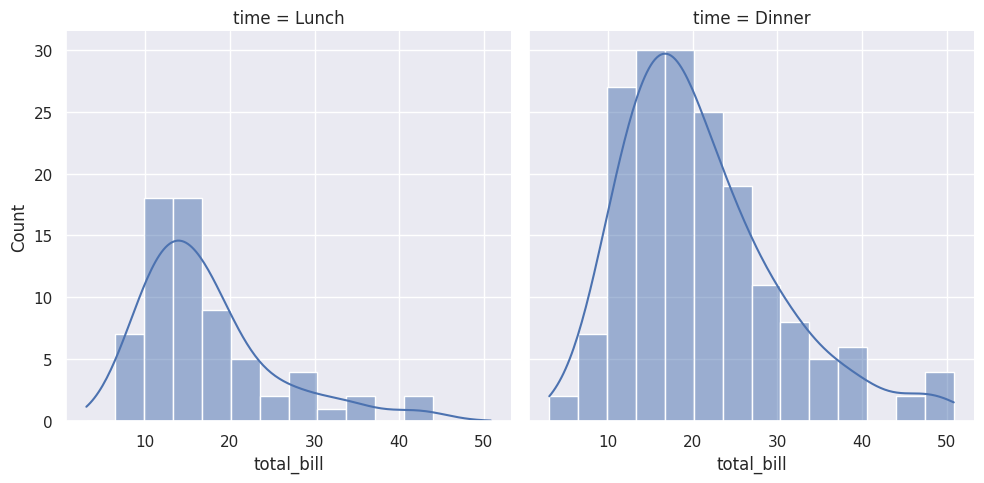

In [16]:
sns.displot(data=tips,x="total_bill",col="time",kde=True)

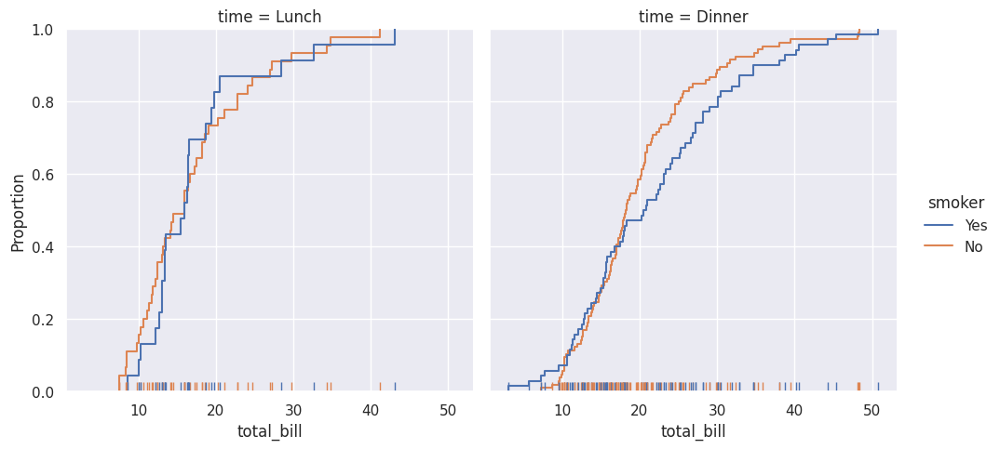

In [17]:
sns.displot(data=tips,kind="ecdf",x="total_bill",col="time",hue="smoker",rug=True)  #emprical cumlative distribution function

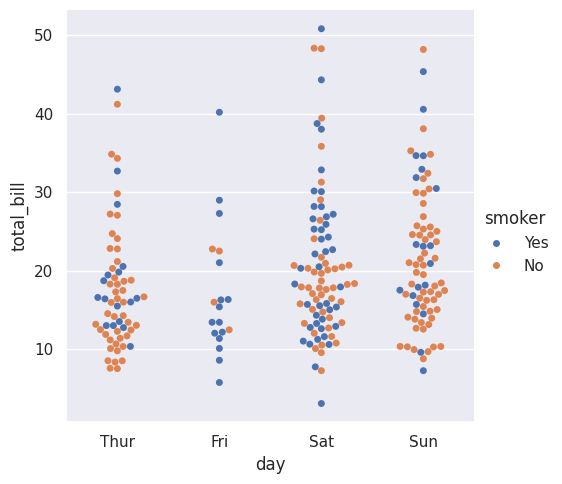

In [18]:
# categorical plotting
sns.catplot(data=tips,kind="swarm",x="day",y="total_bill",hue="smoker")

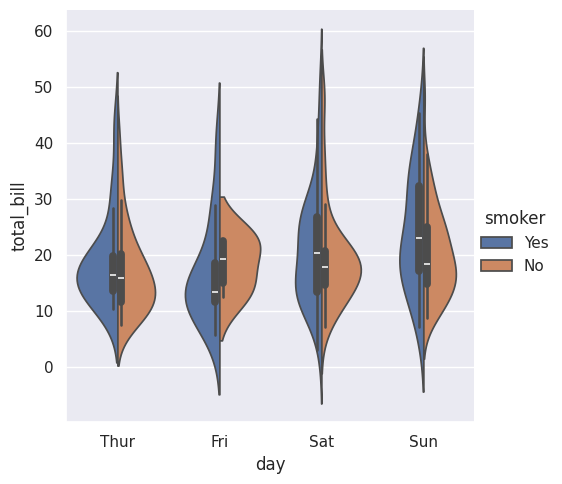

In [19]:
sns.catplot(data=tips,kind="violin",x="day",y="total_bill",hue="smoker",split=True)

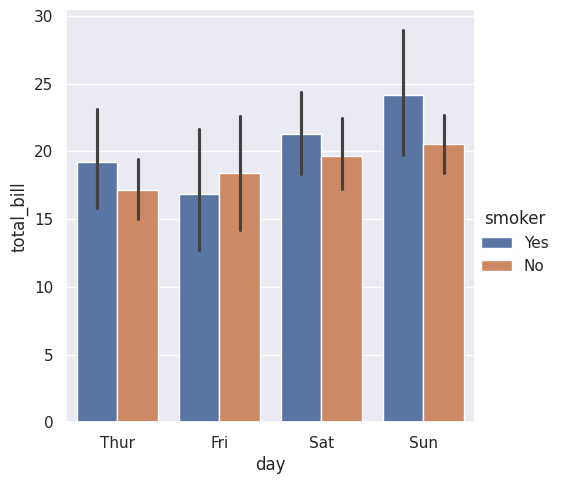

In [20]:
sns.catplot(data=tips,kind="bar",x="day",y="total_bill",hue="smoker")

## Multivariate views on complex datasets

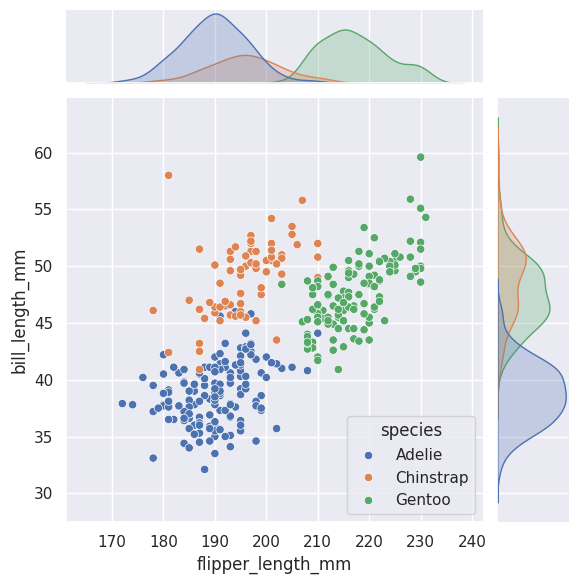

In [15]:
penguins=sns.load_dataset("penguins")
sns.jointplot(data=penguins,x="flipper_length_mm",y="bill_length_mm",hue="species") #for marginal and joint distribution
# it plots the relationship or joint distribution of 2 variables while adding marginal axes that show the univariate distribution of each one seprateley

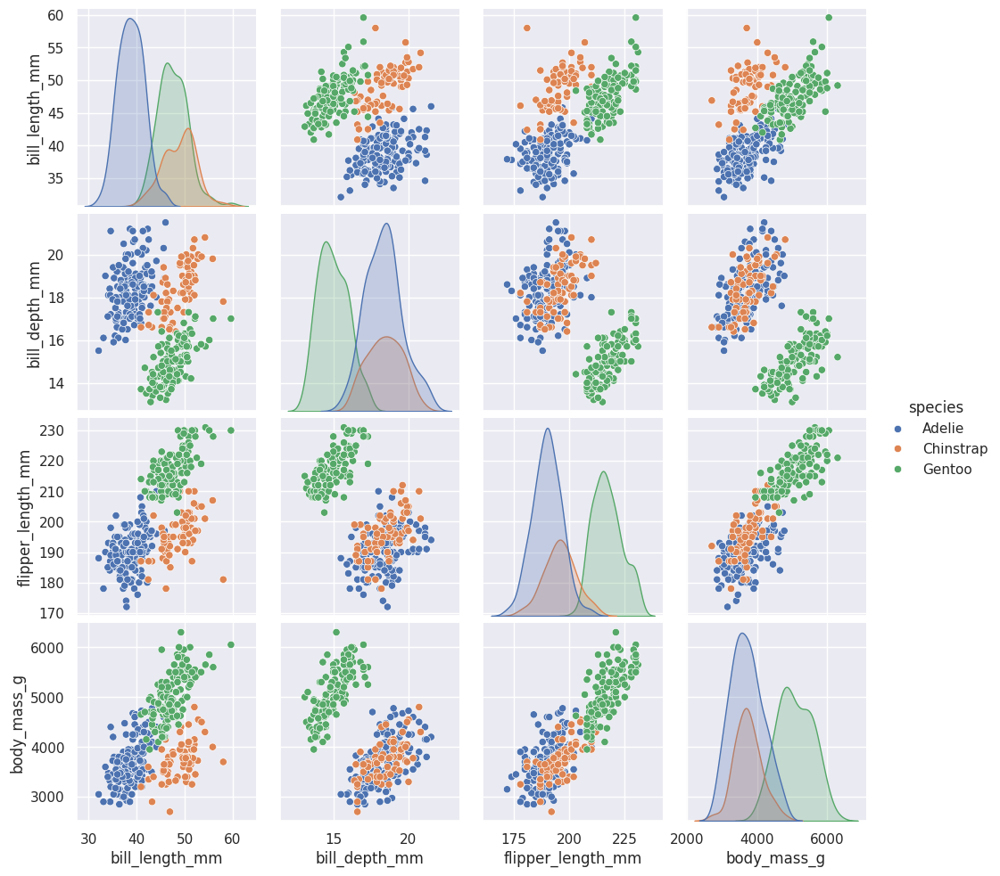

In [23]:
sns.pairplot(data=penguins,hue="species")  #combine joint and marginal views- but rather than focusing on single relationship, it visualizes every pairwise combination of variables simultaneously

Behind the scenes these functions are using axes level functions, they also have a kind parameter that lets you quickly swap in a different representation

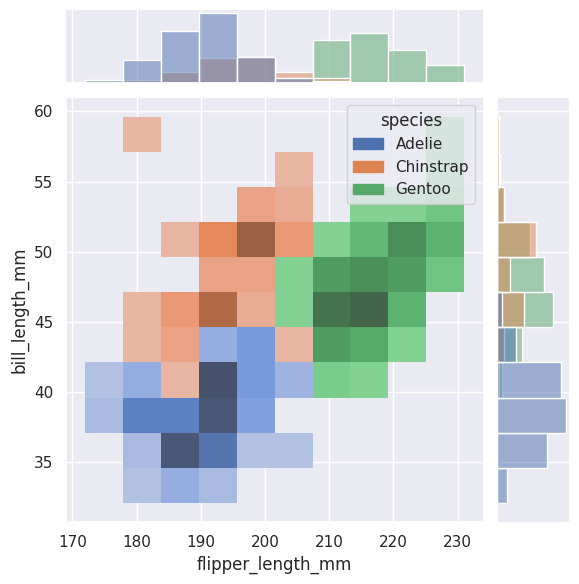

In [17]:
sns.jointplot(data=penguins,x="flipper_length_mm",y="bill_length_mm",hue="species",kind="hist")

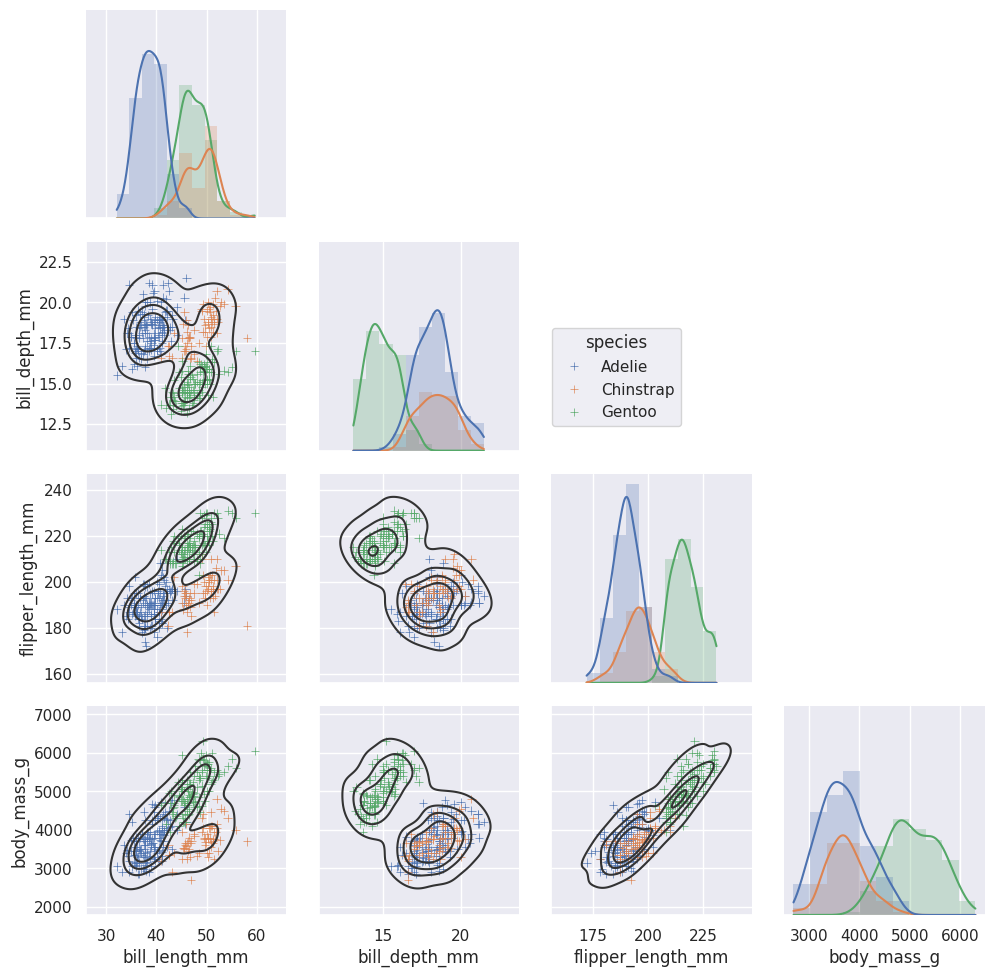

In [24]:
g=sns.PairGrid(penguins,hue="species",corner=True)
g.map_lower(sns.kdeplot,hue=None,levels=5,color=".2")
g.map_lower(sns.scatterplot,marker="+")
g.map_diag(sns.histplot,element="step",linewidth=0,kde=True)
g.add_legend(frameon=True)
g.legend.set_bbox_to_anchor((.61,.6))

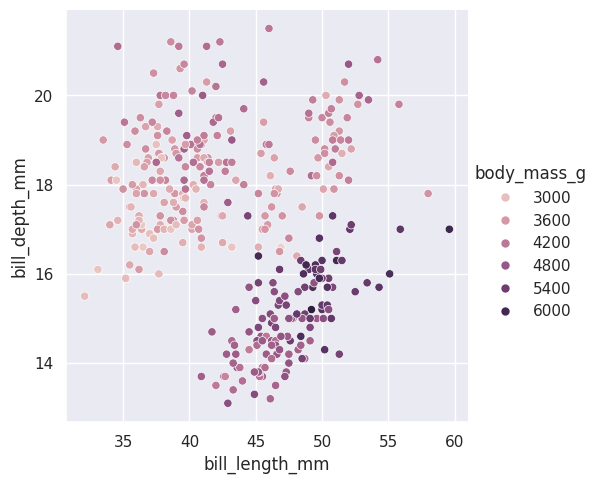

In [26]:
# when mapping a numeric variable some functions will switch to a continuous gradient of color whereas categorical it will vice versa

sns.relplot(
    data=penguins,
    x="bill_length_mm",y="bill_depth_mm",hue="body_mass_g"
)

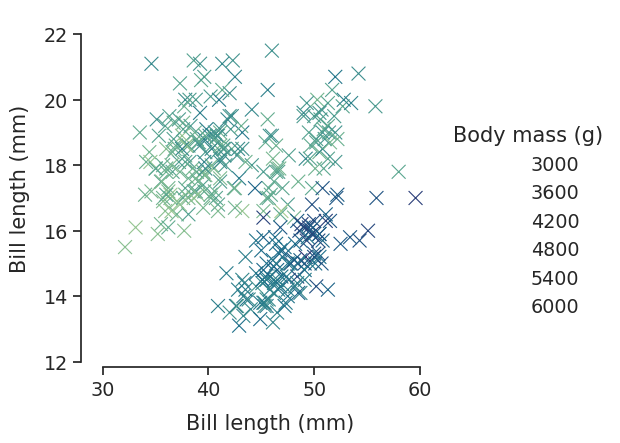

In [27]:
# customization to default values
sns.set_theme(style="ticks",font_scale=1.25)
g=sns.relplot(
    data=penguins,
    x="bill_length_mm",y="bill_depth_mm",hue="body_mass_g",
    palette="crest",marker="x",s=100,
)


g.set_axis_labels("Bill length (mm)","Bill length (mm)",labelpad=10)
g.legend.set_title("Body mass (g)")
g.figure.set_size_inches(6.5,4.5)
g.ax.margins(.15)
g.despine(trim=True)


# Overview of seaborn plotting function

### Axes level functions

<Axes: xlabel='flipper_length_mm', ylabel='Count'>

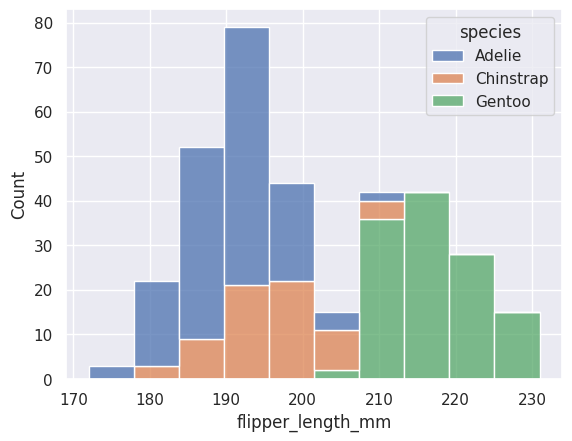

In [3]:
penguins=sns.load_dataset("penguins")
sns.histplot(data=penguins,x="flipper_length_mm",hue="species",multiple="stack")

<Axes: xlabel='flipper_length_mm', ylabel='Density'>

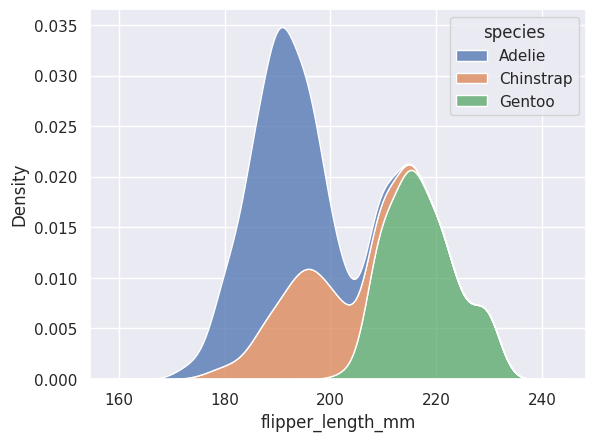

In [4]:
sns.kdeplot(data=penguins,x="flipper_length_mm",hue="species",multiple="stack")

### figure-level plots

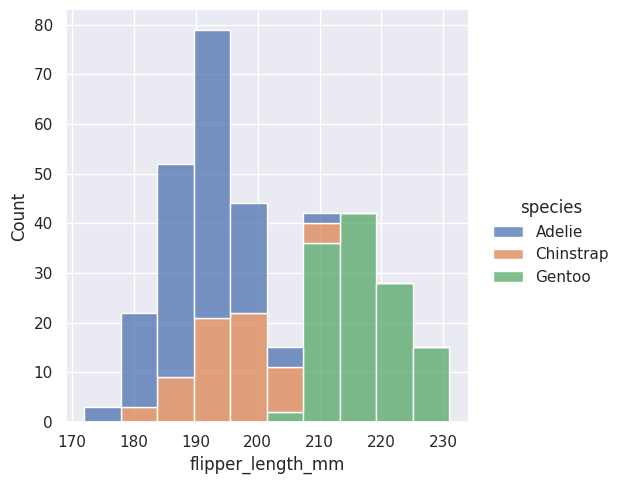

In [5]:
sns.displot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack")

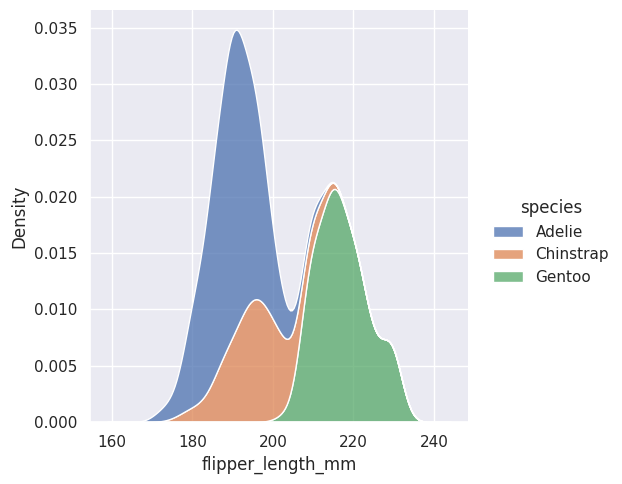

In [6]:
#  figure-level functions is that they can easily create figures with multiple subplots.
sns.displot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack", kind="kde")

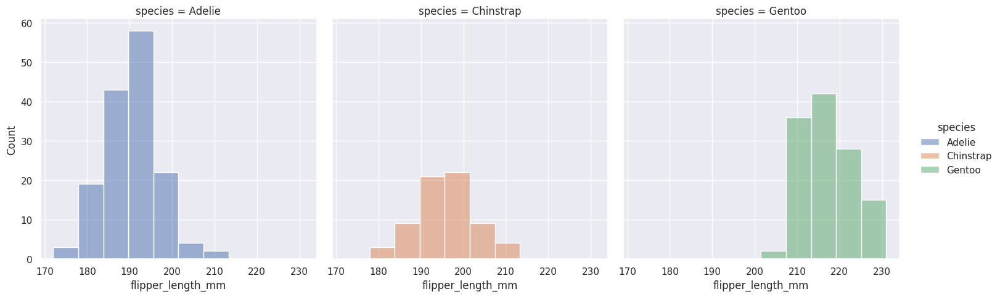

In [7]:
sns.displot(data=penguins, x="flipper_length_mm", hue="species", col="species")


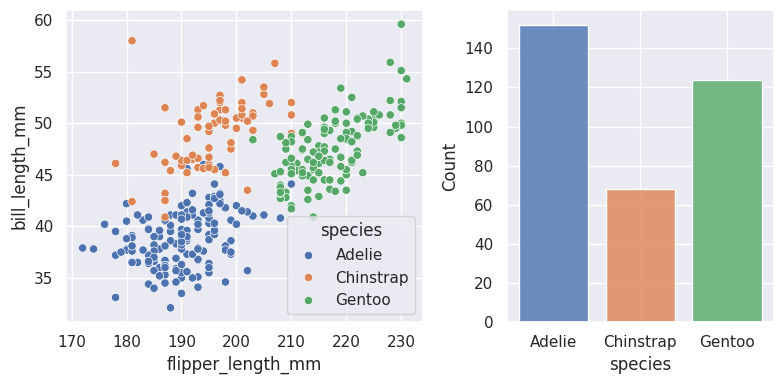

In [5]:
import matplotlib.pyplot as plt

# axes-level function make self-contained plots

f, axs = plt.subplots(1, 2, figsize=(8, 4), gridspec_kw=dict(width_ratios=[4, 3]))

sns.scatterplot(data=penguins, x="flipper_length_mm", y="bill_length_mm", hue="species", ax=axs[0])
sns.histplot(data=penguins, x="species", hue="species", shrink=.8, alpha=.8, legend=False, ax=axs[1])

f.tight_layout()

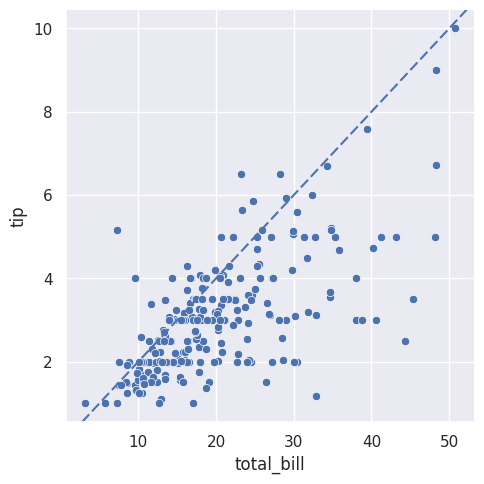

In [7]:
# figure-level functions own their figure
tips=sns.load_dataset("tips")
g=sns.relplot(data=tips,x="total_bill",y="tip")
g.ax.axline(xy1=(10,2),slope=.2,color='b',dashes=(5,2))

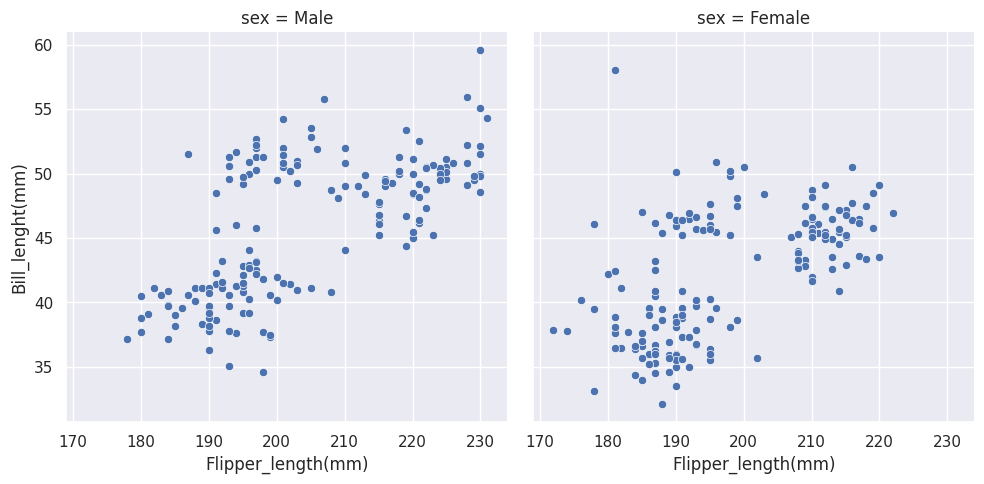

In [8]:
#customizing plots from a figure level function
g=sns.relplot(data=penguins,x="flipper_length_mm",y="bill_length_mm",col="sex")
g.set_axis_labels("Flipper_length(mm)","Bill_lenght(mm)")

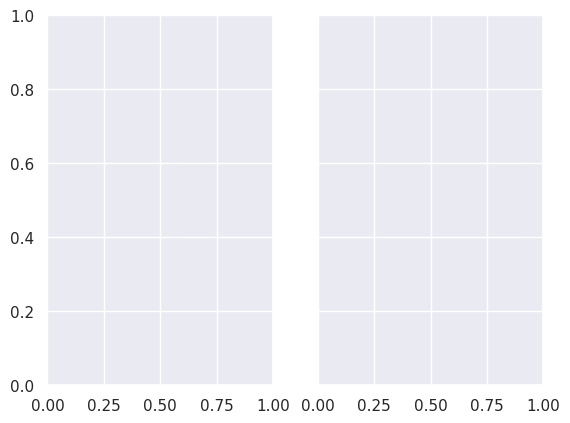

In [10]:
# specifying figure sizes
f,ax=plt.subplots(1,2,sharey=True)

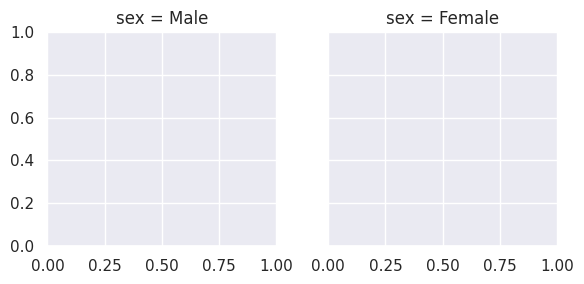

In [12]:
g=sns.FacetGrid(penguins,col="sex")  #a plot created by a figure level function will be sqaure

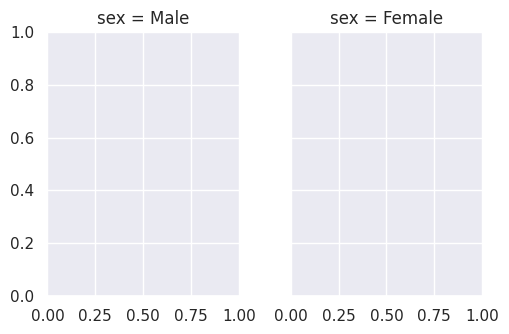

In [14]:
# can adjust the size and shape of each subplot without accounting for the total number of rows and columns

g=sns.FacetGrid(penguins,col="sex",height=3.5,aspect=.75)

Figure level function produce slighlty cleaner plots.Only in case if we want a standalong figure that composes mutliple different plot kinds, then it is better to set up a figure using matplotlib directly and to fill individual components using axes level functions

## Data Structures accepted by seaborn

### Long-form data

- Each variable is a column
- Each observation is a row


In [18]:
flights = sns.load_dataset("flights")
flights.head()

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


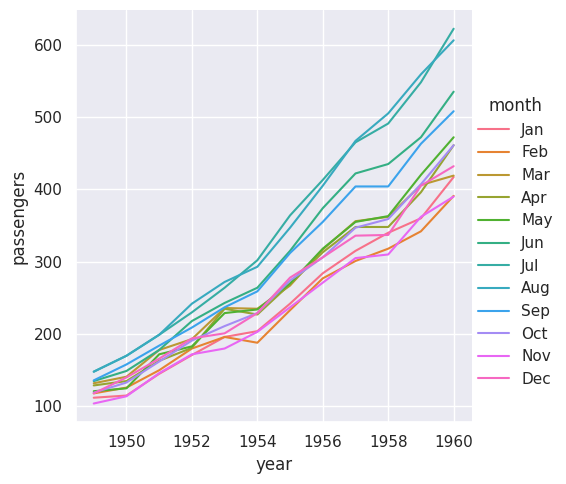

In [19]:
sns.relplot(data=flights, x="year", y="passengers", hue="month", kind="line")

### Wide form data

- For simple datasets, it is often more intuitive to think about data the way it might be viewed in a spreadsheet, where the columns and rows contain levels of different variables
- For example, we can convert the flights dataset into a wide-form organization by “pivoting” it so that each column has each month’s time series over years:

In [20]:
flights_wide = flights.pivot(index="year", columns="month", values="passengers")
flights_wide.head()

month,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
year,,,,,,,,,,,,
1949,112,118,132,129,121,135,148,148,136,119,104,118
1950,115,126,141,135,125,149,170,170,158,133,114,140
1951,145,150,178,163,172,178,199,199,184,162,146,166
1952,171,180,193,181,183,218,230,242,209,191,172,194
1953,196,196,236,235,229,243,264,272,237,211,180,201


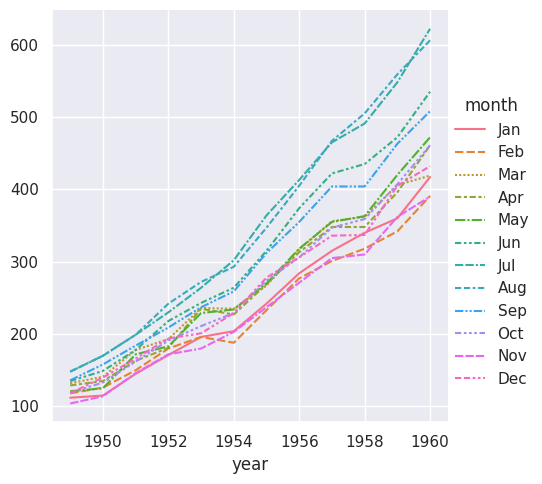

In [21]:
sns.relplot(data=flights_wide, kind="line")

There is a notable difference between the two plots, however. When the dataset went through the “pivot” operation that converted it from long-form to wide-form, the information about what the values mean was lost. As a result, there is no y axis label.

- The advantagle of long-form of data, once you have the data in the correct format, you no longer need to think about its structure. You can design your plots by thinking only about the variables contained within it
- You can design your plots by thinking only about the variables contained within it. 



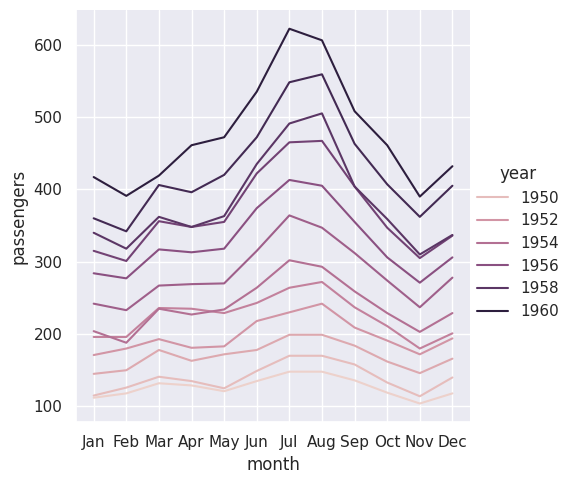

In [22]:
sns.relplot(data=flights, x="month", y="passengers", hue="year", kind="line")

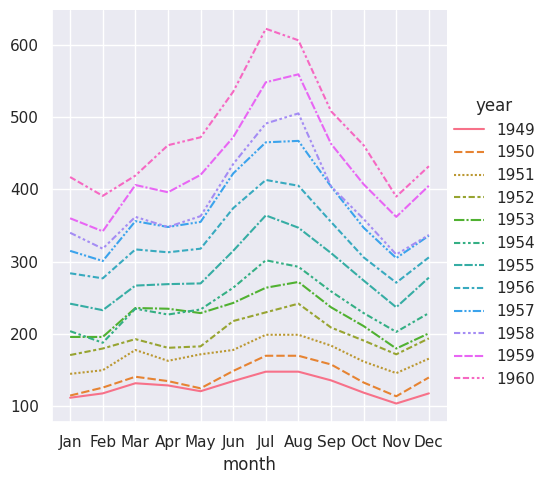

In [23]:
# To achieve the same remapping with the wide-form dataset
sns.relplot(data=flights_wide.transpose(), kind="line")

- The absence of explicit variable assignments also means that each plot type needs to define a fixed mapping between the dimensions of the wide-form data and the roles in the plot.
- Because this natural mapping may vary across plot types, the results are less predictable when using wide-form data.


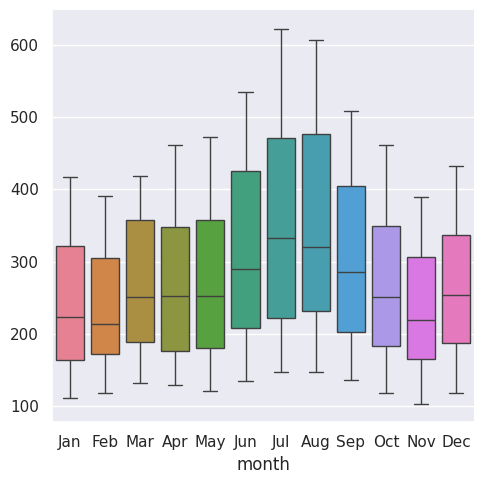

In [24]:
sns.catplot(data=flights_wide, kind="box")

- Because this natural mapping may vary across plot types, the results are less predictable when using wide-form data.
- This is because seaborn does not make use of multi-index information, which is how pandas represents additional variables in a tabular format.

### Messy Data

In [25]:
anagrams = sns.load_dataset("anagrams")
anagrams

,subidr,attnr,num1,num2,num3
0,1,divided,2,4.0,7
1,2,divided,3,4.0,5
2,3,divided,3,5.0,6
3,4,divided,5,7.0,5
4,5,divided,4,5.0,8
5,6,divided,5,5.0,6
6,7,divided,5,4.5,6
7,8,divided,5,7.0,8
8,9,divided,2,3.0,7
9,10,divided,6,5.0,6


In [26]:
# We’d first need to coerce the data into one of our two structures. Let’s transform it to a tidy long-form table, such that each variable is a column and each row is an observation. 
anagrams_long = anagrams.melt(id_vars=["subidr", "attnr"], var_name="solutions", value_name="score")
anagrams_long.head()

,subidr,attnr,solutions,score
0,1,divided,num1,2.0
1,2,divided,num1,3.0
2,3,divided,num1,3.0
3,4,divided,num1,5.0
4,5,divided,num1,4.0


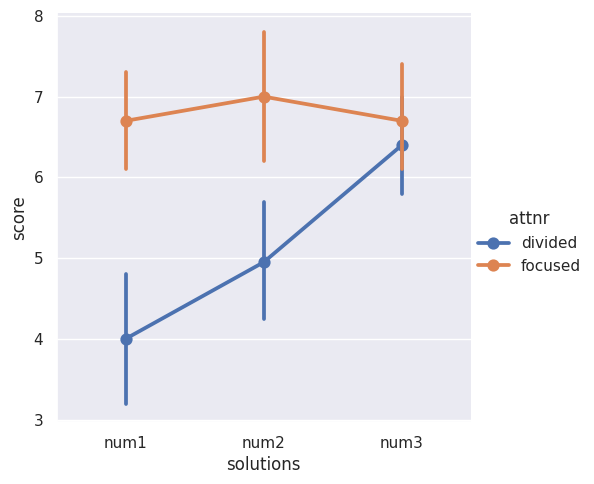

In [27]:
sns.catplot(data=anagrams_long, x="solutions", y="score", hue="attnr", kind="point")

### Options for visualising wide form of data

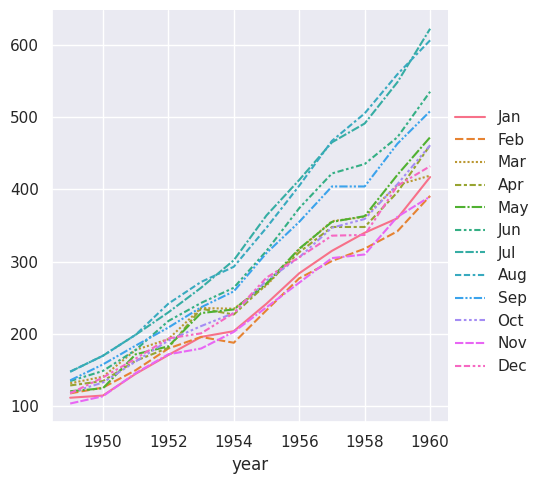

In [28]:
flights_wide_list = [col for _, col in flights_wide.items()]
sns.relplot(data=flights_wide_list, kind="line")

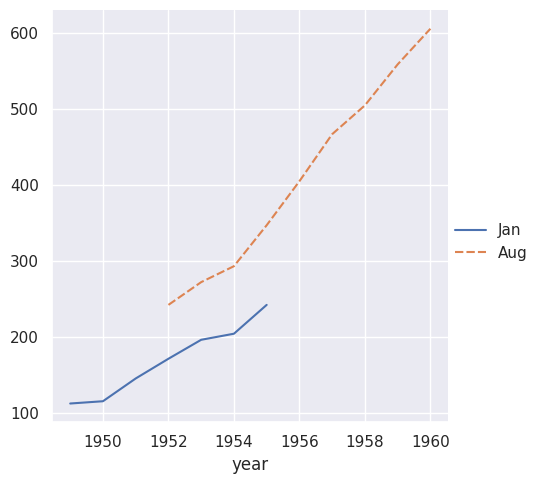

In [29]:
# The vectors in a collection do not need to have the same length. If they have an index, it will be used to align them:
two_series = [flights_wide.loc[:1955, "Jan"], flights_wide.loc[1952:, "Aug"]]
sns.relplot(data=two_series, kind="line")

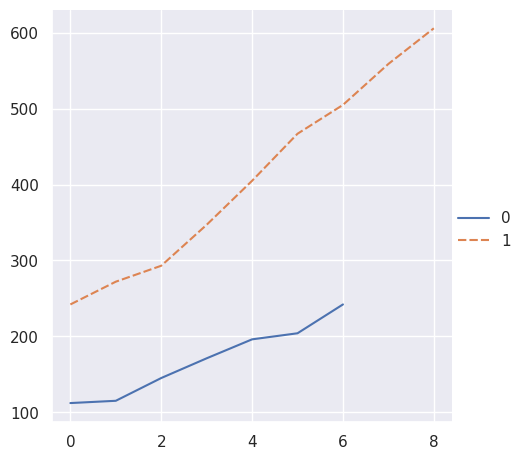

In [30]:
# Whereas an ordinal index will be used for numpy arrays or simple Python sequences:
two_arrays = [s.to_numpy() for s in two_series]
sns.relplot(data=two_arrays, kind="line")



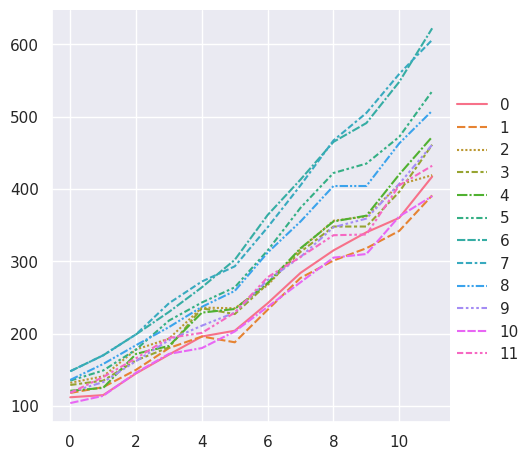

In [32]:
flights_array = flights_wide.to_numpy()
sns.relplot(data=flights_array, kind="line")

## The seaborn object interface

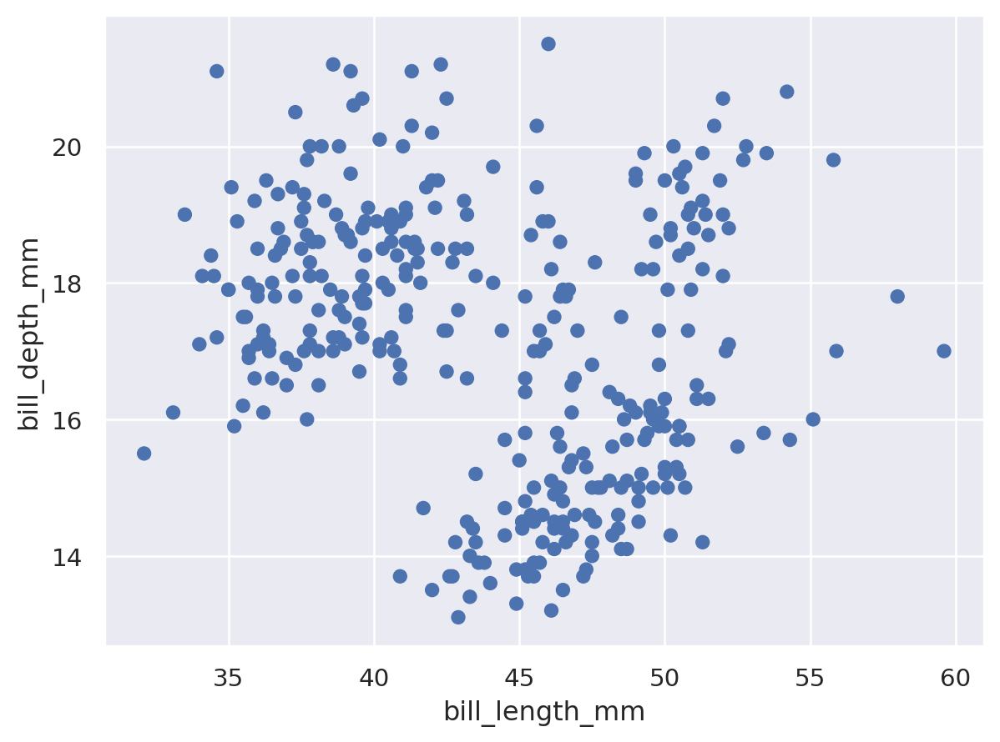

In [33]:
import seaborn.objects as so
(
    so.Plot(penguins, x="bill_length_mm", y="bill_depth_mm")
    .add(so.Dot())
)

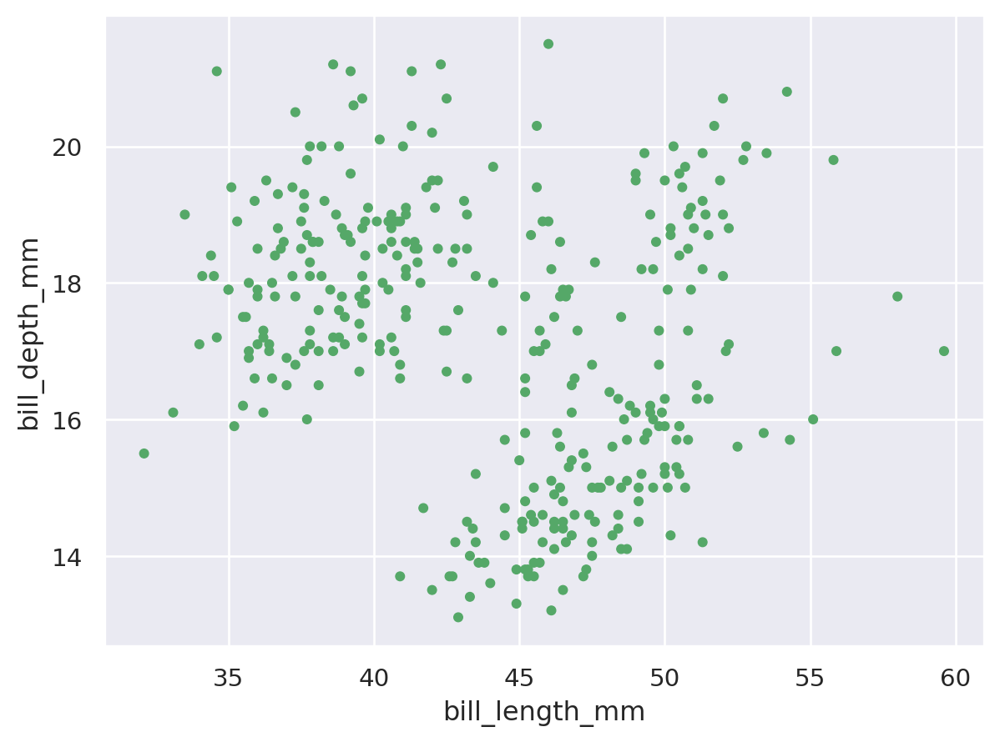

In [34]:
# setting properties

(
    so.Plot(penguins, x="bill_length_mm", y="bill_depth_mm")
    .add(so.Dot(color="g", pointsize=4))
)


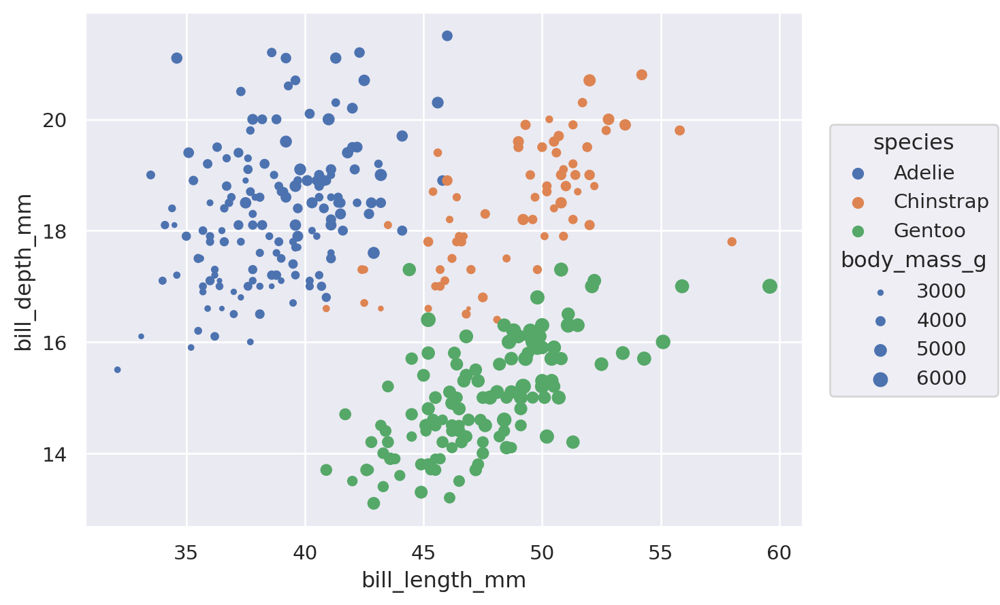

In [35]:
# Mapping properties
(
    so.Plot(
        penguins, x="bill_length_mm", y="bill_depth_mm",
        color="species", pointsize="body_mass_g",
    )
    .add(so.Dot())
)

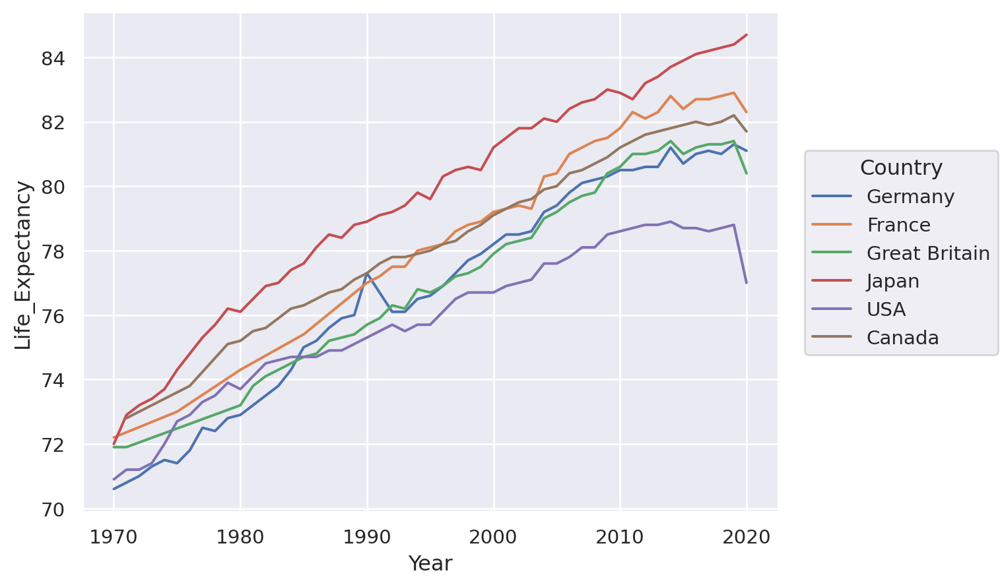

In [37]:
# defining groups
healthexp=sns.load_dataset("healthexp")
(
    so.Plot(healthexp, x="Year", y="Life_Expectancy", color="Country")
    .add(so.Line())
)

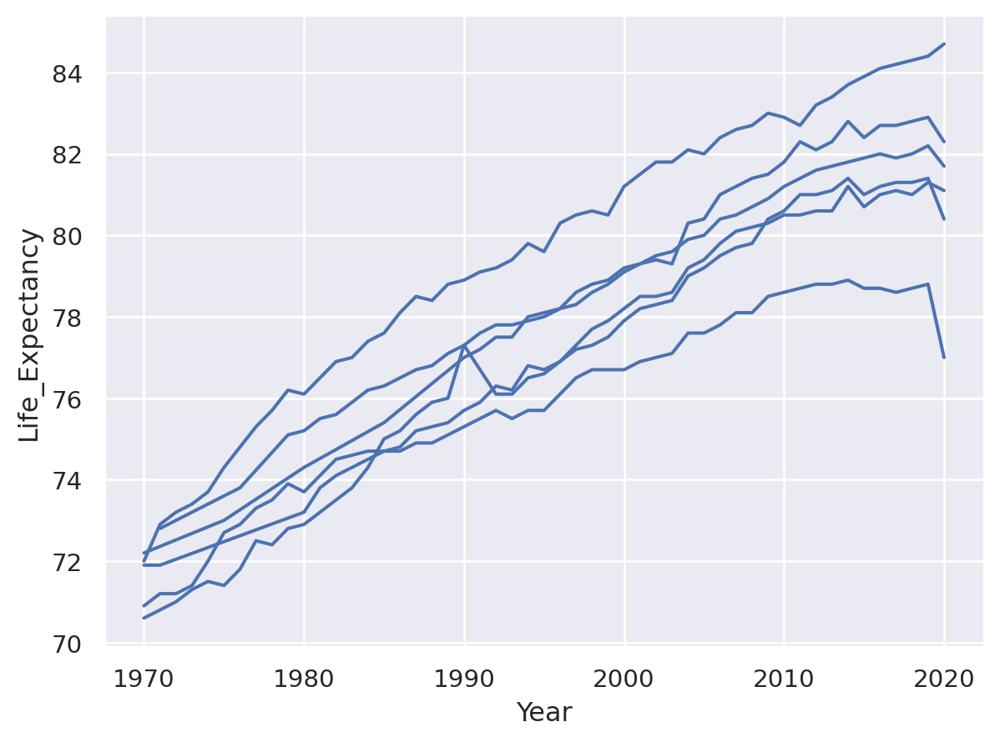

In [38]:
(
    so.Plot(healthexp, x="Year", y="Life_Expectancy", group="Country")
    .add(so.Line())
)

### Tranforming data before plotting

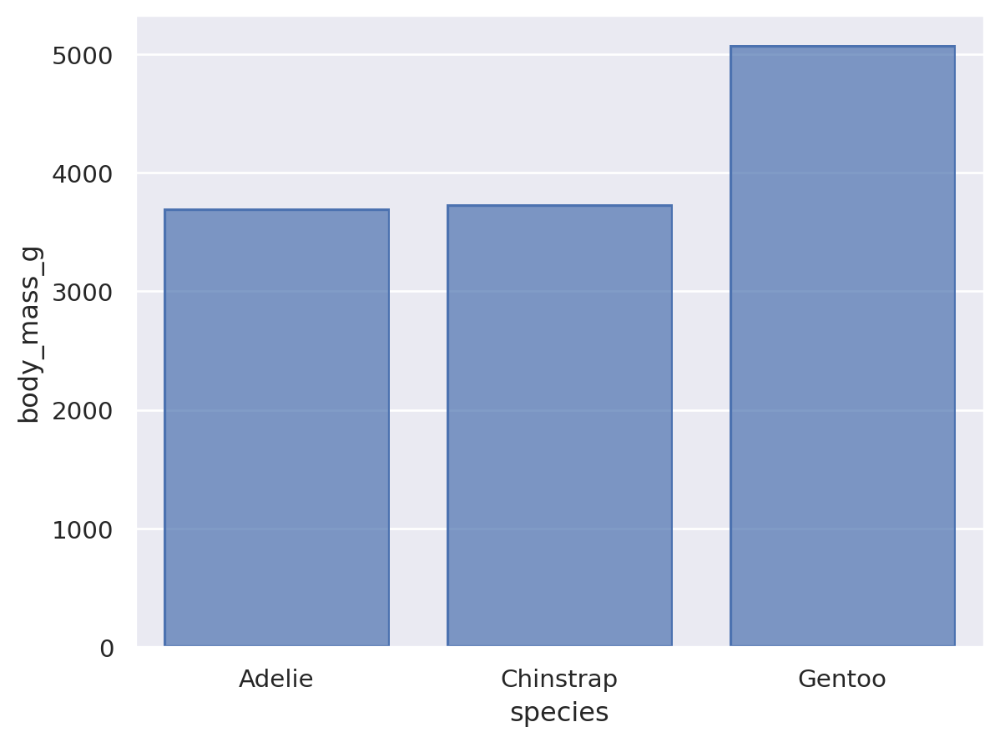

In [39]:
(
    so.Plot(penguins, x="species", y="body_mass_g")
    .add(so.Bar(), so.Agg())
)

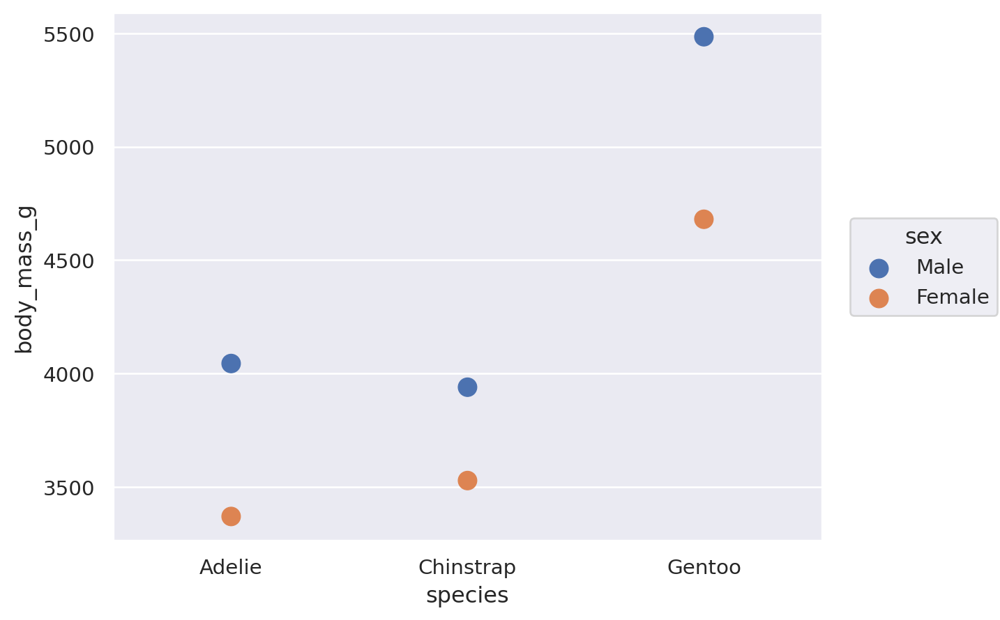

In [41]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dot(pointsize=10), so.Agg())
)

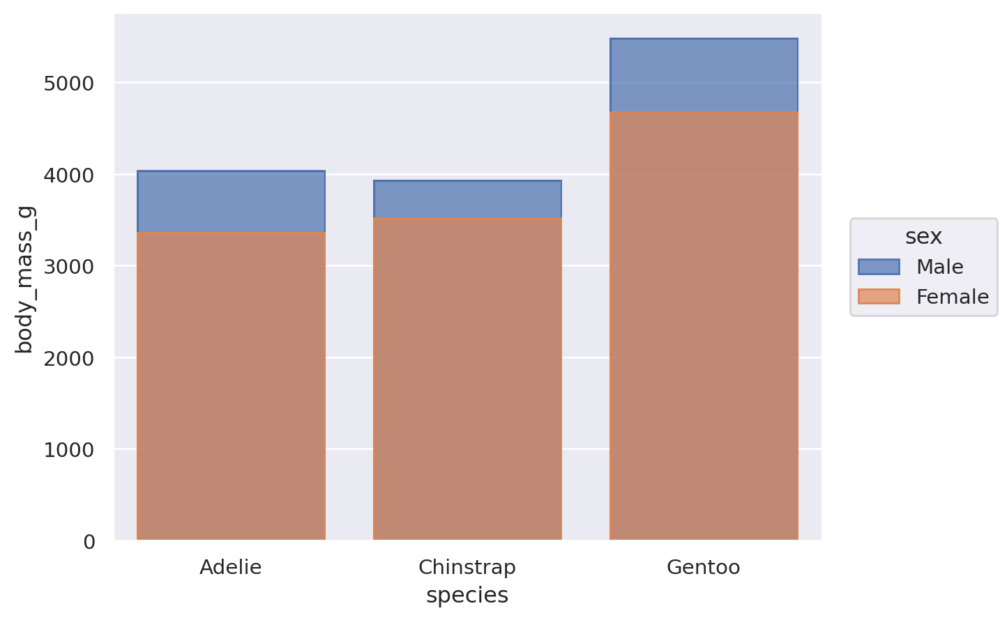

In [42]:
# Resolving overplotting
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Bar(), so.Agg())
)


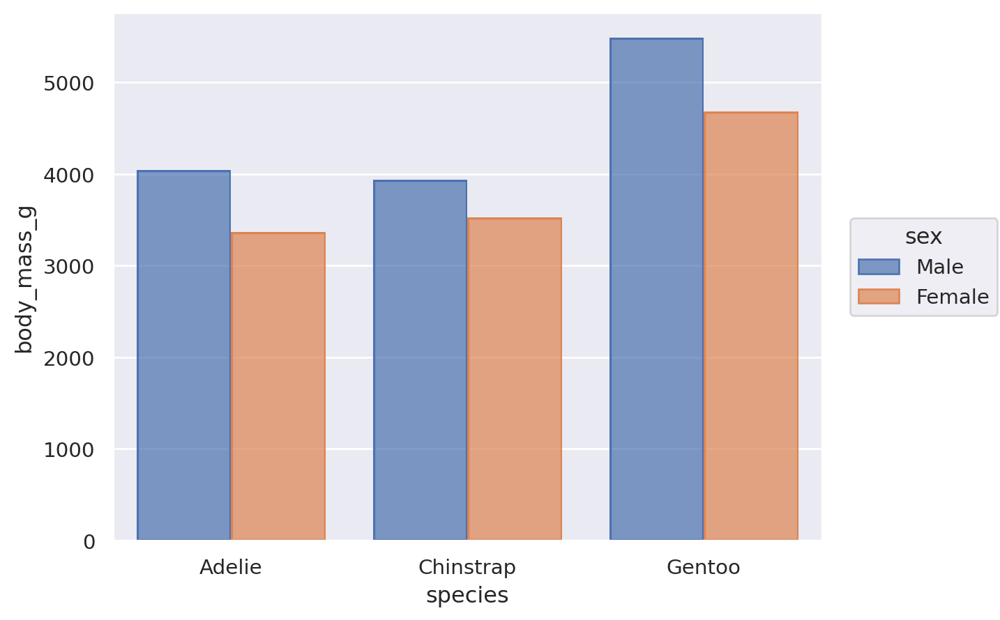

In [43]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Bar(), so.Agg(), so.Dodge())
)

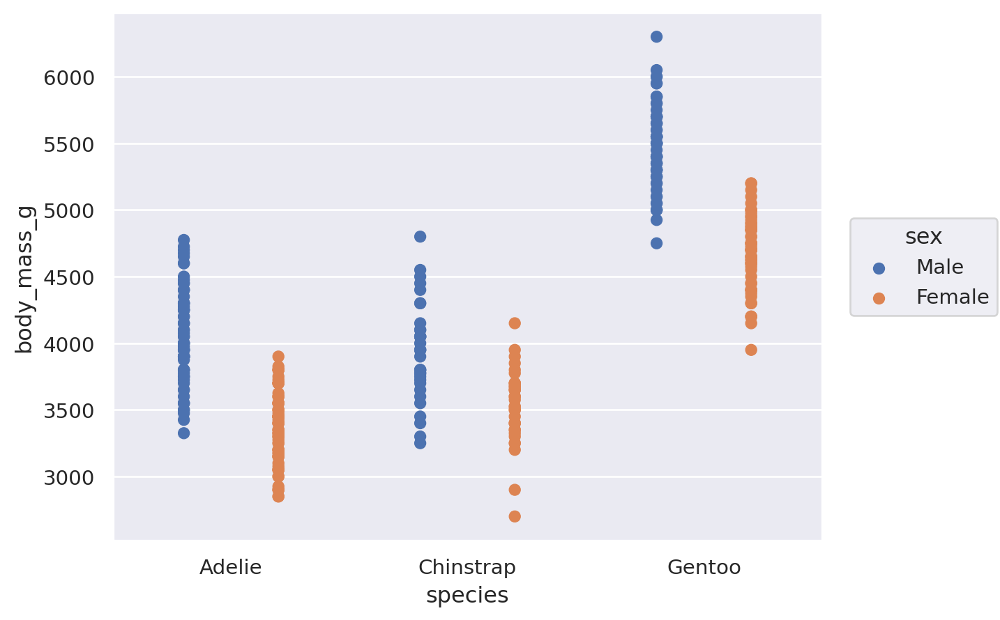

In [44]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dot(), so.Dodge())
)

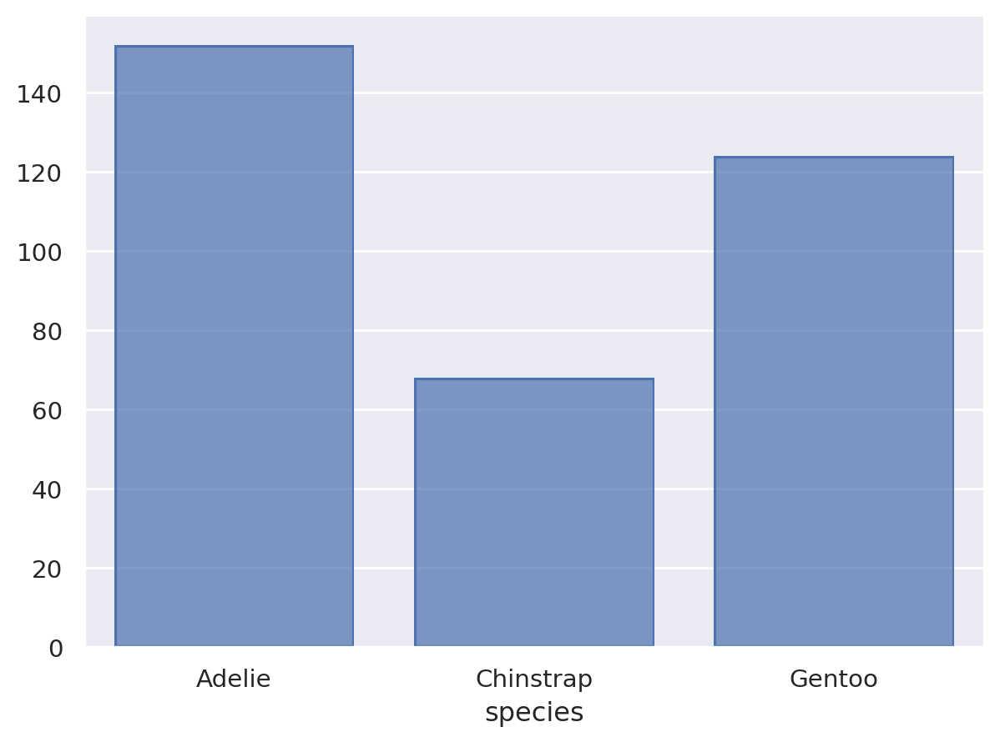

In [45]:
# Creating variables using transformation

(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Hist())
)


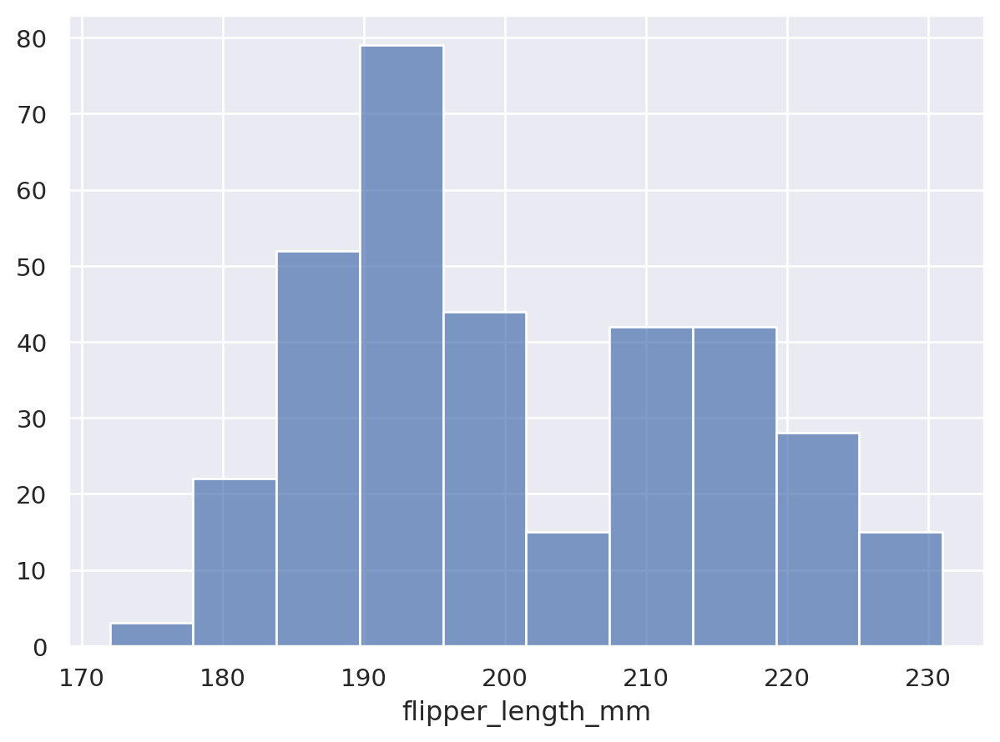

In [46]:
(
    so.Plot(penguins, x="flipper_length_mm")
    .add(so.Bars(), so.Hist())
)

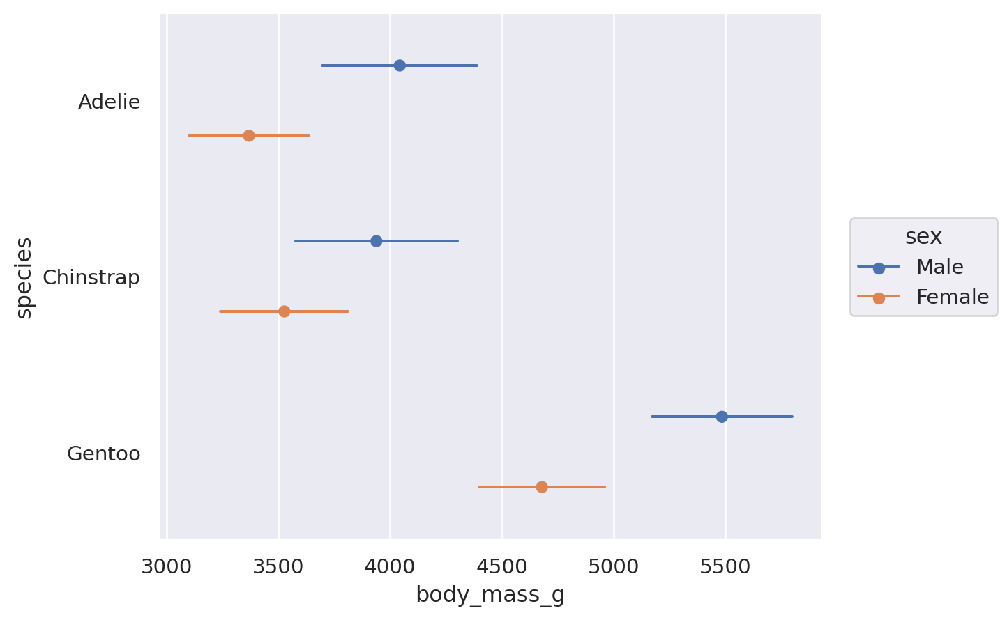

In [47]:
(
    so.Plot(penguins, x="body_mass_g", y="species", color="sex")
    .add(so.Range(), so.Est(errorbar="sd"), so.Dodge())
    .add(so.Dot(), so.Agg(), so.Dodge())
)


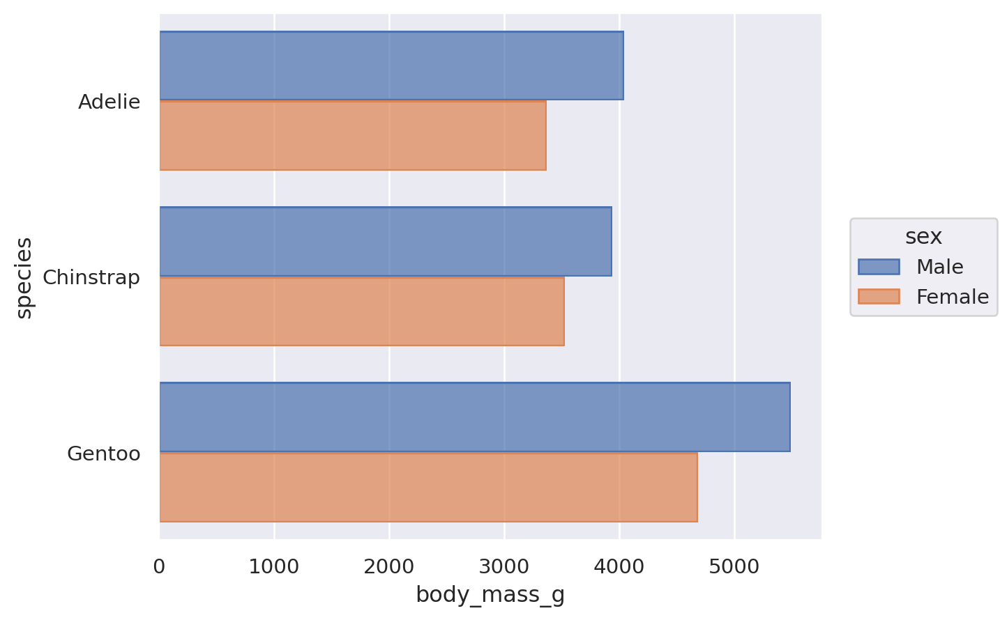

In [48]:
# Orienting marks and transforms
(
    so.Plot(penguins, x="body_mass_g", y="species", color="sex")
    .add(so.Bar(), so.Agg(), so.Dodge())
)

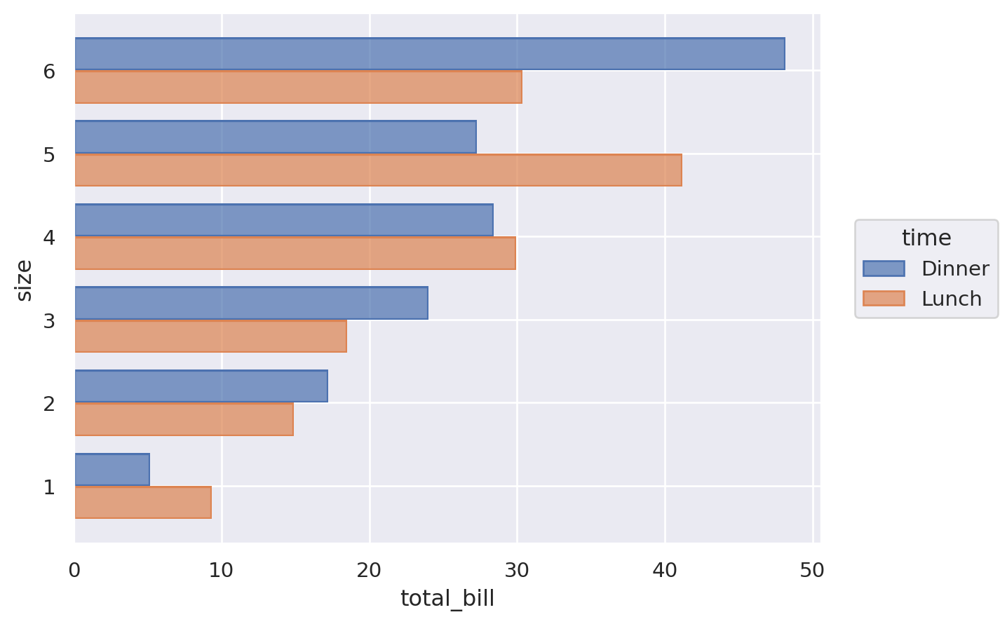

In [49]:
(
    so.Plot(tips, x="total_bill", y="size", color="time")
    .add(so.Bar(), so.Agg(), so.Dodge(), orient="y")
)

### Building and displaying the plot

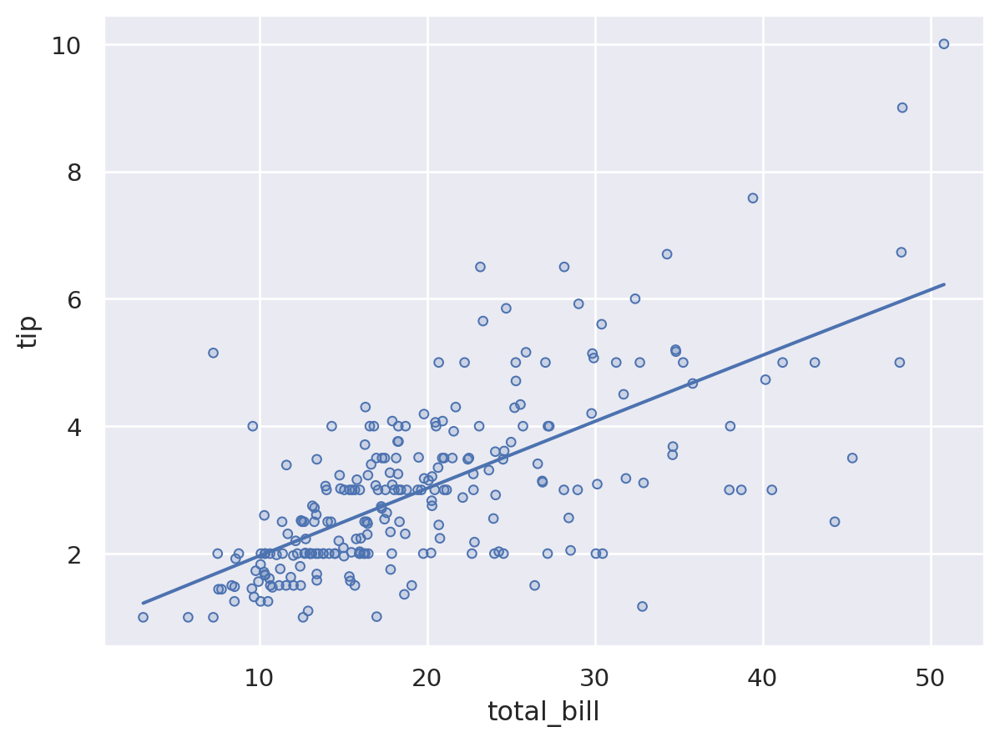

In [52]:
# adding mutliple layers
(
    so.Plot(tips, x="total_bill", y="tip")
    .add(so.Dots())
    .add(so.Line(), so.PolyFit())
)
    

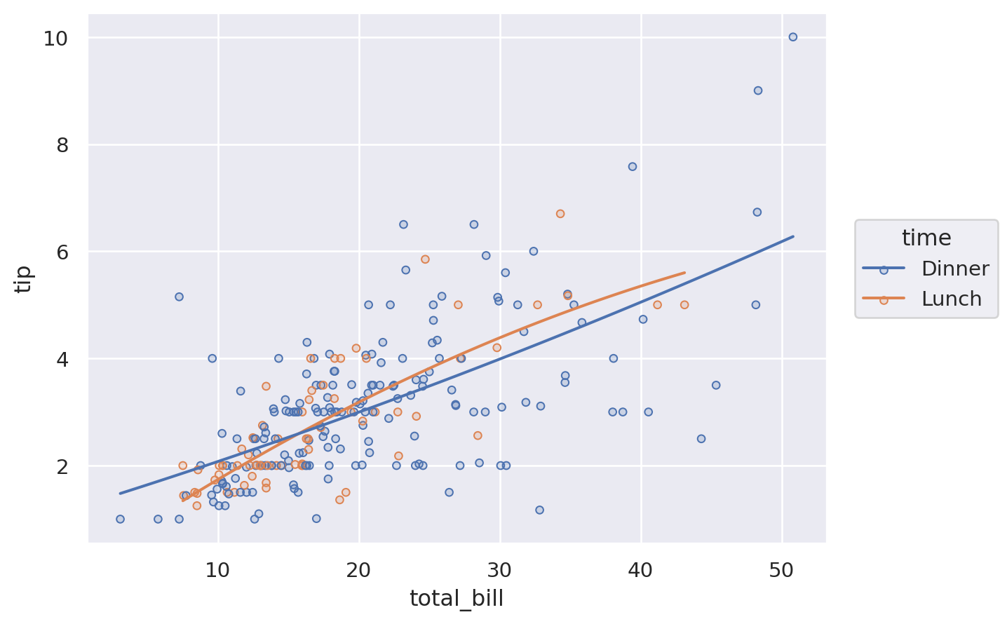

In [53]:
(
    so.Plot(tips, x="total_bill", y="tip", color="time")
    .add(so.Dots())
    .add(so.Line(), so.PolyFit())
)

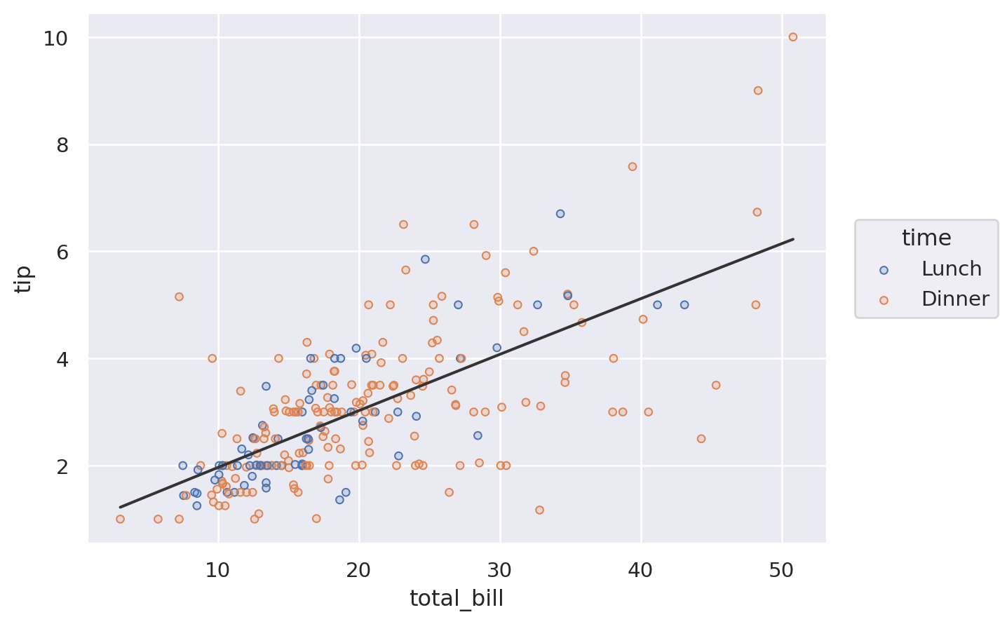

In [55]:
# Layer specific mapping
(
    so.Plot(tips, x="total_bill", y="tip")
    .add(so.Dots(), color="time")
    .add(so.Line(color=".2"), so.PolyFit())
)

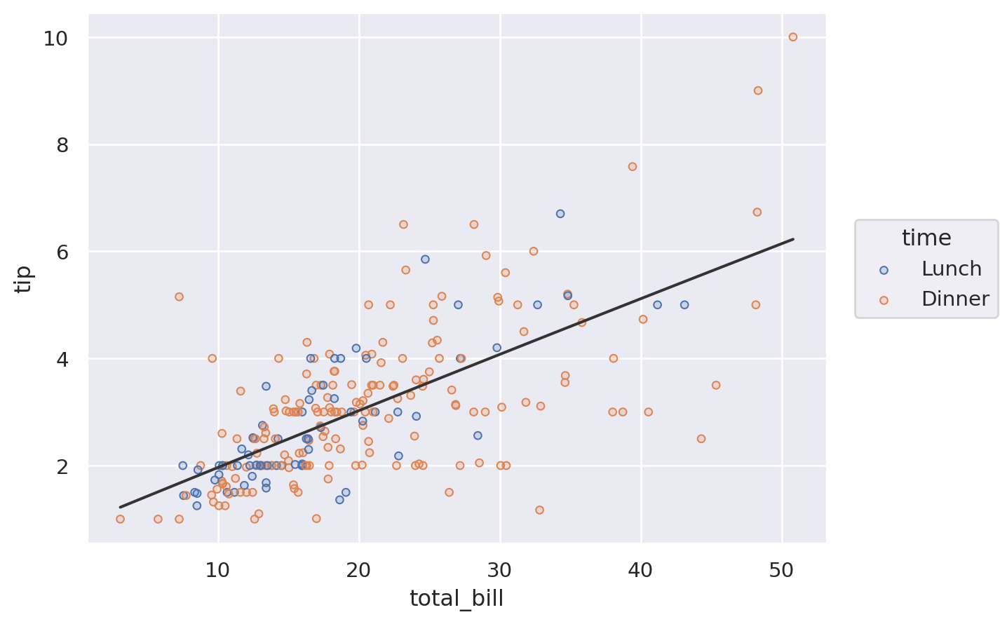

In [56]:
(
    so.Plot(tips, x="total_bill", y="tip", color="time")
    .add(so.Dots())
    .add(so.Line(color=".2"), so.PolyFit(), color=None)
)


3 ways to specify the value of a mark property: 
- By mapping a variable in all layerr
- By mapping a variable in a specific layer
- By setting the property directly:

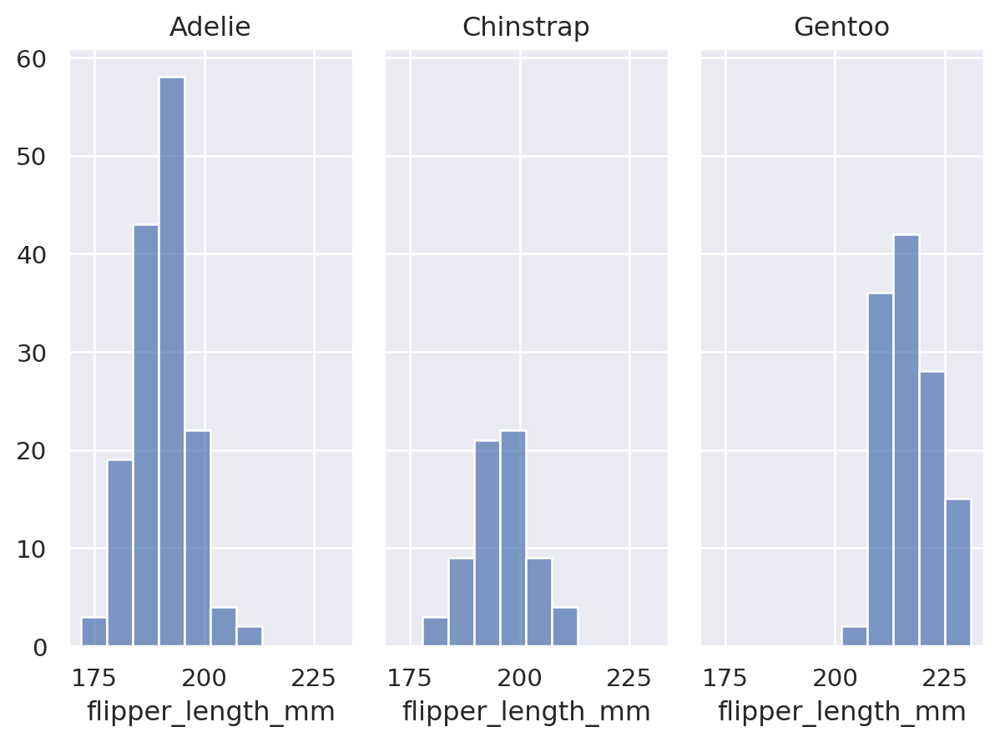

In [57]:
# Faceting and pairing subplots
(
    so.Plot(penguins, x="flipper_length_mm")
    .facet("species")
    .add(so.Bars(), so.Hist())
)


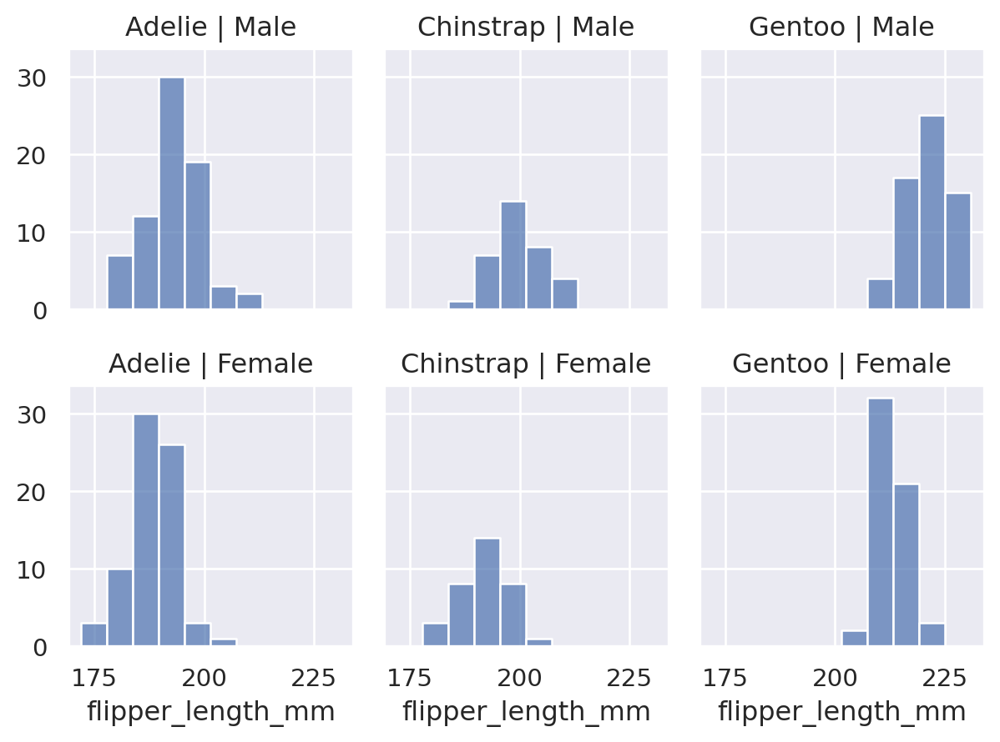

In [58]:
(
    so.Plot(penguins, x="flipper_length_mm")
    .facet(col="species", row="sex")
    .add(so.Bars(), so.Hist())
)

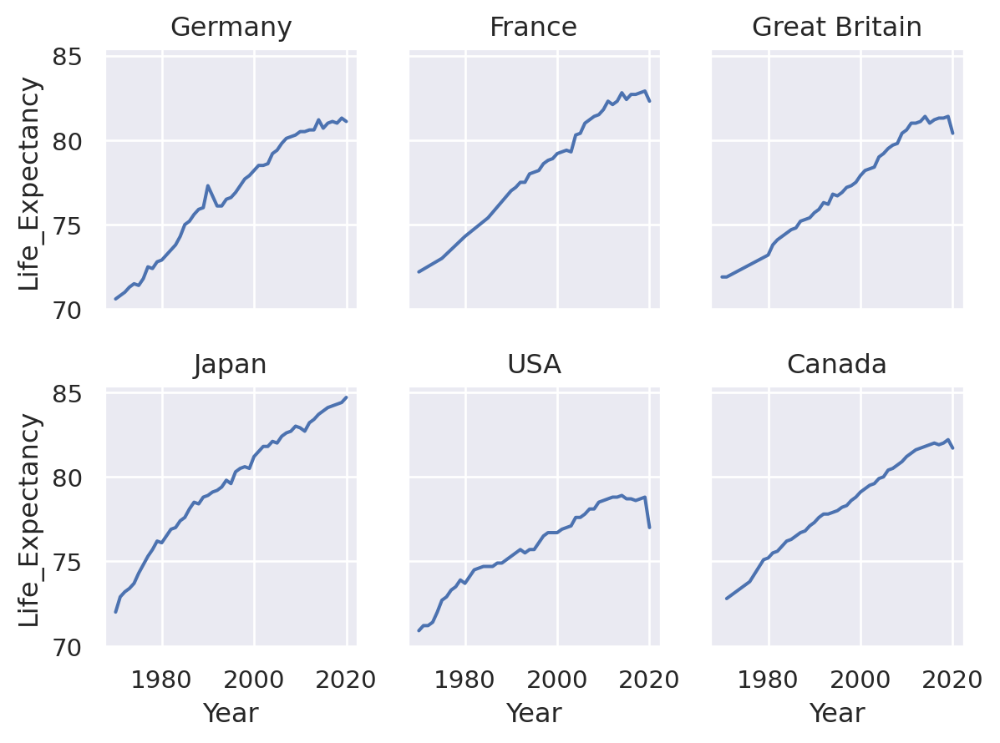

In [59]:
(
    so.Plot(healthexp, x="Year", y="Life_Expectancy")
    .facet(col="Country", wrap=3)
    .add(so.Line())
)

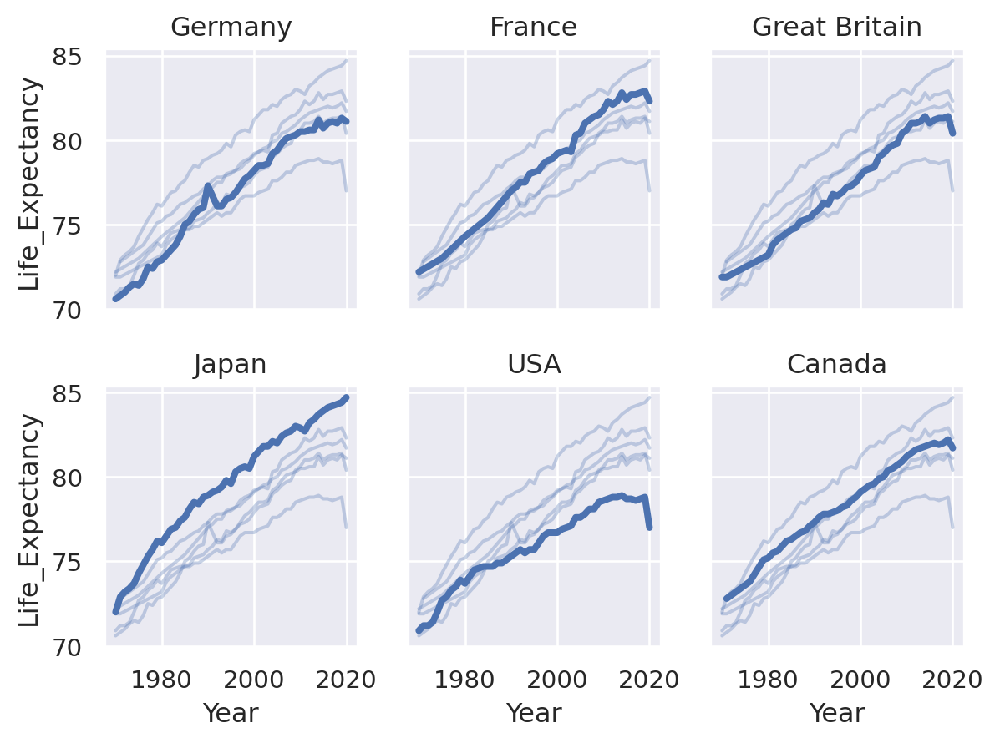

In [60]:
(
    so.Plot(healthexp, x="Year", y="Life_Expectancy")
    .facet("Country", wrap=3)
    .add(so.Line(alpha=.3), group="Country", col=None)
    .add(so.Line(linewidth=3))
)


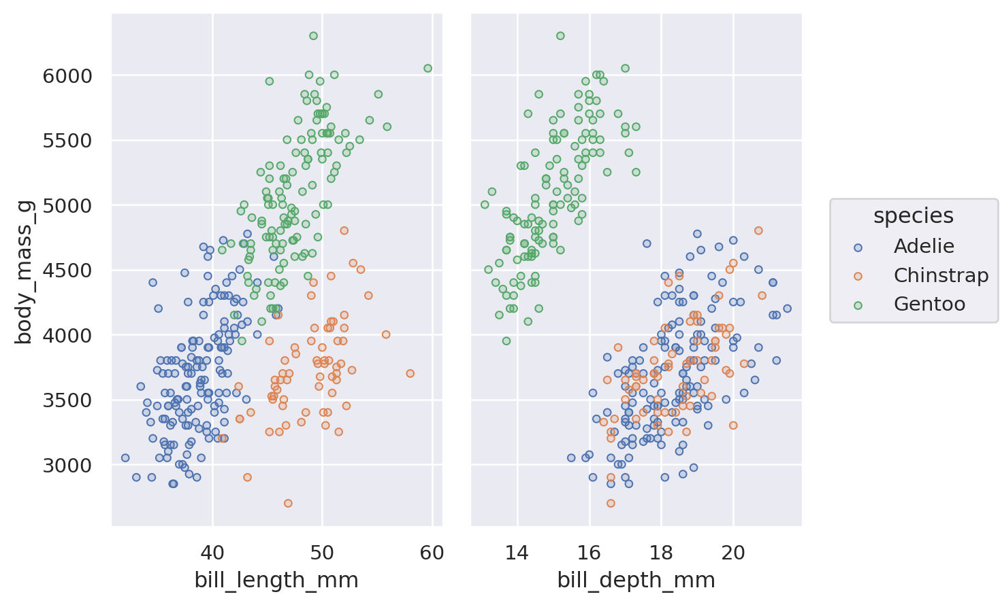

In [61]:
(
    so.Plot(penguins, y="body_mass_g", color="species")
    .pair(x=["bill_length_mm", "bill_depth_mm"])
    .add(so.Dots())
)

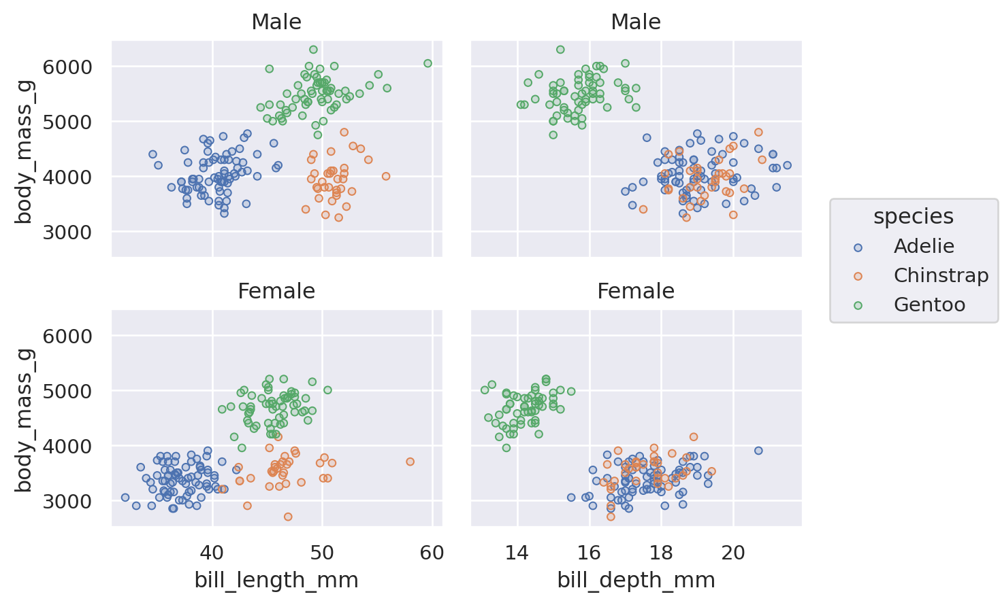

In [62]:
(
    so.Plot(penguins, y="body_mass_g", color="species")
    .pair(x=["bill_length_mm", "bill_depth_mm"])
    .facet(row="sex")
    .add(so.Dots())
)

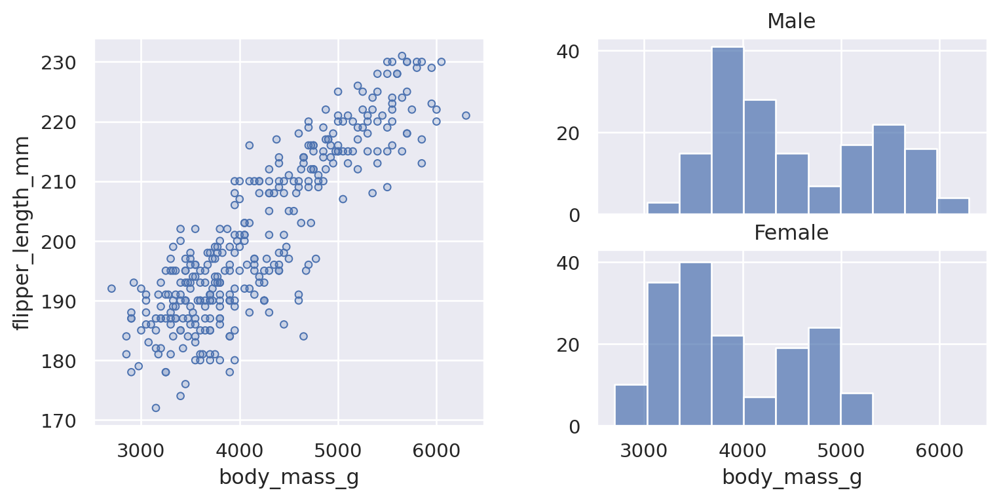

In [65]:
# Integrating with matplotlib
import matplotlib as mpl
f = mpl.figure.Figure(figsize=(8, 4))
sf1, sf2 = f.subfigures(1, 2)
(
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .add(so.Dots())
    .on(sf1)
    .plot()
)
(
    so.Plot(penguins, x="body_mass_g")
    .facet(row="sex")
    .add(so.Bars(), so.Hist())
    .on(sf2)
    .plot()
)


In [ ]:
# building and displaying the plot

In [66]:
p = so.Plot(healthexp, "Year", "Spending_USD", color="Country")

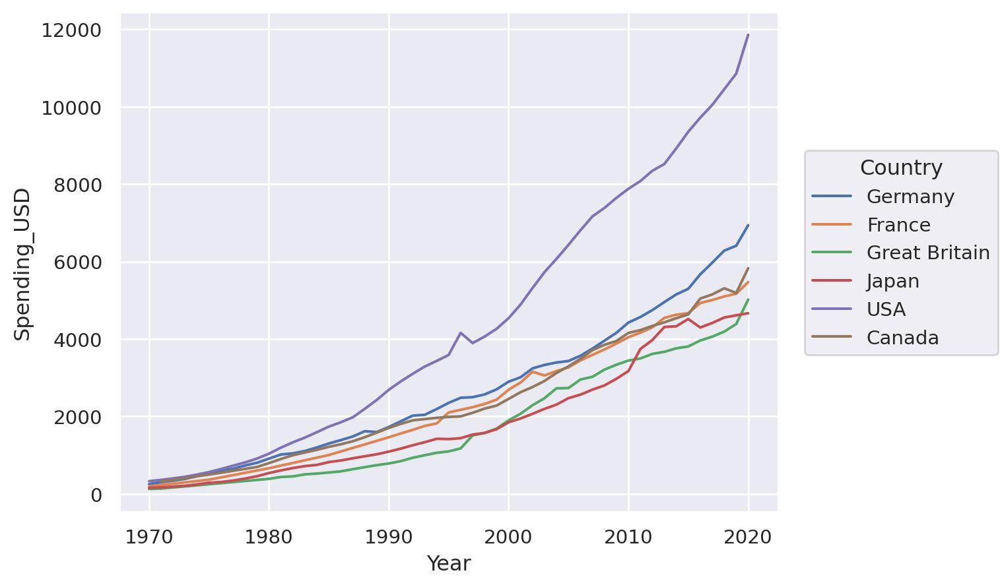

In [67]:
p.add(so.Line())


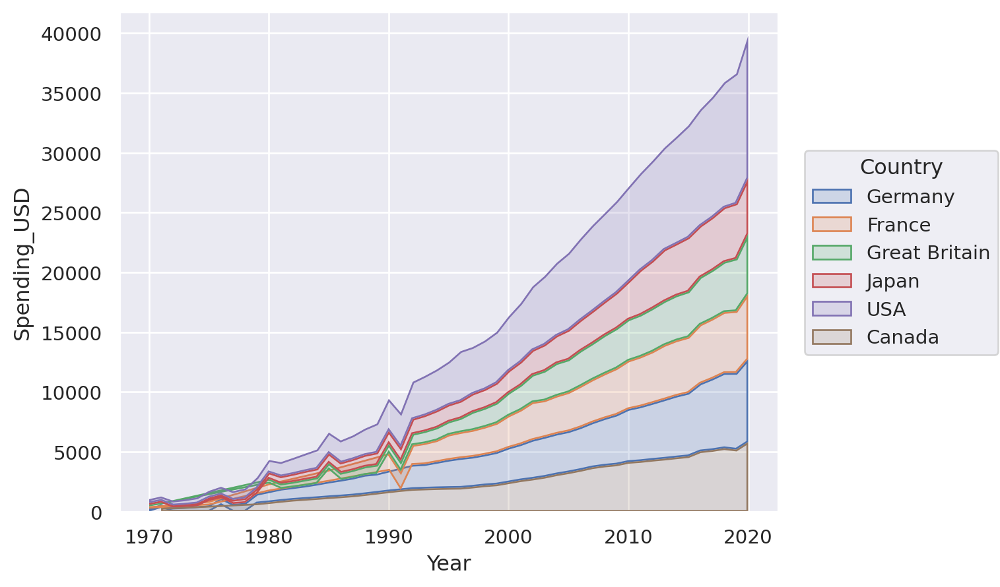

In [68]:
p.add(so.Area(), so.Stack()) #stacked area plt

### Customizing the appearance

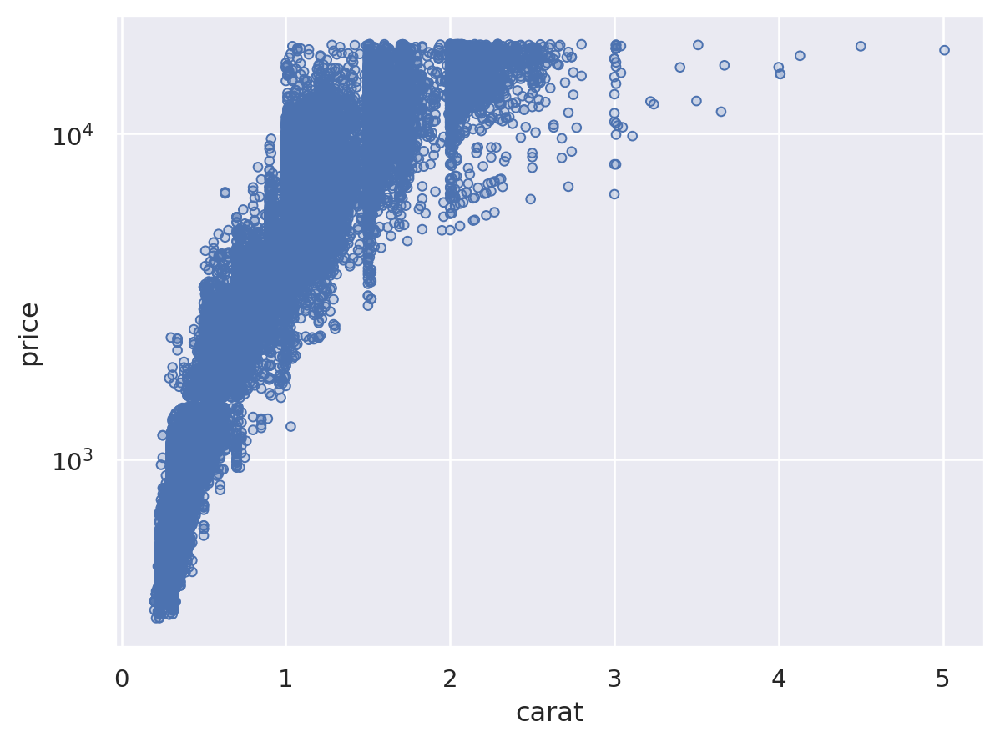

In [70]:
diamonds=sns.load_dataset("diamonds")
(
    so.Plot(diamonds, x="carat", y="price")
    .add(so.Dots())
    .scale(y="log")
)


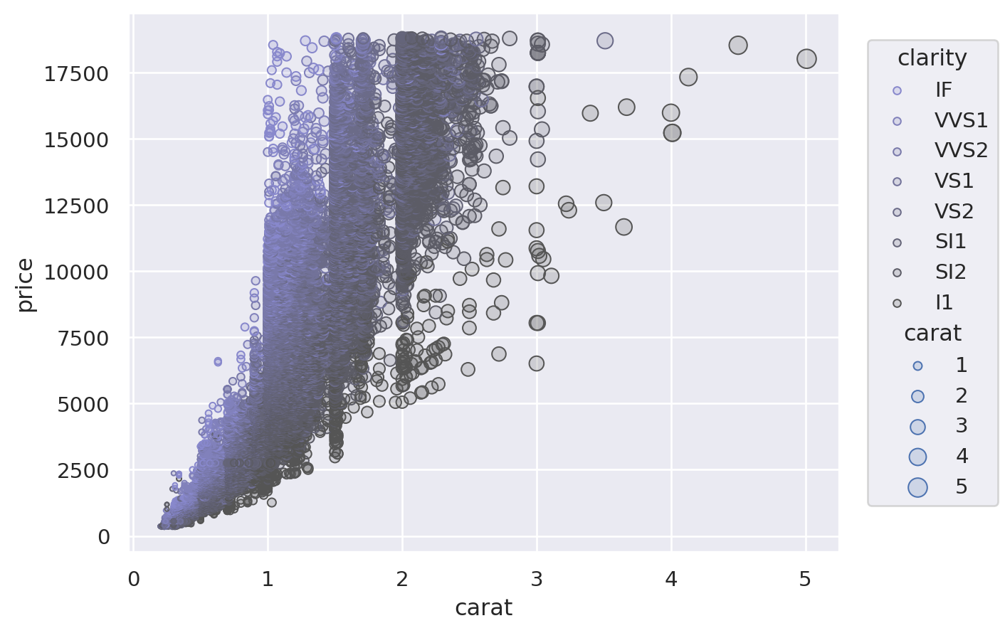

In [71]:
(
    so.Plot(diamonds, x="carat", y="price", color="clarity", pointsize="carat")
    .add(so.Dots())
    .scale(color=("#88c", "#555"), pointsize=(2, 10))
)

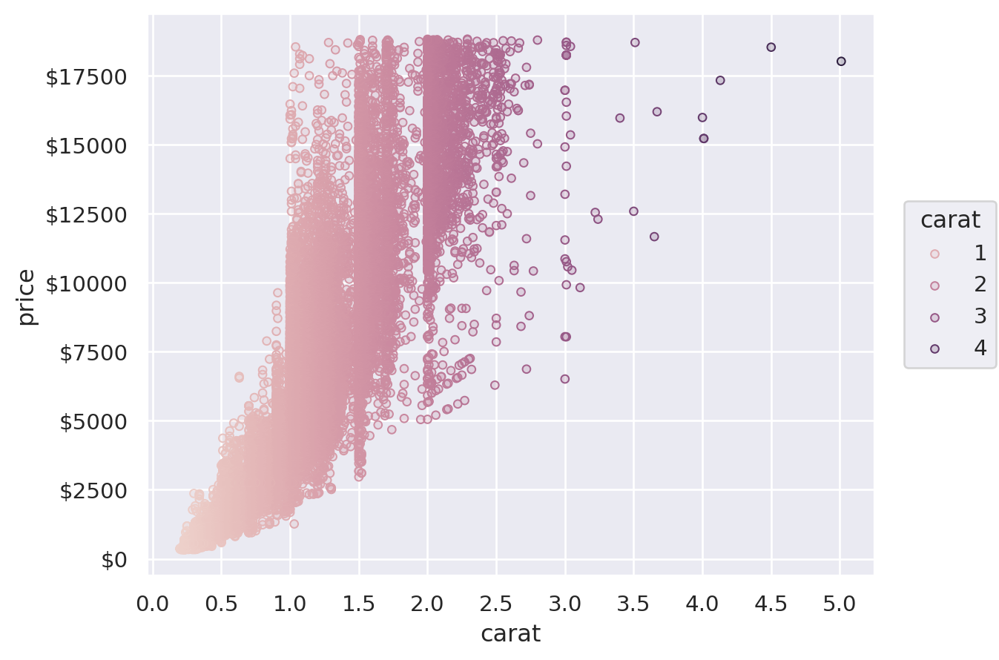

In [72]:
# customizing legends and ticks
(
    so.Plot(diamonds, x="carat", y="price", color="carat")
    .add(so.Dots())
    .scale(
        x=so.Continuous().tick(every=0.5),
        y=so.Continuous().label(like="${x:.0f}"),
        color=so.Continuous().tick(at=[1, 2, 3, 4]),
    )
)

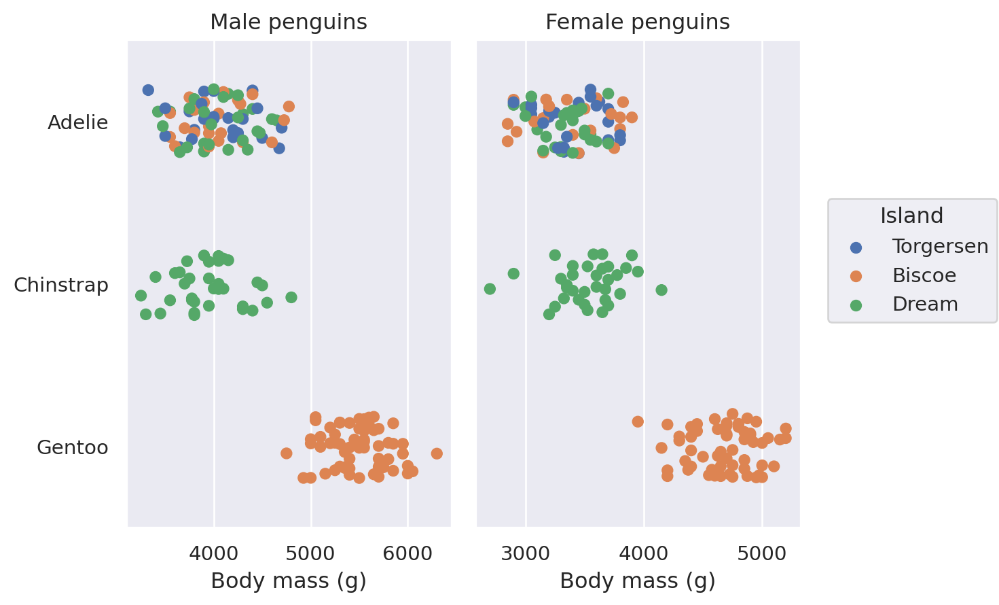

In [73]:
# customizing limits,labels and titles
(
    so.Plot(penguins, x="body_mass_g", y="species", color="island")
    .facet(col="sex")
    .add(so.Dot(), so.Jitter(.5))
    .share(x=False)
    .limit(y=(2.5, -.5))
    .label(
        x="Body mass (g)", y="",
        color=str.capitalize,
        title="{} penguins".format,
    )
)

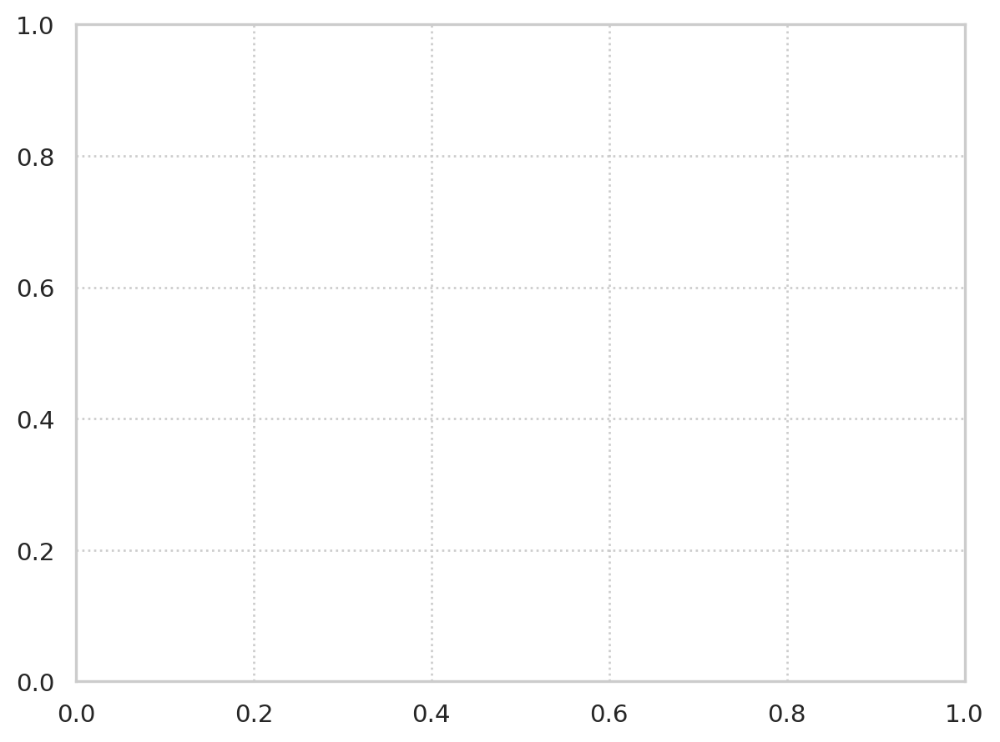

In [74]:
# theme customization
from seaborn import axes_style
theme_dict = {**axes_style("whitegrid"), "grid.linestyle": ":"}
so.Plot().theme(theme_dict)

In [75]:
so.Plot.config.theme.update(theme_dict)

## Visualizing statistical relationship

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")

### Relating variables with scatter plots


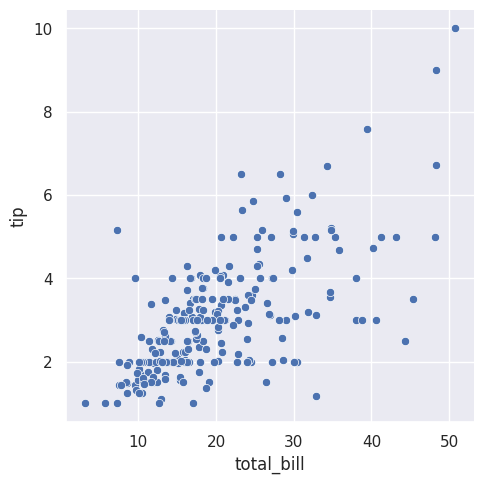

In [77]:
tips = sns.load_dataset("tips")
sns.relplot(data=tips, x="total_bill", y="tip")

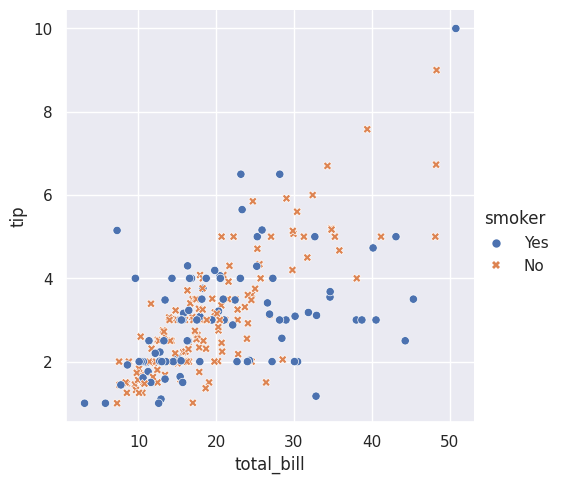

In [78]:
sns.relplot(
    data=tips,
    x="total_bill", y="tip", hue="smoker", style="smoker"
)

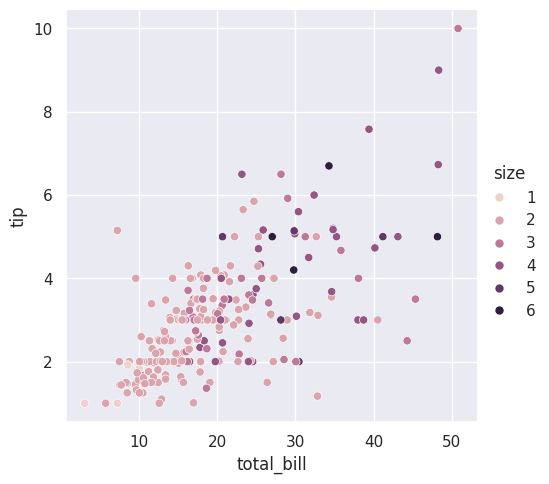

In [79]:
sns.relplot(
    data=tips, x="total_bill", y="tip", hue="size",
)

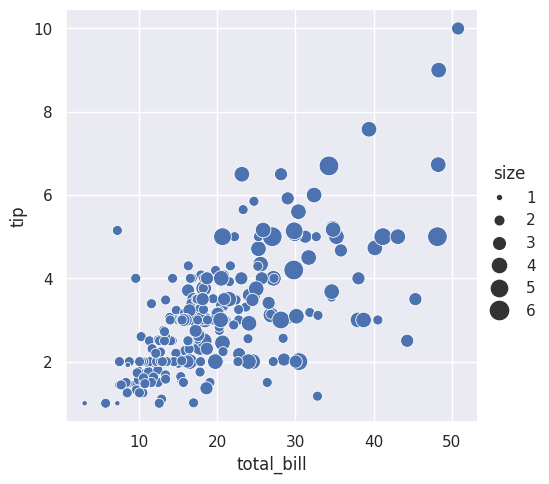

In [80]:
sns.relplot(
    data=tips, x="total_bill", y="tip",
    size="size", sizes=(15, 200)
)

### Emphasizing continuity with line plots

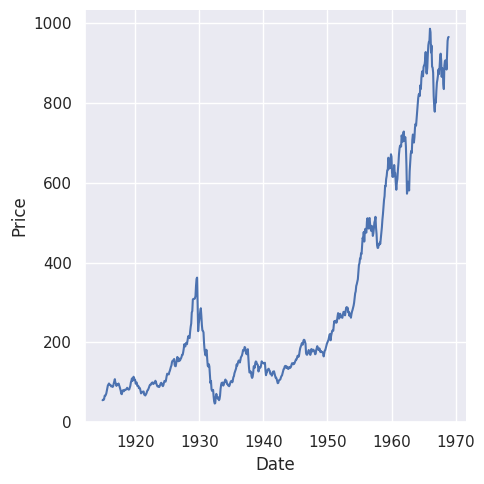

In [81]:
dowjones = sns.load_dataset("dowjones")
sns.relplot(data=dowjones, x="Date", y="Price", kind="line")

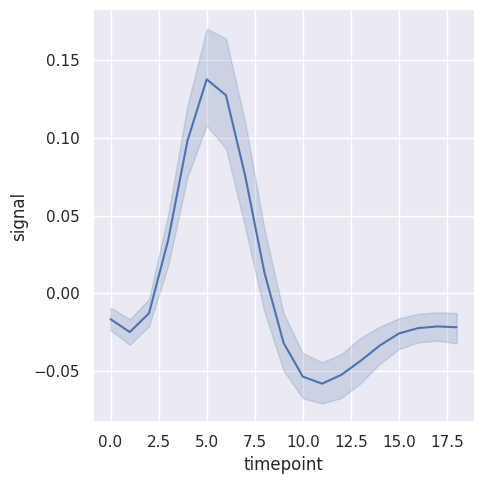

In [82]:
# Aggregation and representing uncertainty

fmri = sns.load_dataset("fmri")
sns.relplot(data=fmri, x="timepoint", y="signal", kind="line")

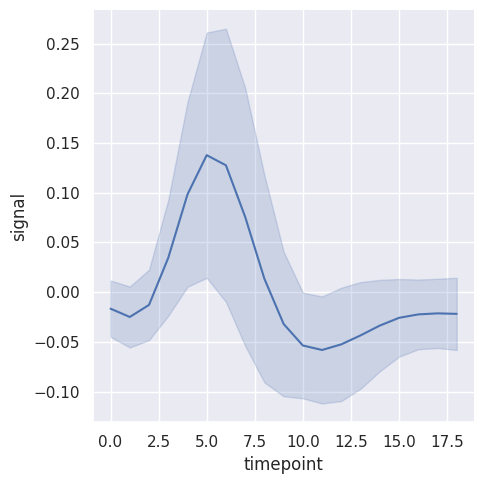

In [84]:
sns.relplot(
    data=fmri, kind="line",
    x="timepoint", y="signal", errorbar="sd",
)

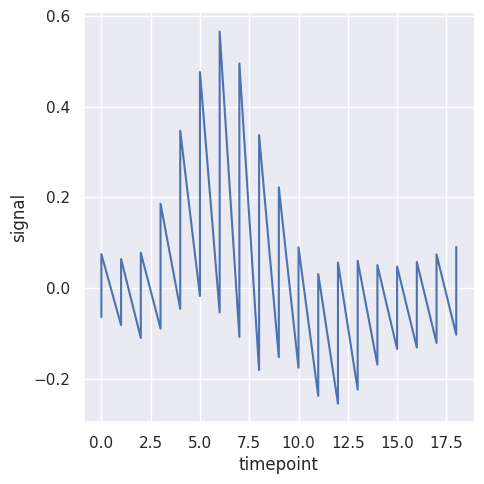

In [85]:
sns.relplot(
    data=fmri, kind="line",
    x="timepoint", y="signal",
    estimator=None,
)

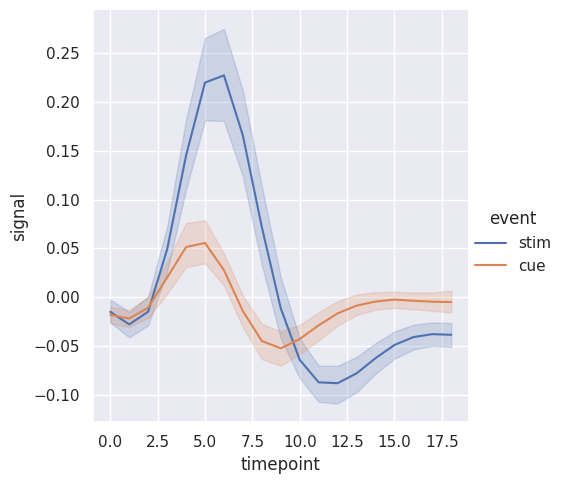

In [86]:
# Plotting subsets of data with semantic mappings
sns.relplot(
    data=fmri, kind="line",
    x="timepoint", y="signal", hue="event",
)

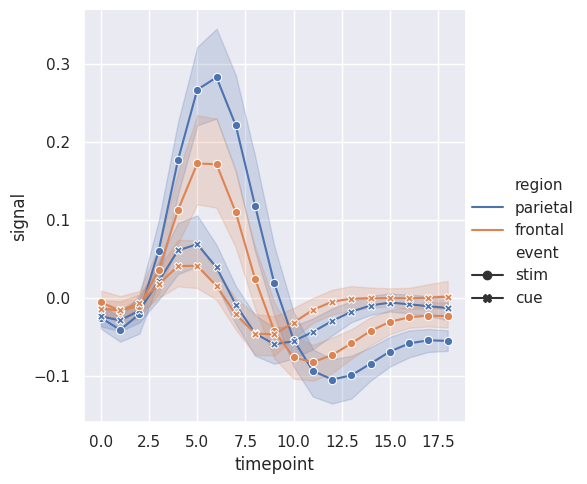

In [87]:
sns.relplot(
    data=fmri, kind="line",
    x="timepoint", y="signal", hue="region", style="event",
    dashes=False, markers=True,
)

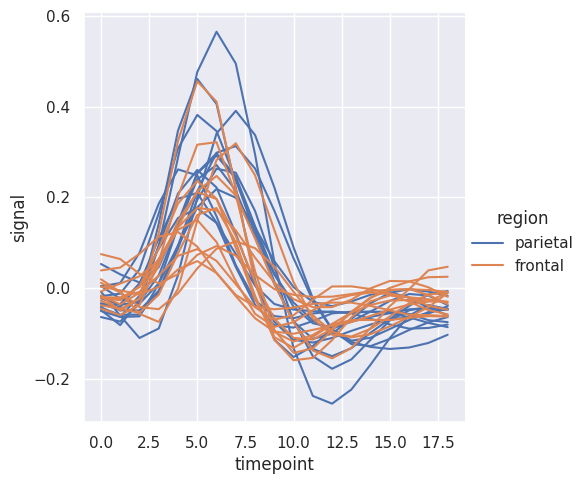

In [88]:
sns.relplot(
    data=fmri.query("event == 'stim'"), kind="line",
    x="timepoint", y="signal", hue="region",
    units="subject", estimator=None,
)


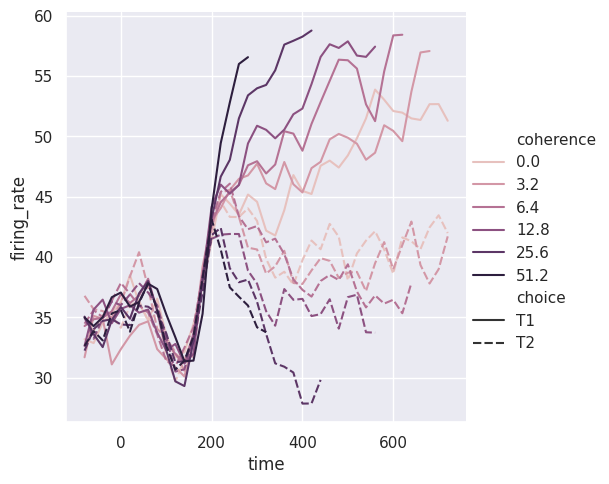

In [93]:
dots = sns.load_dataset("dots").query("align == 'dots'")
palette = sns.cubehelix_palette(light=.8, n_colors=6)
sns.relplot(
    data=dots, kind="line",
    x="time", y="firing_rate",
    hue="coherence", style="choice", palette=palette,
)

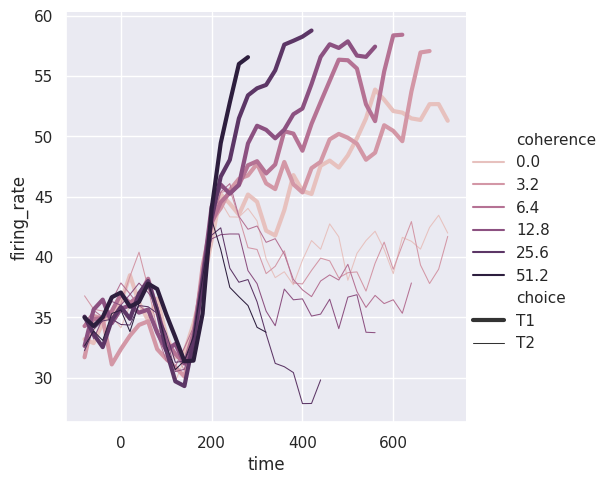

In [94]:
sns.relplot(
    data=dots, kind="line",
    x="time", y="firing_rate",
    hue="coherence", size="choice", palette=palette,
)

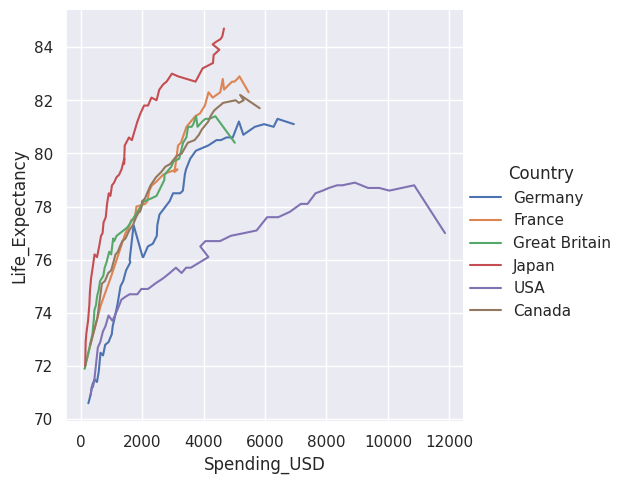

In [95]:
#Controlling sorting and orientation
healthexp = sns.load_dataset("healthexp").sort_values("Year")
sns.relplot(
    data=healthexp, kind="line",
    x="Spending_USD", y="Life_Expectancy", hue="Country",
    sort=False
)

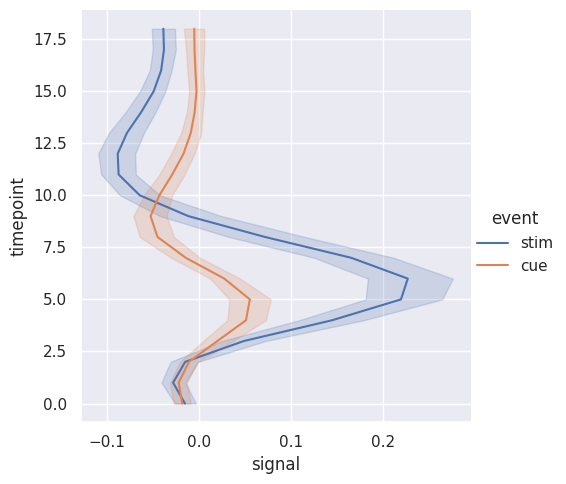

In [96]:
sns.relplot(
    data=fmri, kind="line",
     x="signal", y="timepoint", hue="event",
    orient="y",
)

### Showing multiple relationships with facets

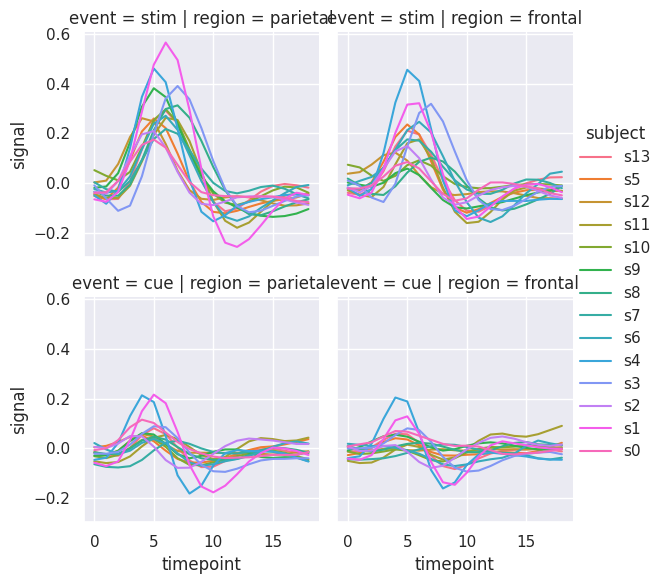

In [98]:
sns.relplot(
    data=fmri, kind="line",
    x="timepoint", y="signal", hue="subject",
    col="region", row="event", height=3,
    estimator=None
)

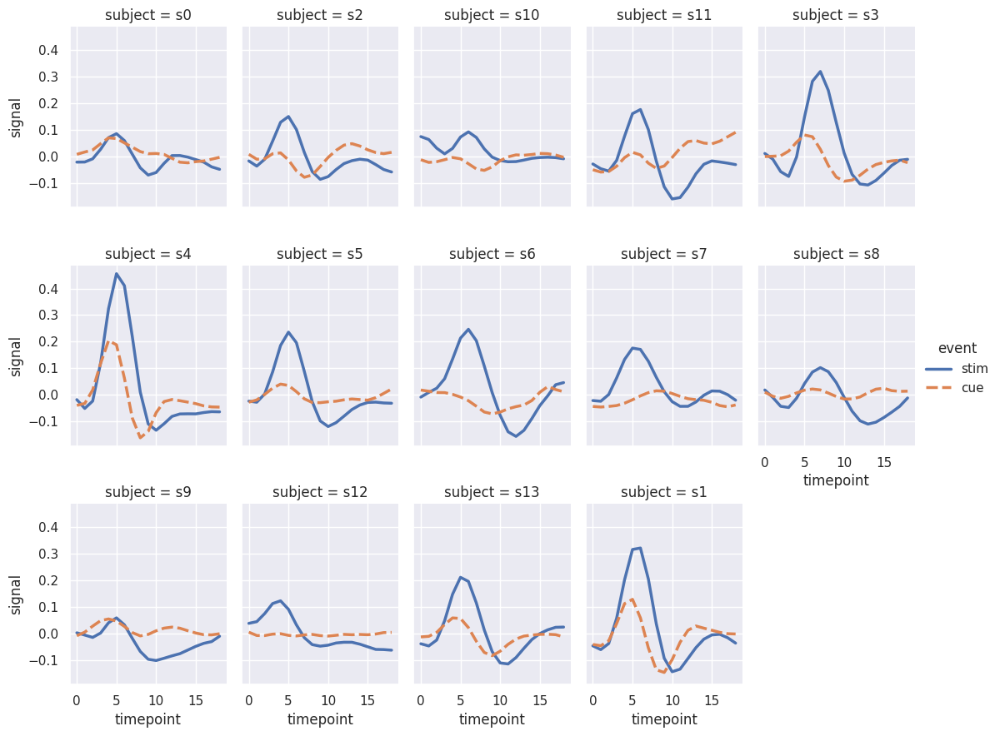

In [99]:
sns.relplot(
    data=fmri.query("region == 'frontal'"), kind="line",
    x="timepoint", y="signal", hue="event", style="event",
    col="subject", col_wrap=5,
    height=3, aspect=.75, linewidth=2.5,
)

## Visualizing distributions of data

### Plotting univariate histograms

In [ ]:
penguins = sns.load_dataset("penguins")
sns.displot(penguins, x="flipper_length_mm")
\

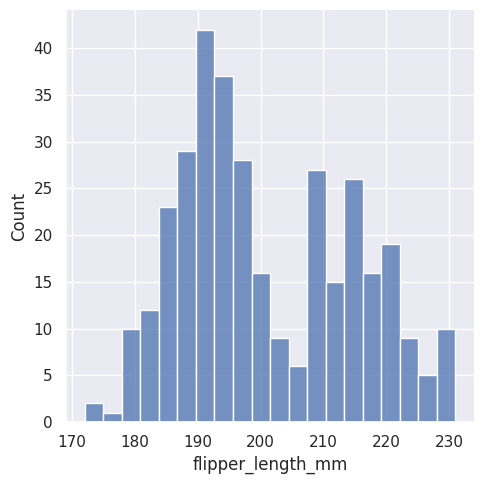

In [100]:
# chossing bin size
sns.displot(penguins, x="flipper_length_mm", binwidth=3)

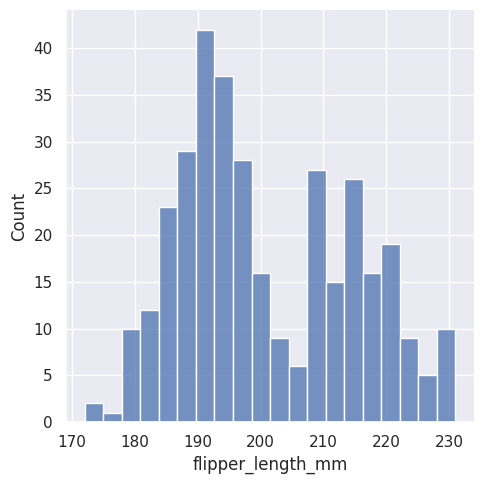

In [101]:
sns.displot(penguins, x="flipper_length_mm", bins=20)

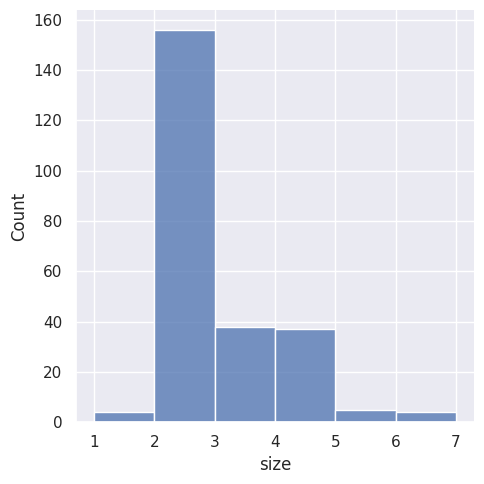

In [102]:
sns.displot(tips, x="size", bins=[1, 2, 3, 4, 5, 6, 7])

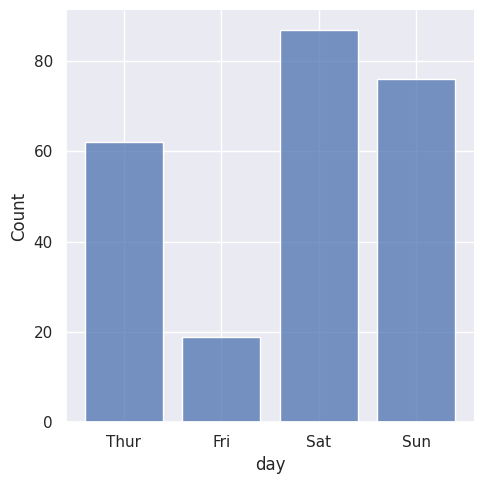

In [103]:
sns.displot(tips, x="day", shrink=.8)

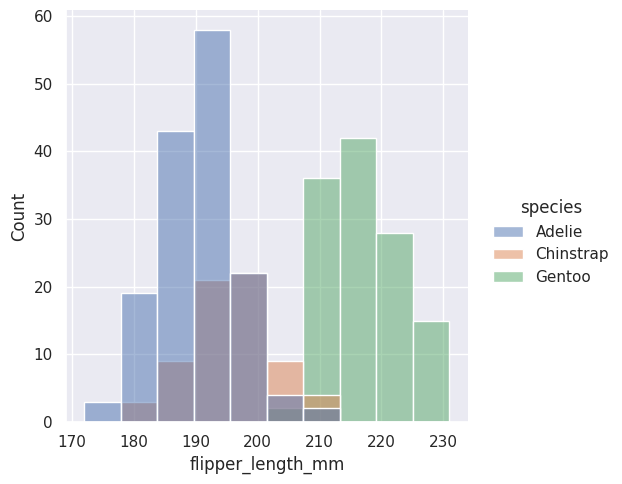

In [104]:
# Conditioning on other variables

sns.displot(penguins, x="flipper_length_mm", hue="species")

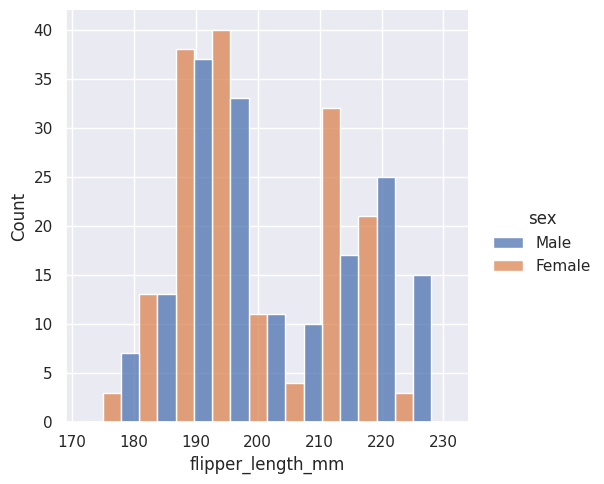

In [105]:
sns.displot(penguins, x="flipper_length_mm", hue="sex", multiple="dodge")

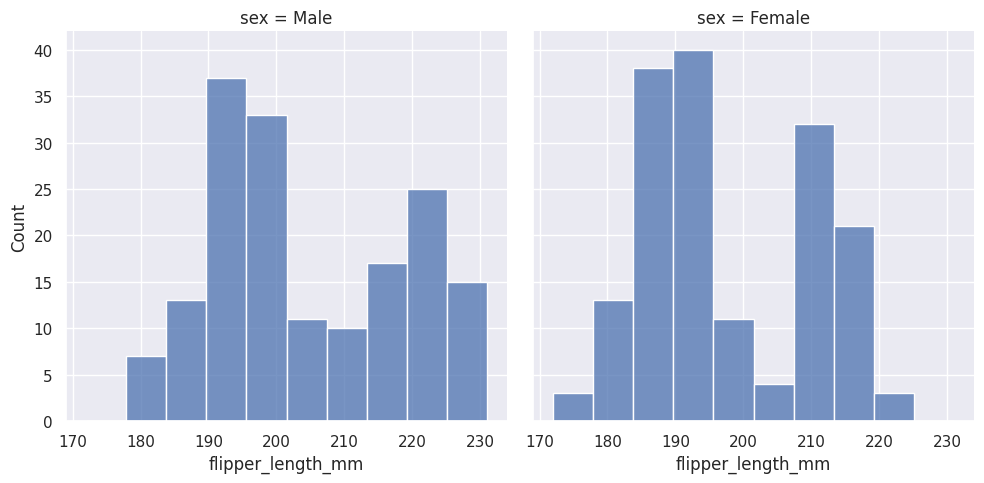

In [106]:
sns.displot(penguins, x="flipper_length_mm", col="sex")

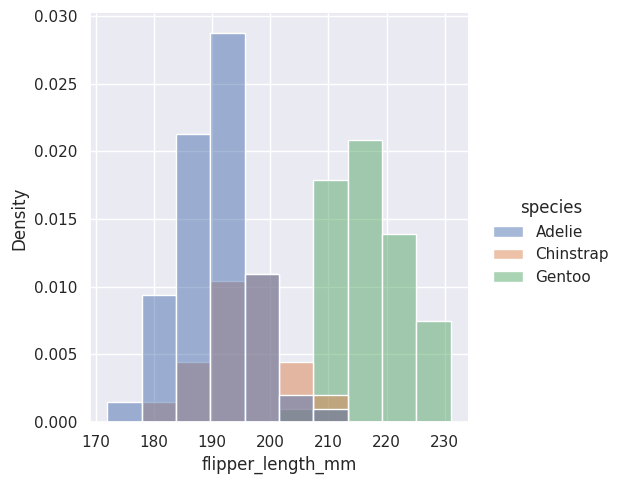

In [107]:
sns.displot(penguins, x="flipper_length_mm", hue="species", stat="density")

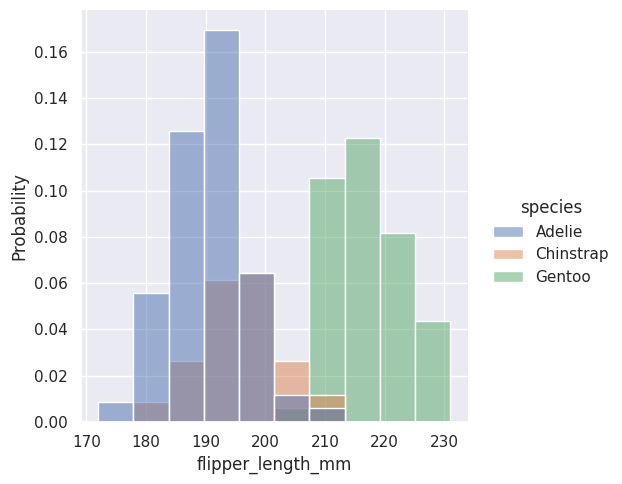

In [108]:
sns.displot(penguins, x="flipper_length_mm", hue="species", stat="probability")

### Kernel density estimation

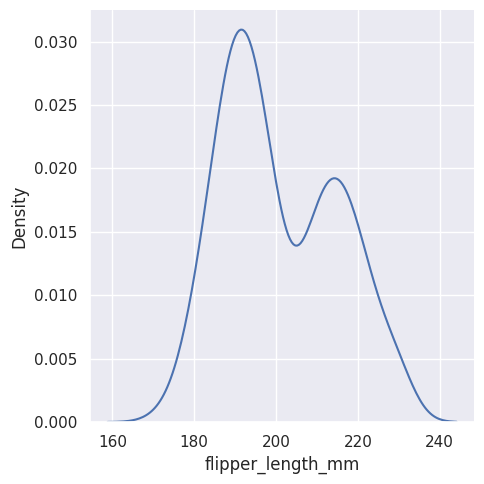

In [109]:
sns.displot(penguins, x="flipper_length_mm", kind="kde")

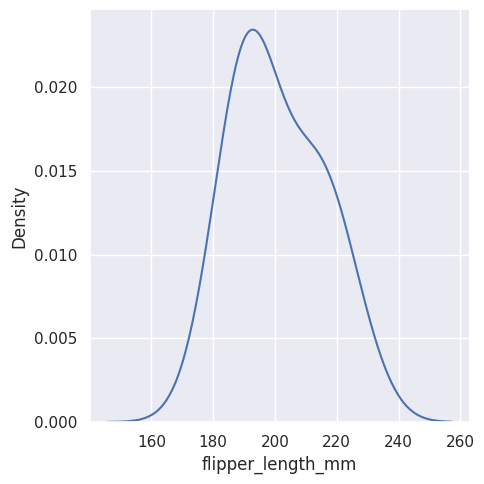

In [110]:
sns.displot(penguins, x="flipper_length_mm", kind="kde", bw_adjust=2)

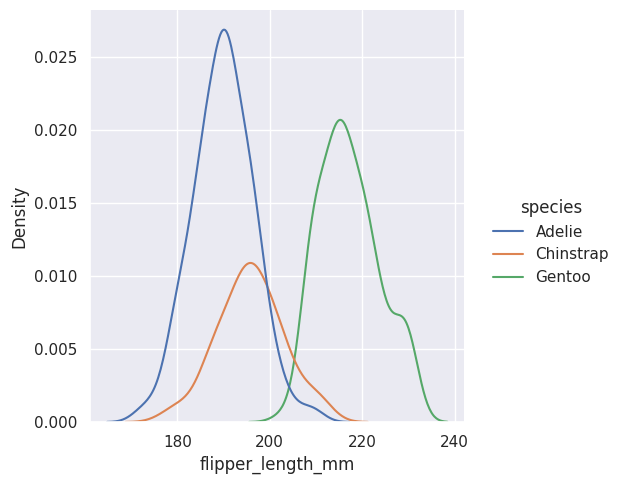

In [111]:
sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde")

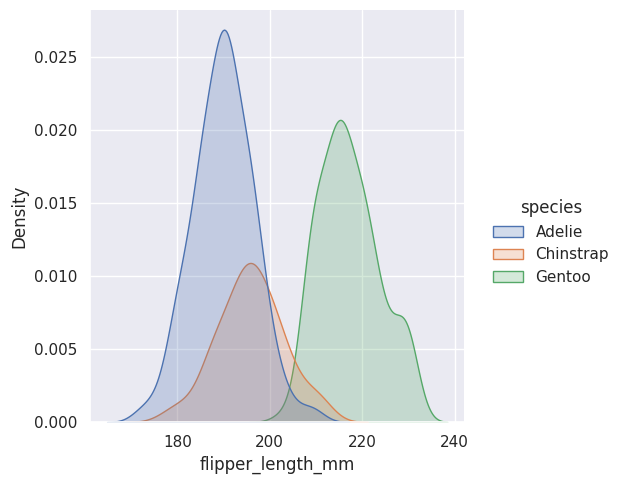

In [112]:
sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde", fill=True)

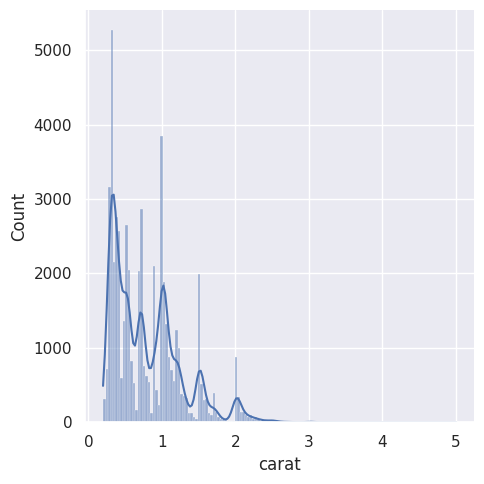

In [113]:
sns.displot(diamonds, x="carat", kde=True)

### Empirical cumulative distributions


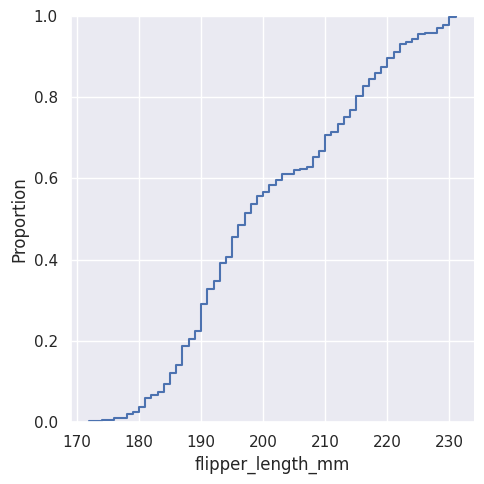

In [114]:
sns.displot(penguins, x="flipper_length_mm", kind="ecdf")

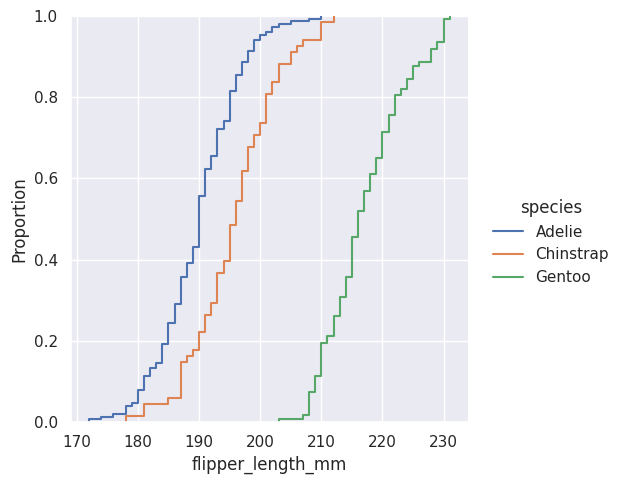

In [115]:
sns.displot(penguins, x="flipper_length_mm", hue="species", kind="ecdf")

### Visualizing bivariate distributions

In [ ]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", hue="species")

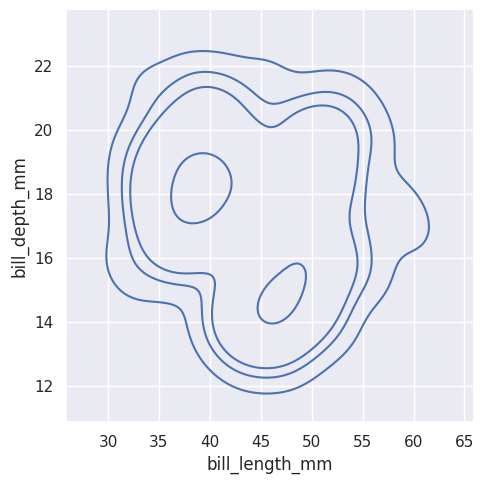

In [116]:
sns.displot(penguins, x="bill_length_mm", y="bill_depth_mm", kind="kde", levels=[.01, .05, .1, .8])

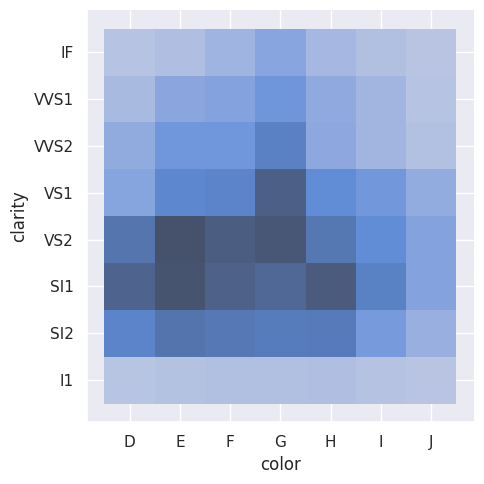

In [117]:
sns.displot(diamonds, x="color", y="clarity")

### Distribution visualization in other settings

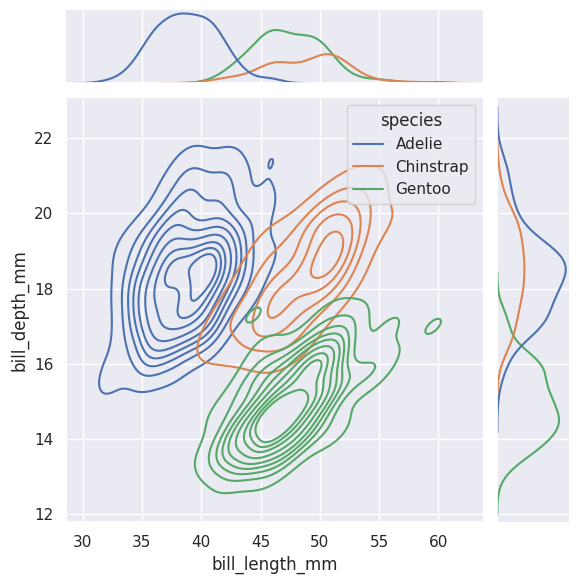

In [118]:
sns.jointplot(
    data=penguins,
    x="bill_length_mm", y="bill_depth_mm", hue="species",
    kind="kde"
)

<Axes: xlabel='bill_length_mm', ylabel='bill_depth_mm'>

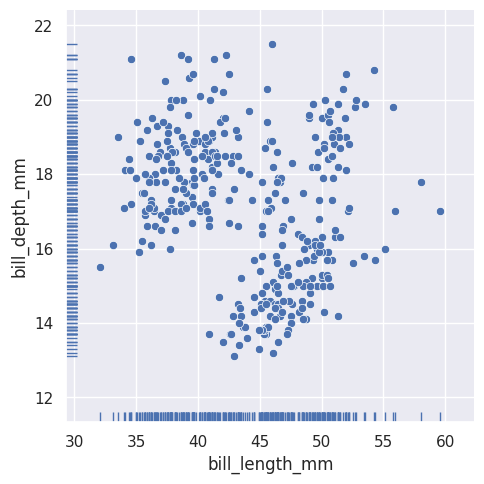

In [119]:
sns.relplot(data=penguins, x="bill_length_mm", y="bill_depth_mm")
sns.rugplot(data=penguins, x="bill_length_mm", y="bill_depth_mm")

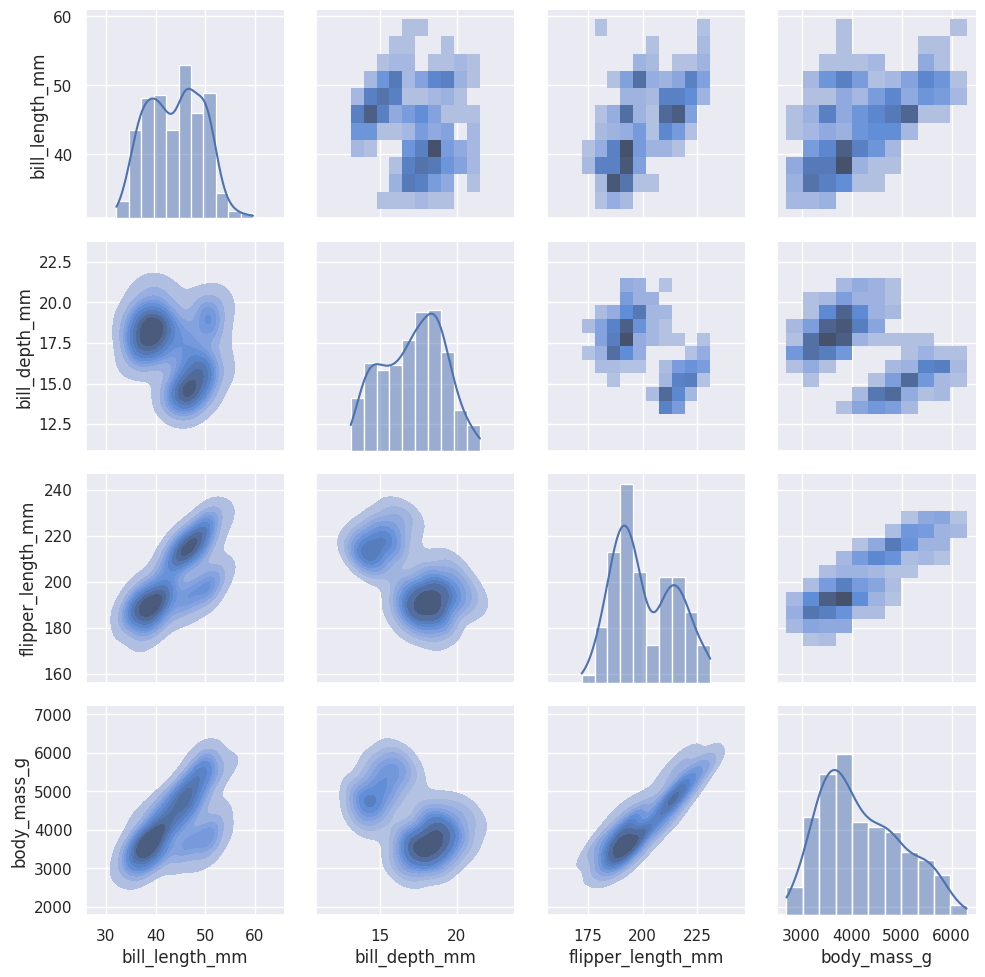

In [120]:
g = sns.PairGrid(penguins)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True)
g.map_diag(sns.histplot, kde=True)

## Visualizing categorical data

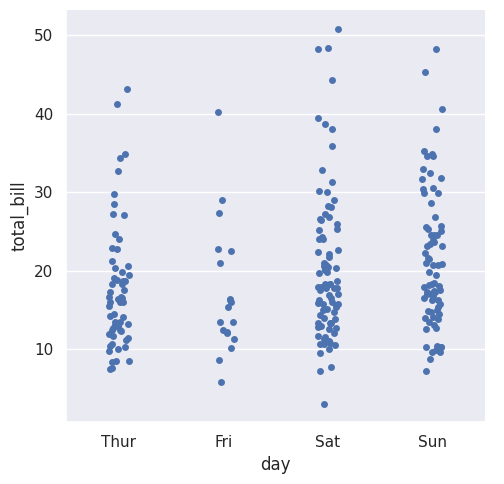

In [121]:
tips = sns.load_dataset("tips")
sns.catplot(data=tips, x="day", y="total_bill")

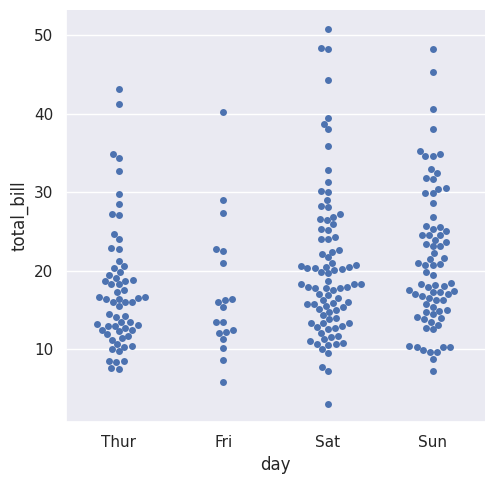

In [122]:
sns.catplot(data=tips, x="day", y="total_bill", kind="swarm")

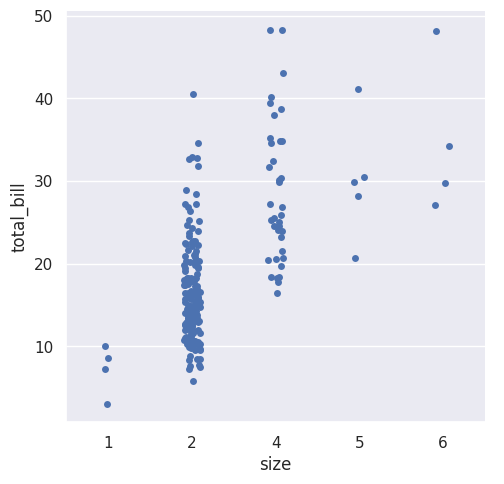

In [123]:
sns.catplot(data=tips.query("size != 3"), x="size", y="total_bill")

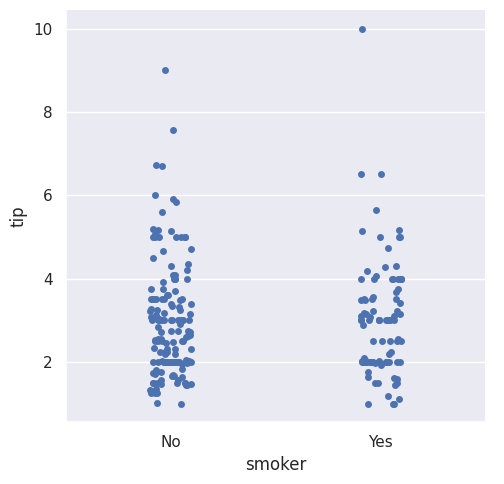

In [124]:
sns.catplot(data=tips, x="smoker", y="tip", order=["No", "Yes"])

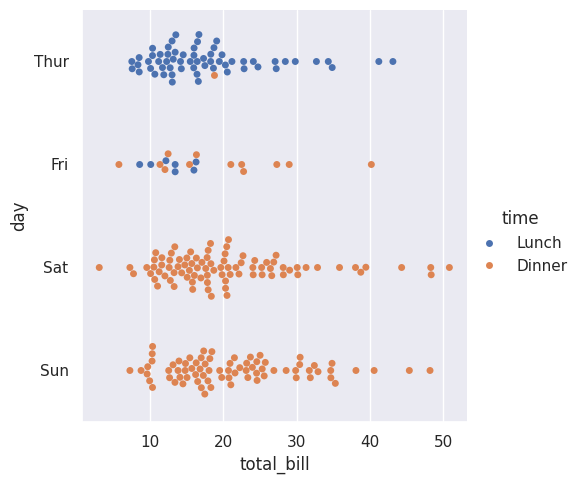

In [125]:
sns.catplot(data=tips, x="total_bill", y="day", hue="time", kind="swarm")

### Comparing distribution

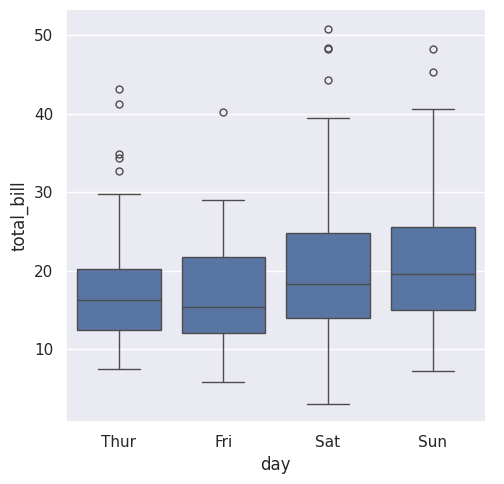

In [126]:
sns.catplot(data=tips, x="day", y="total_bill", kind="box")

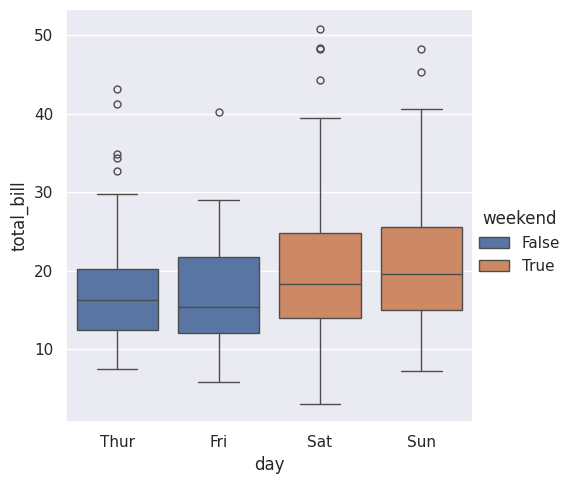

In [127]:
tips["weekend"] = tips["day"].isin(["Sat", "Sun"])
sns.catplot(data=tips, x="day", y="total_bill", hue="weekend", kind="box")

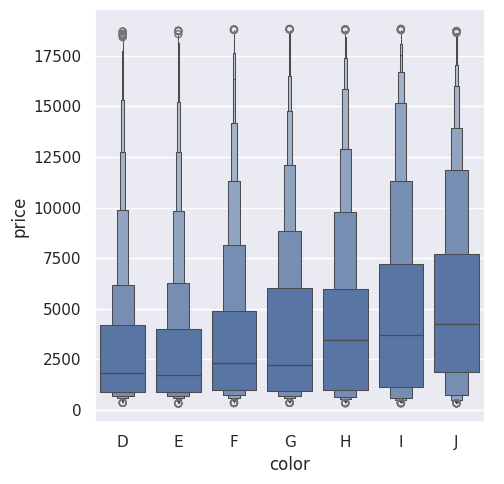

In [128]:
diamonds = sns.load_dataset("diamonds")
sns.catplot(
    data=diamonds.sort_values("color"),
    x="color", y="price", kind="boxen",
)

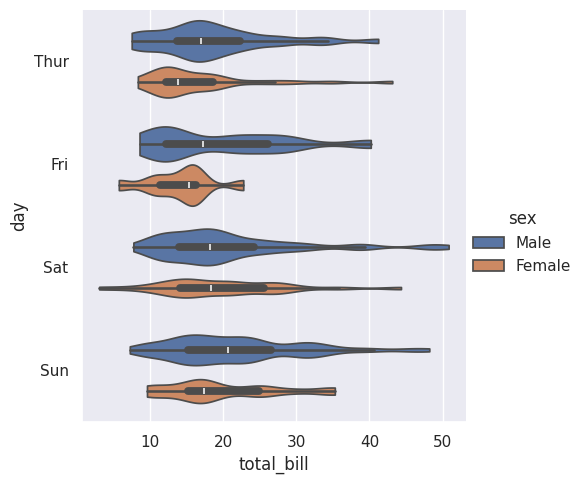

In [129]:
sns.catplot(
    data=tips, x="total_bill", y="day", hue="sex",
    kind="violin", bw_adjust=.5, cut=0,
)

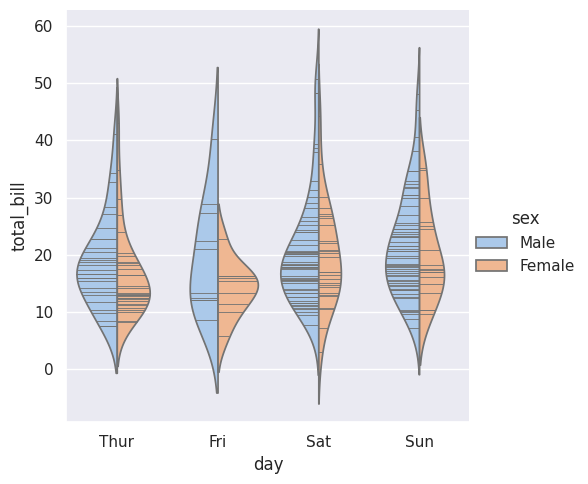

In [130]:
sns.catplot(
    data=tips, x="day", y="total_bill", hue="sex",
    kind="violin", inner="stick", split=True, palette="pastel",
)

<Axes: xlabel='day', ylabel='total_bill'>

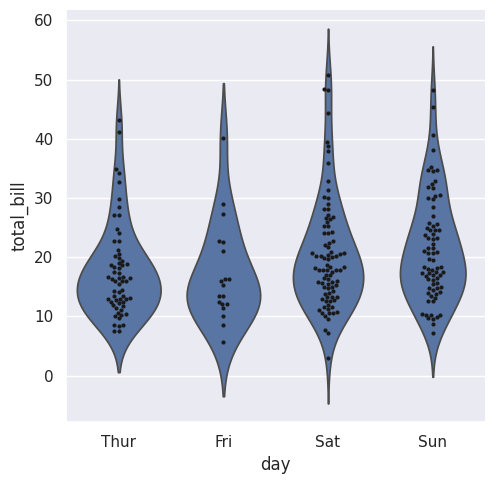

In [131]:
g = sns.catplot(data=tips, x="day", y="total_bill", kind="violin", inner=None)
sns.swarmplot(data=tips, x="day", y="total_bill", color="k", size=3, ax=g.ax)

### estimation central tendancy

<Axes: xlabel='day', ylabel='total_bill'>

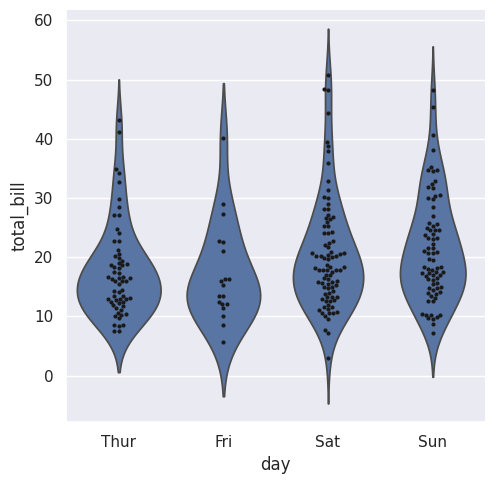

In [132]:
g = sns.catplot(data=tips, x="day", y="total_bill", kind="violin", inner=None)
sns.swarmplot(data=tips, x="day", y="total_bill", color="k", size=3, ax=g.ax)

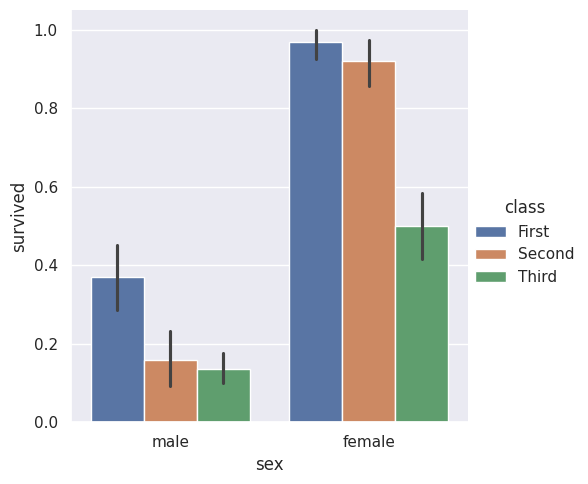

In [133]:
titanic = sns.load_dataset("titanic")
sns.catplot(data=titanic, x="sex", y="survived", hue="class", kind="bar")

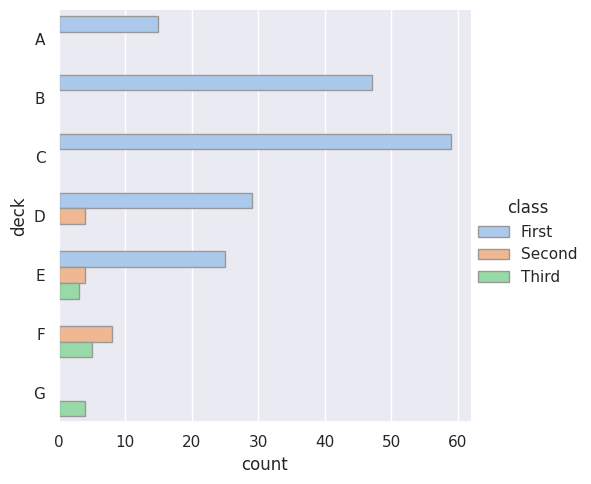

In [134]:
sns.catplot(
    data=titanic, y="deck", hue="class", kind="count",
    palette="pastel", edgecolor=".6",
)


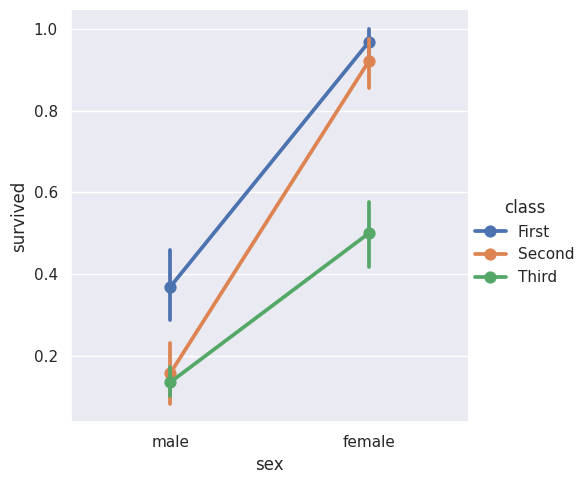

In [135]:
sns.catplot(data=titanic, x="sex", y="survived", hue="class", kind="point")

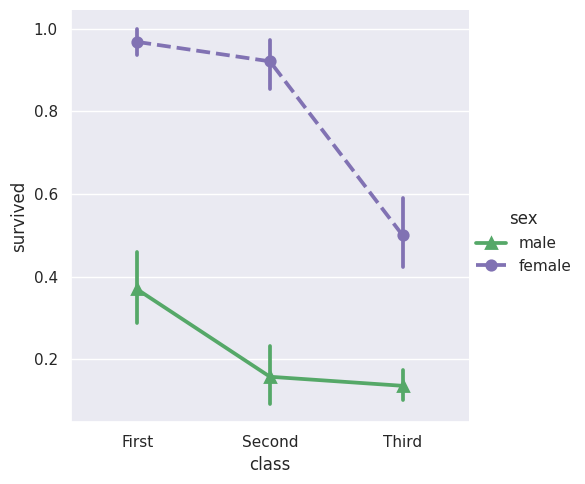

In [136]:
sns.catplot(
    data=titanic, x="class", y="survived", hue="sex",
    palette={"male": "g", "female": "m"},
    markers=["^", "o"], linestyles=["-", "--"],
    kind="point"
)

### Showing additional dimensions

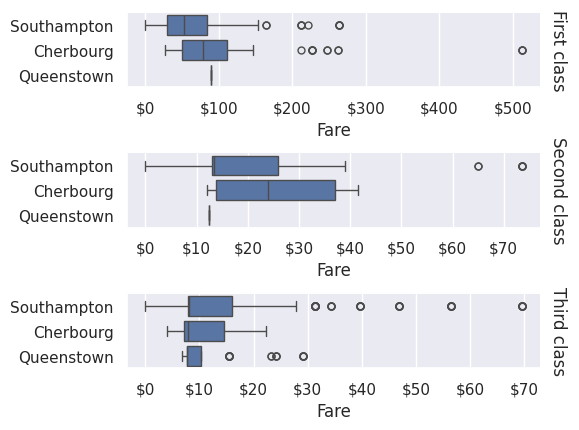

In [137]:
g = sns.catplot(
    data=titanic,
    x="fare", y="embark_town", row="class",
    kind="box", orient="h",
    sharex=False, margin_titles=True,
    height=1.5, aspect=4,
)
g.set(xlabel="Fare", ylabel="")
g.set_titles(row_template="{row_name} class")
for ax in g.axes.flat:
    ax.xaxis.set_major_formatter('${x:.0f}')

## Statistical estimation and error bars

In [138]:
def plot_errorbars(arg, **kws):
    np.random.seed(sum(map(ord, "error_bars")))
    x = np.random.normal(0, 1, 100)
    f, axs = plt.subplots(2, figsize=(7, 2), sharex=True, layout="tight")
    sns.pointplot(x=x, errorbar=arg, **kws, capsize=.3, ax=axs[0])
    sns.stripplot(x=x, jitter=.3, ax=axs[1])

### Measures of data spread


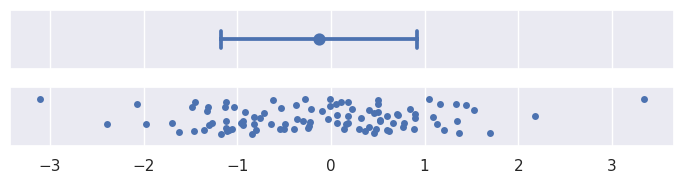

In [139]:
plot_errorbars("sd")

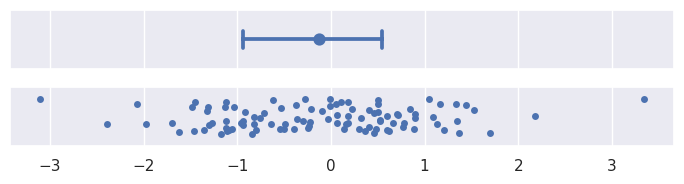

In [140]:
plot_errorbars(("pi", 50))

### Measures of estimate uncertainity

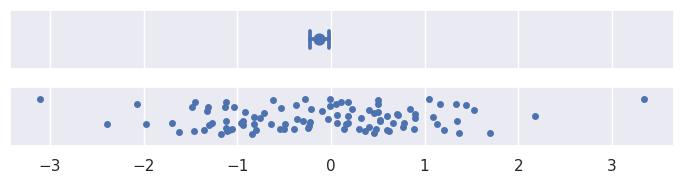

In [141]:
#Standard error bars
plot_errorbars("se")

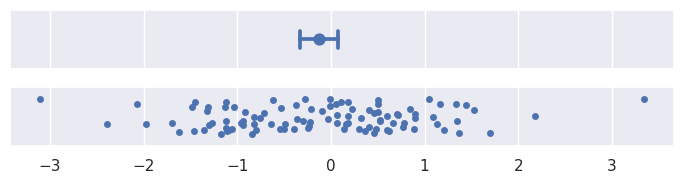

In [142]:
plot_errorbars("ci", n_boot=5000, seed=10)

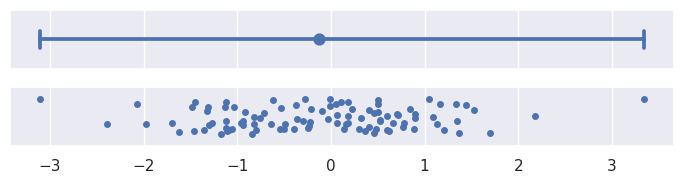

In [143]:
# Custom error bars
plot_errorbars(lambda x: (x.min(), x.max()))

### Errors bars on regression file

<Axes: >

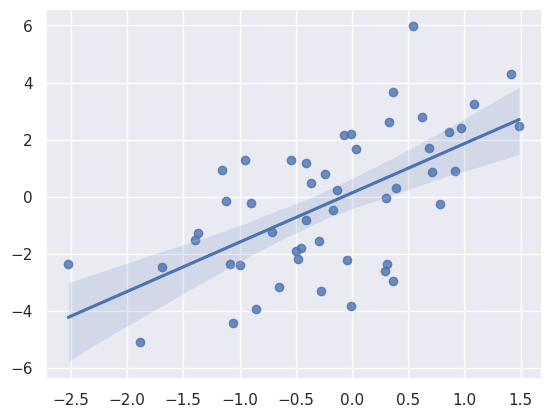

In [144]:
x = np.random.normal(0, 1, 50)
y = x * 2 + np.random.normal(0, 2, size=x.size)
sns.regplot(x=x, y=y)

## Estimation regression fits

### Functions for drawing linear regression models 

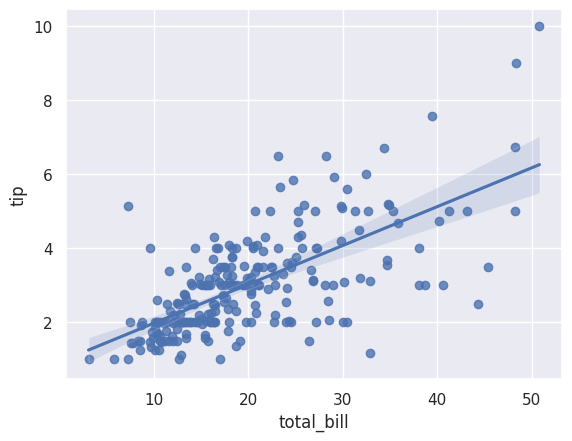

In [145]:
tips = sns.load_dataset("tips")
sns.regplot(x="total_bill", y="tip", data=tips);

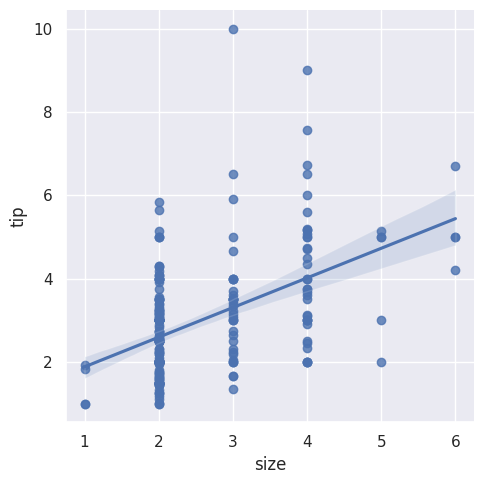

In [146]:
sns.lmplot(x="size", y="tip", data=tips);

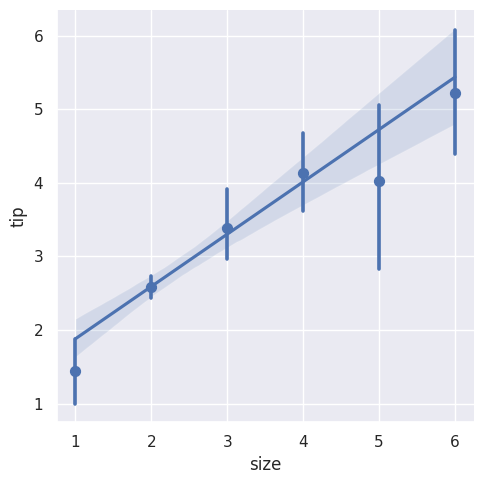

In [147]:
sns.lmplot(x="size", y="tip", data=tips, x_estimator=np.mean);


### Fitting different kinds of models

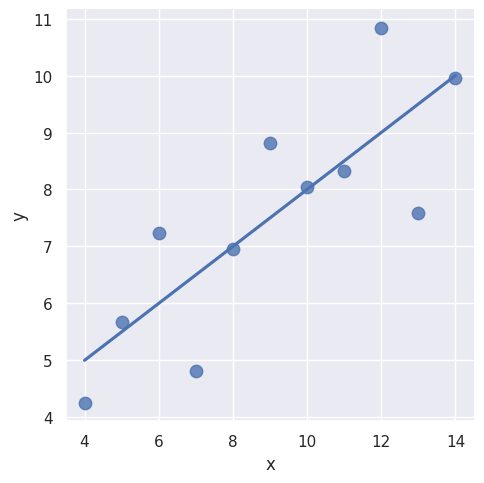

In [148]:
anscombe = sns.load_dataset("anscombe")
sns.lmplot(x="x", y="y", data=anscombe.query("dataset == 'I'"),
           ci=None, scatter_kws={"s": 80});

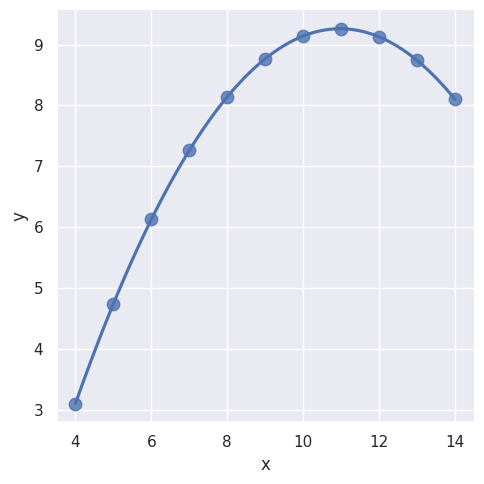

In [149]:
sns.lmplot(x="x", y="y", data=anscombe.query("dataset == 'II'"),
           order=2, ci=None, scatter_kws={"s": 80});

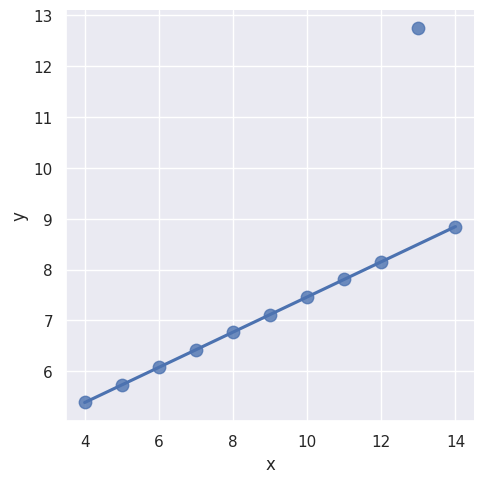

In [150]:
sns.lmplot(x="x", y="y", data=anscombe.query("dataset == 'III'"),
           robust=True, ci=None, scatter_kws={"s": 80});

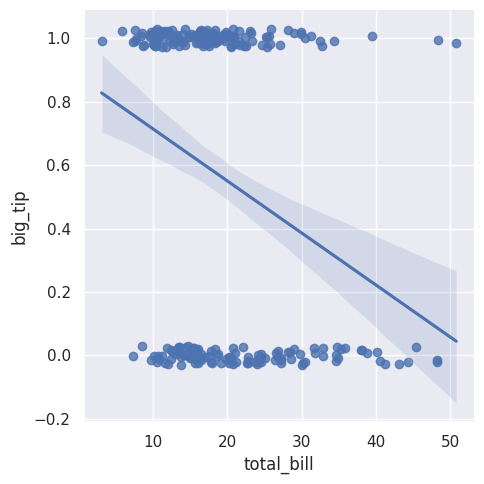

In [152]:
tips["big_tip"] = (tips.tip / tips.total_bill) > .15
sns.lmplot(x="total_bill", y="big_tip", data=tips,
           y_jitter=.03);

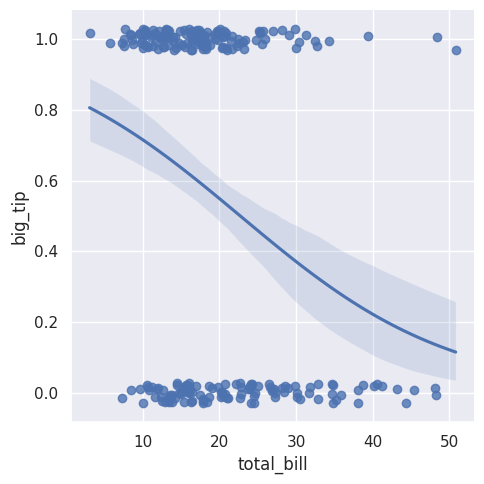

In [153]:
sns.lmplot(x="total_bill", y="big_tip", data=tips,
           logistic=True, y_jitter=.03);

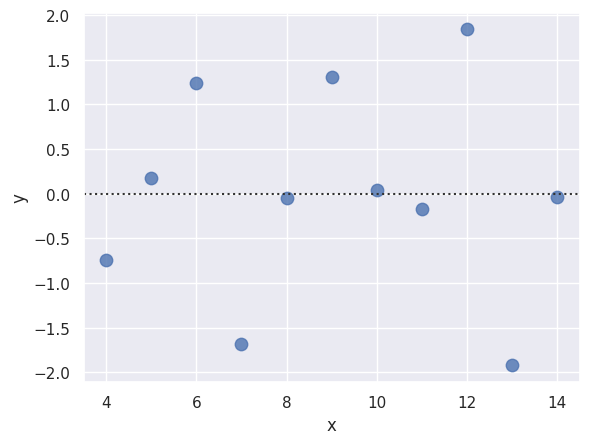

In [154]:
sns.residplot(x="x", y="y", data=anscombe.query("dataset == 'I'"),
              scatter_kws={"s": 80});

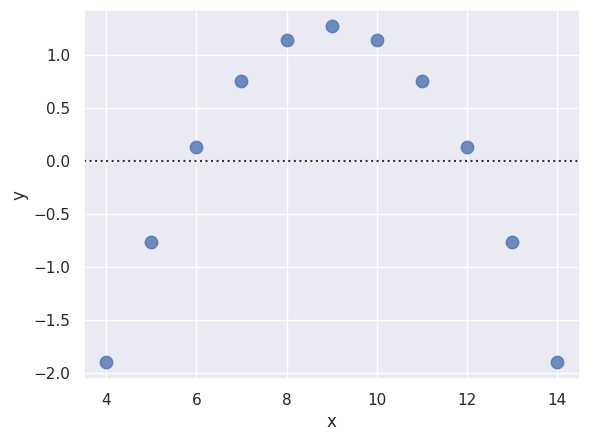

In [155]:
sns.residplot(x="x", y="y", data=anscombe.query("dataset == 'II'"),
              scatter_kws={"s": 80});

### Conditioning on other varaible

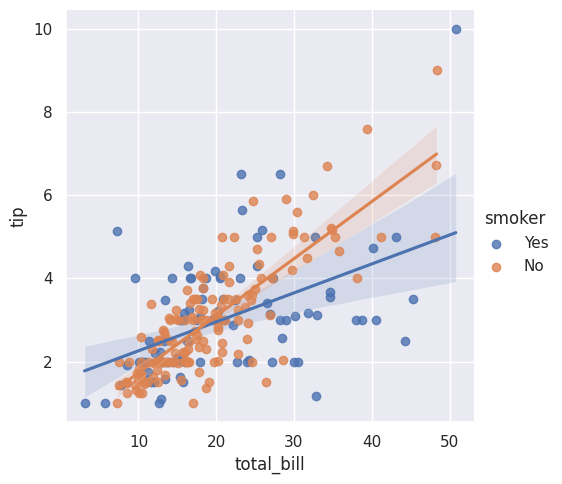

In [156]:
sns.lmplot(x="total_bill", y="tip", hue="smoker", data=tips);

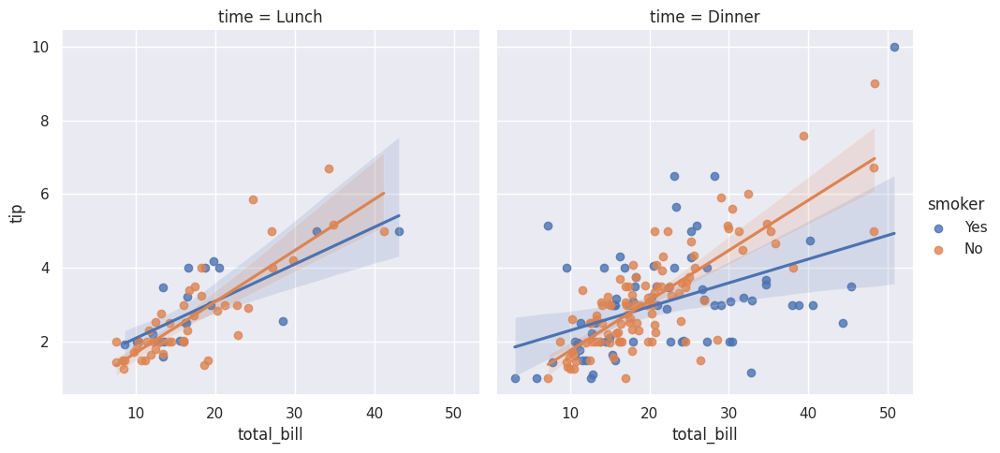

In [157]:
sns.lmplot(x="total_bill", y="tip", hue="smoker", col="time", data=tips);

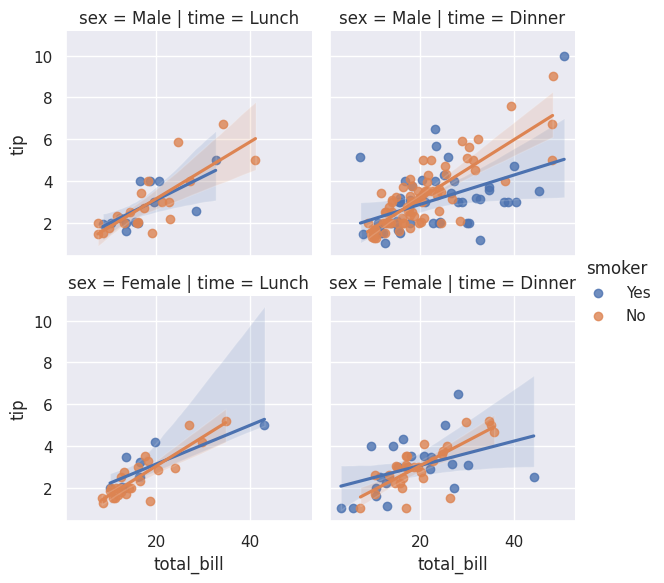

In [158]:
sns.lmplot(x="total_bill", y="tip", hue="smoker",
           col="time", row="sex", data=tips, height=3);

### Plotting regression in other context

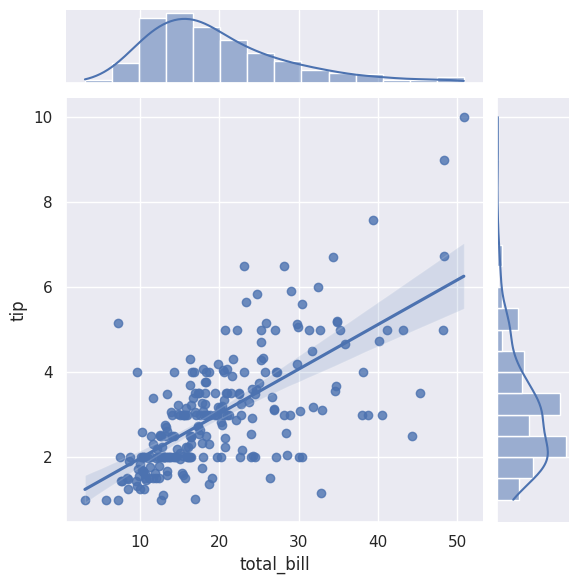

In [159]:
sns.jointplot(x="total_bill", y="tip", data=tips, kind="reg");

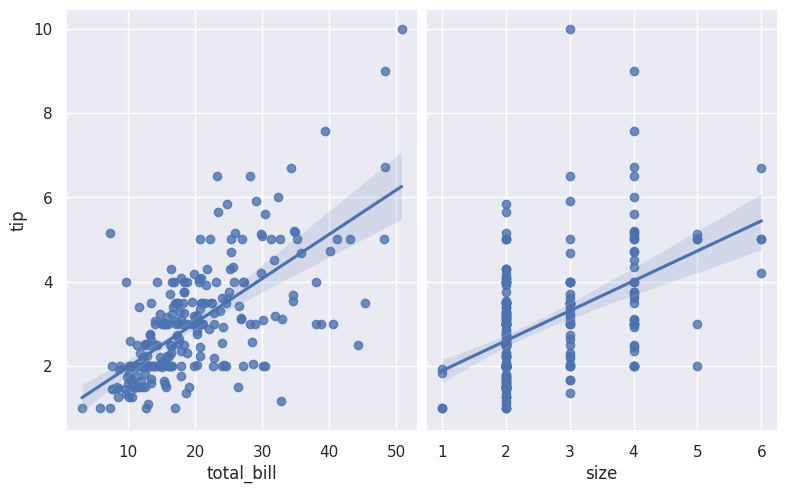

In [160]:
sns.pairplot(tips, x_vars=["total_bill", "size"], y_vars=["tip"],
             height=5, aspect=.8, kind="reg");


## Building structured multi plot grids

### Conditional small multiples

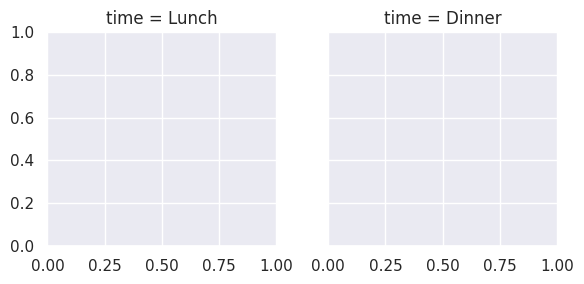

In [161]:
tips = sns.load_dataset("tips")
g = sns.FacetGrid(tips, col="time")

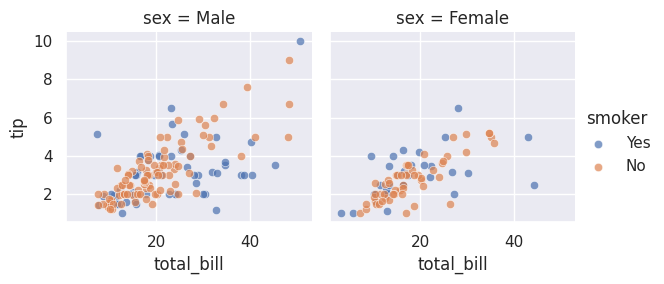

In [162]:
g = sns.FacetGrid(tips, col="sex", hue="smoker")
g.map(sns.scatterplot, "total_bill", "tip", alpha=.7)
g.add_legend()

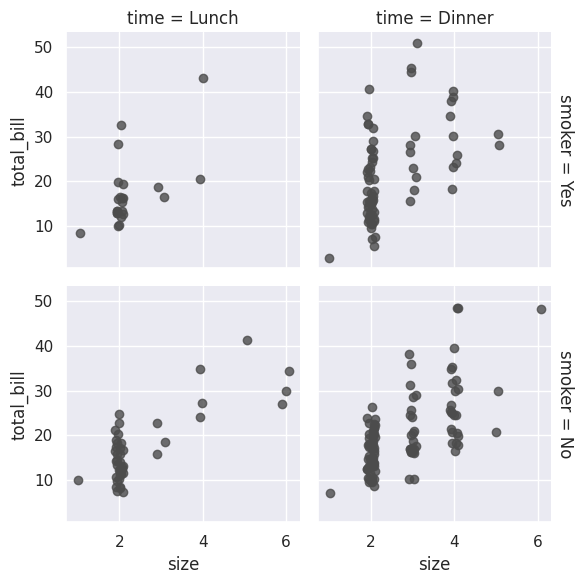

In [163]:
g = sns.FacetGrid(tips, row="smoker", col="time", margin_titles=True)
g.map(sns.regplot, "size", "total_bill", color=".3", fit_reg=False, x_jitter=.1)

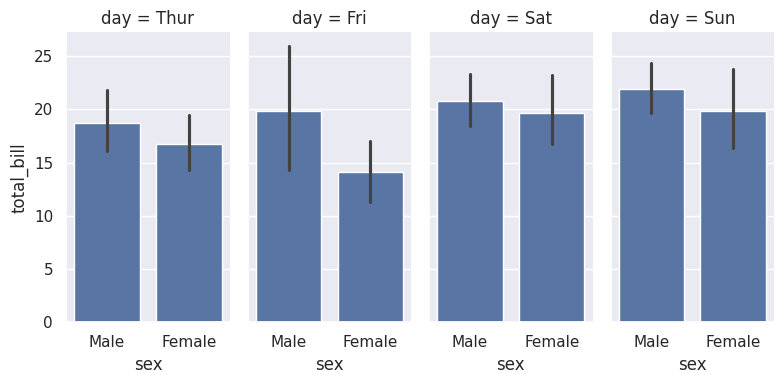

In [164]:
g = sns.FacetGrid(tips, col="day", height=4, aspect=.5)
g.map(sns.barplot, "sex", "total_bill", order=["Male", "Female"])

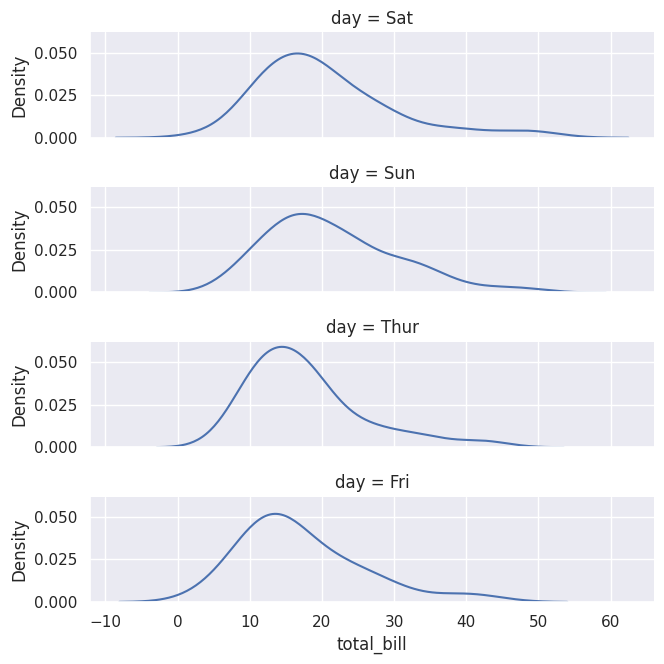

In [165]:
ordered_days = tips.day.value_counts().index
g = sns.FacetGrid(tips, row="day", row_order=ordered_days,
                  height=1.7, aspect=4,)
g.map(sns.kdeplot, "total_bill")

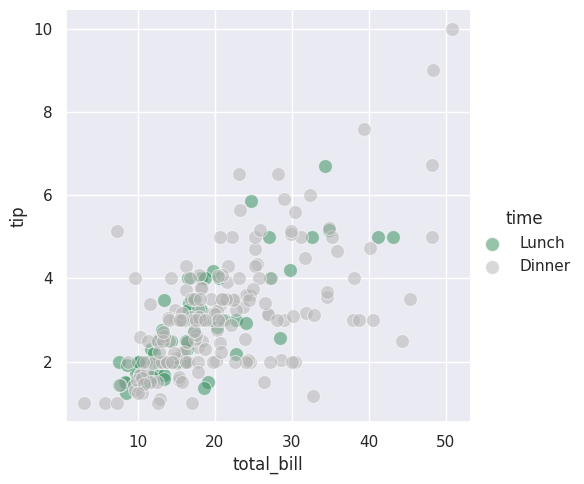

In [166]:
pal = dict(Lunch="seagreen", Dinner=".7")
g = sns.FacetGrid(tips, hue="time", palette=pal, height=5)
g.map(sns.scatterplot, "total_bill", "tip", s=100, alpha=.5)
g.add_legend()

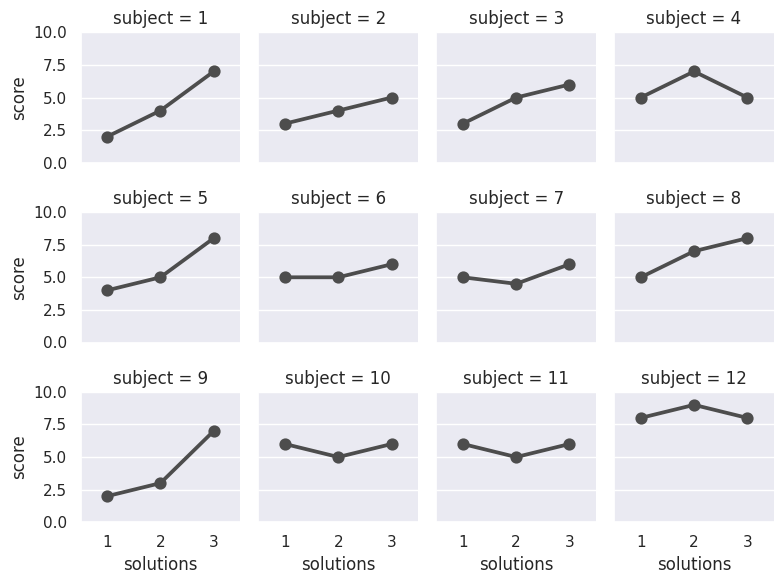

In [167]:
attend = sns.load_dataset("attention").query("subject <= 12")
g = sns.FacetGrid(attend, col="subject", col_wrap=4, height=2, ylim=(0, 10))
g.map(sns.pointplot, "solutions", "score", order=[1, 2, 3], color=".3", errorbar=None)

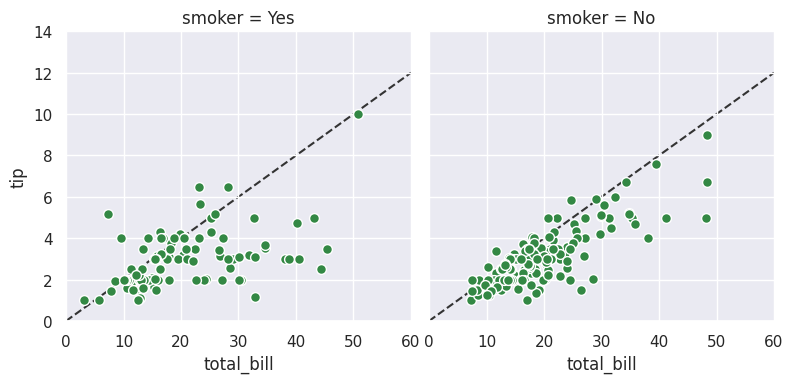

In [168]:
g = sns.FacetGrid(tips, col="smoker", margin_titles=True, height=4)
g.map(plt.scatter, "total_bill", "tip", color="#338844", edgecolor="white", s=50, lw=1)
for ax in g.axes_dict.values():
    ax.axline((0, 0), slope=.2, c=".2", ls="--", zorder=0)
g.set(xlim=(0, 60), ylim=(0, 14))

### using custom functions

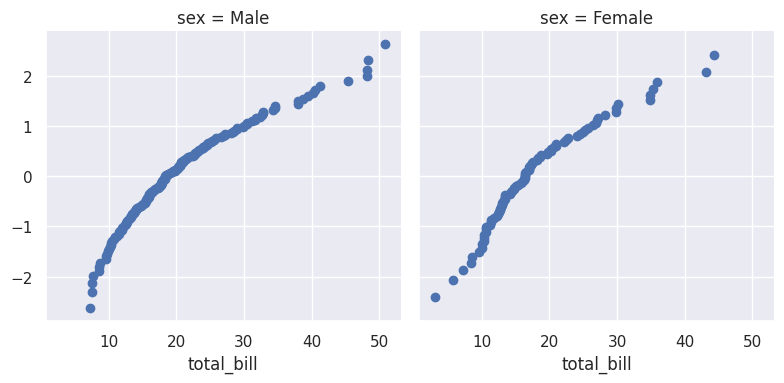

In [169]:
from scipy import stats
def quantile_plot(x, **kwargs):
    quantiles, xr = stats.probplot(x, fit=False)
    plt.scatter(xr, quantiles, **kwargs)

g = sns.FacetGrid(tips, col="sex", height=4)
g.map(quantile_plot, "total_bill")

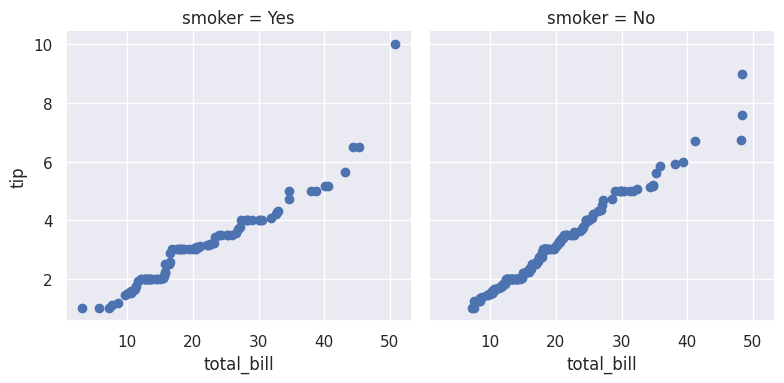

In [171]:
def qqplot(x, y, **kwargs):
    _, xr = stats.probplot(x, fit=False)
    _, yr = stats.probplot(y, fit=False)
    plt.scatter(xr, yr, **kwargs)

g = sns.FacetGrid(tips, col="smoker", height=4)
g.map(qqplot, "total_bill", "tip")

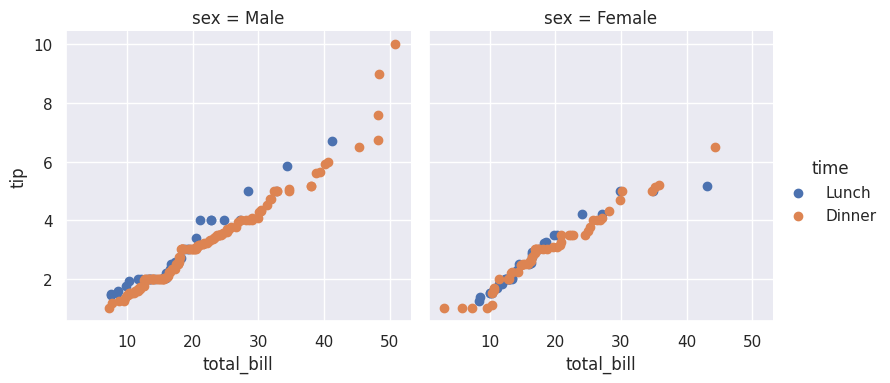

In [172]:
g = sns.FacetGrid(tips, hue="time", col="sex", height=4)
g.map(qqplot, "total_bill", "tip")
g.add_legend()


### Plotting pairwise data relationship

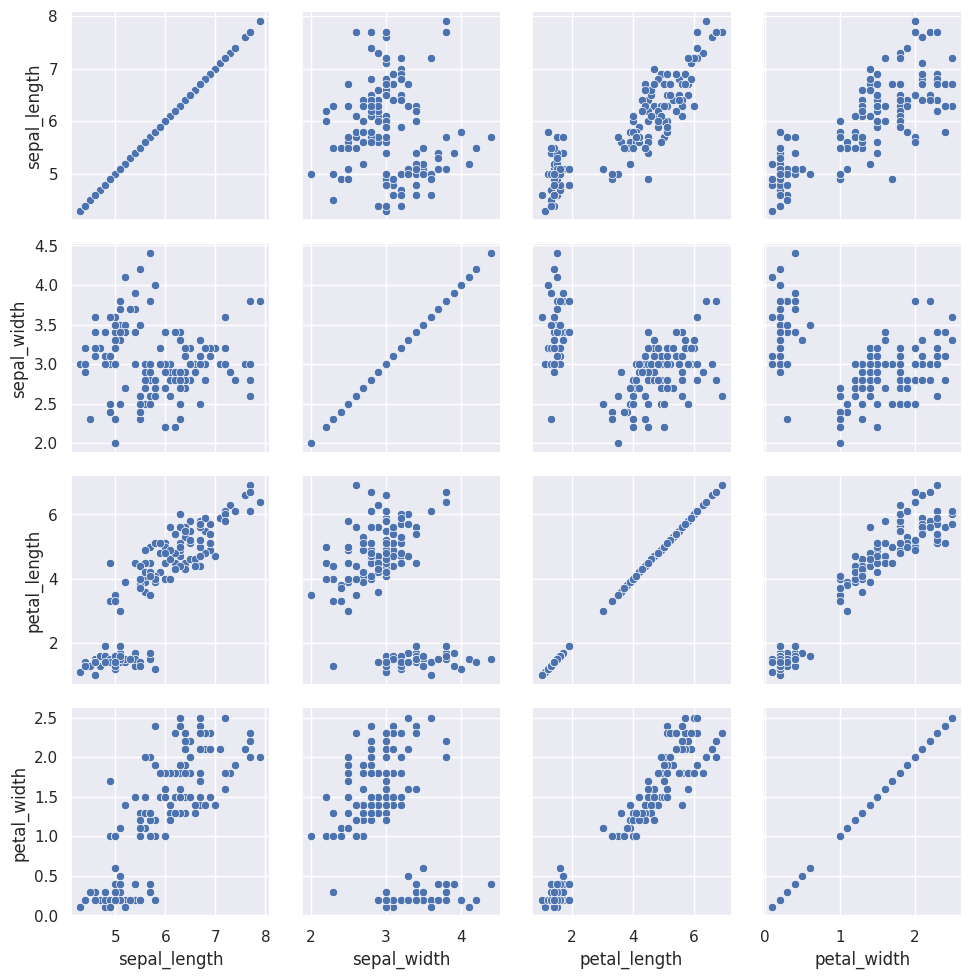

In [173]:
iris = sns.load_dataset("iris")
g = sns.PairGrid(iris)
g.map(sns.scatterplot)


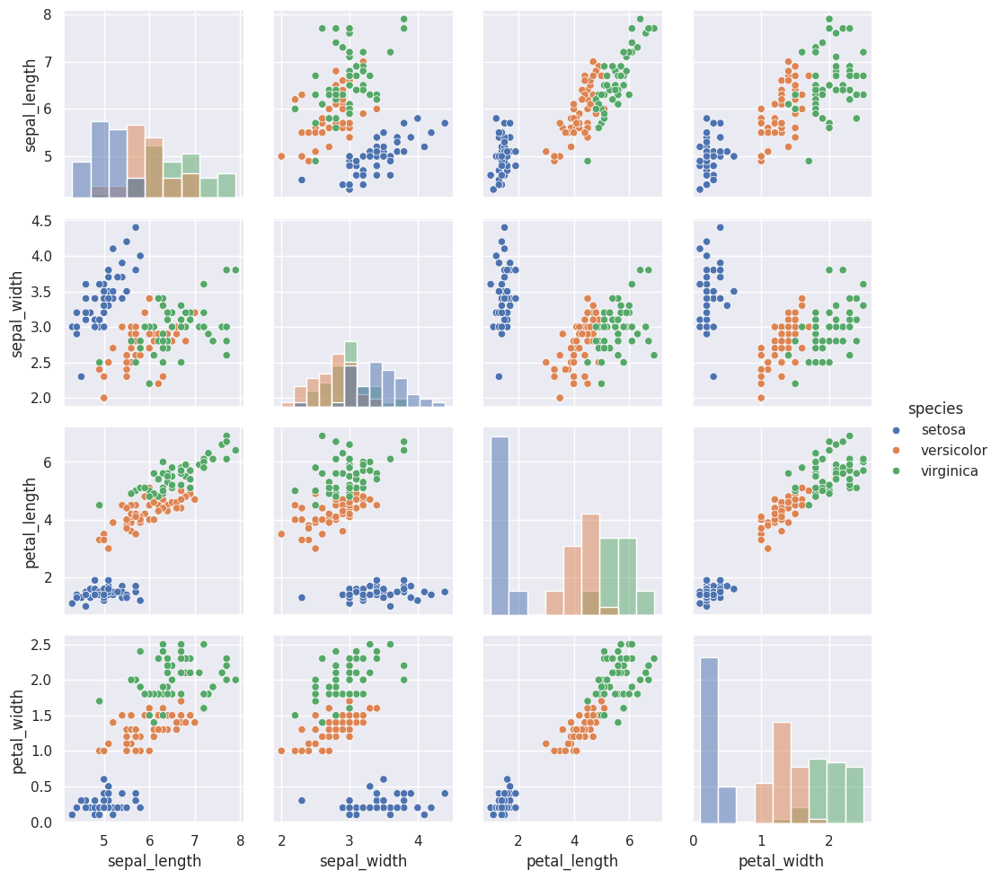

In [174]:
g = sns.PairGrid(iris, hue="species")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

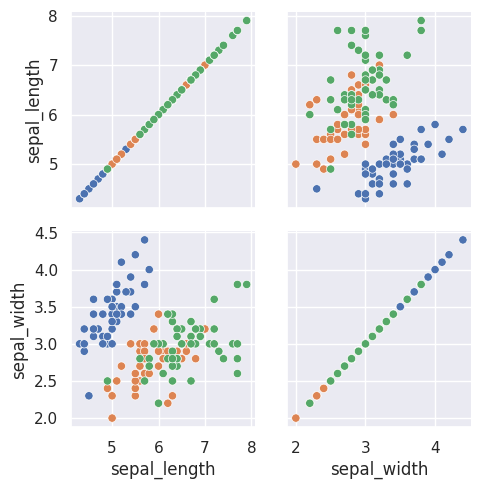

In [175]:
g = sns.PairGrid(iris, vars=["sepal_length", "sepal_width"], hue="species")
g.map(sns.scatterplot)

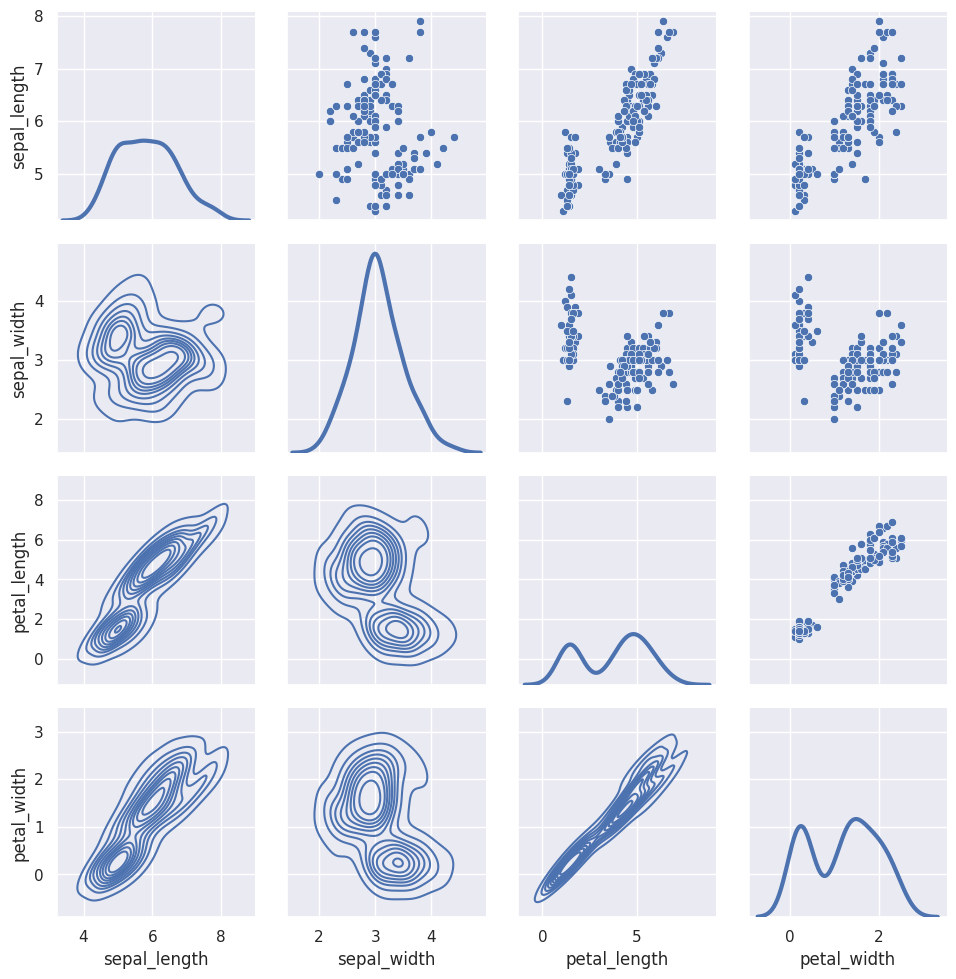

In [176]:
g = sns.PairGrid(iris)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)

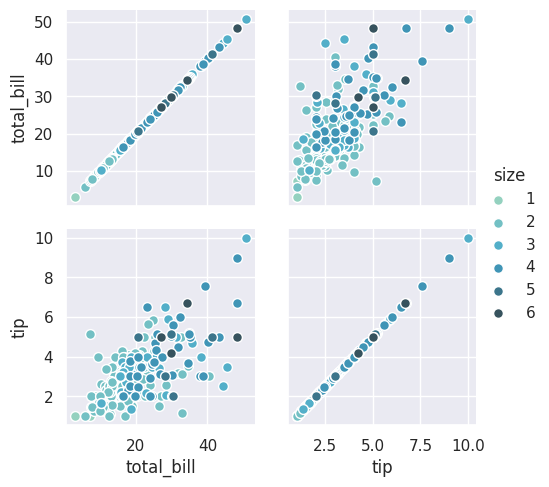

In [177]:
g = sns.PairGrid(tips, hue="size", palette="GnBu_d")
g.map(plt.scatter, s=50, edgecolor="white")
g.add_legend()

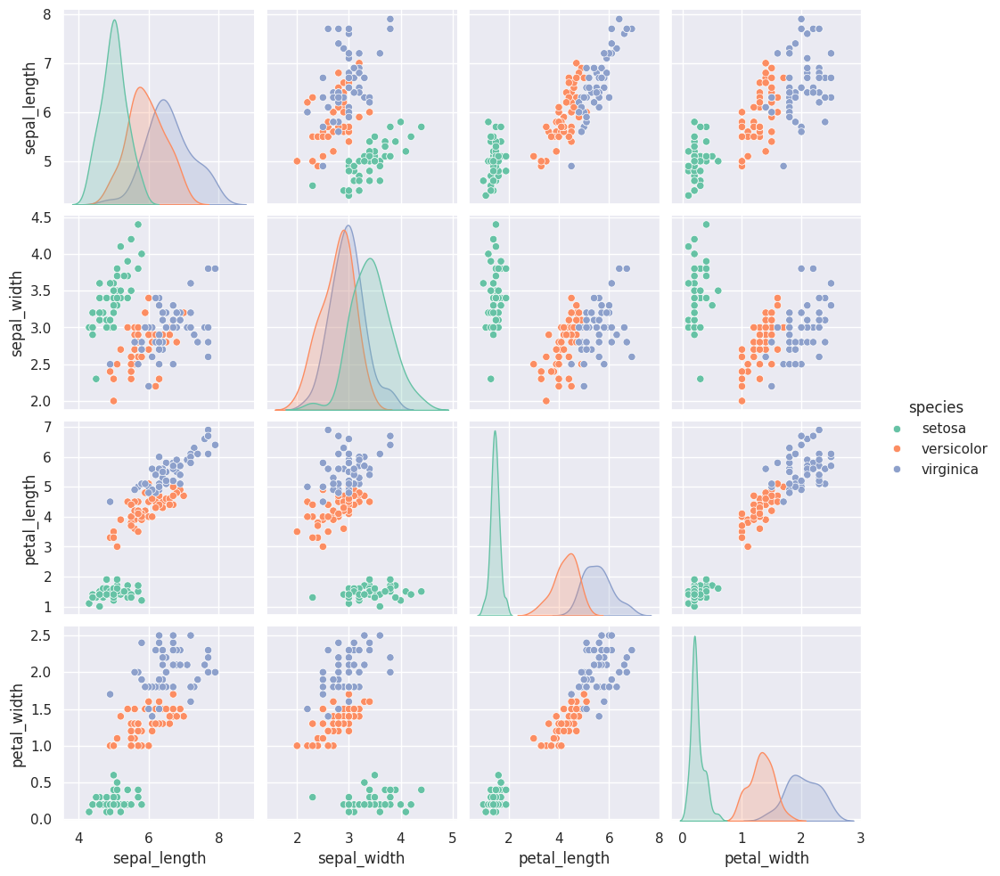

In [178]:
g = sns.pairplot(iris, hue="species", palette="Set2", diag_kind="kde", height=2.5)

## Controlling figure aesthetics

In [179]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [180]:
def sinplot(n=10, flip=1):
    x = np.linspace(0, 14, 100)
    for i in range(1, n + 1):
        plt.plot(x, np.sin(x + i * .5) * (n + 2 - i) * flip)

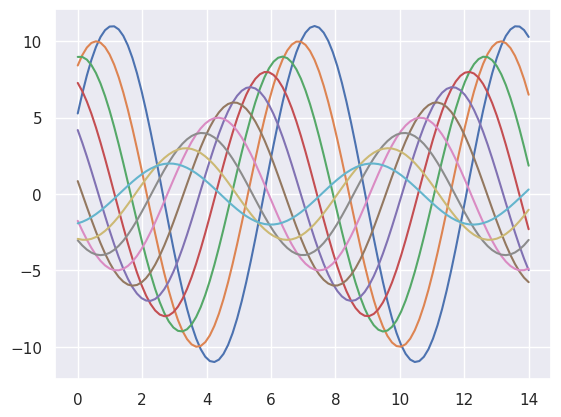

In [182]:
sns.set_theme()
sinplot()

## Seaborn figure styles

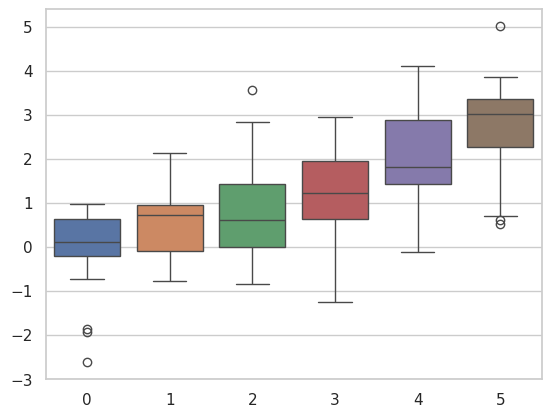

In [183]:
sns.set_style("whitegrid")
data = np.random.normal(size=(20, 6)) + np.arange(6) / 2
sns.boxplot(data=data);

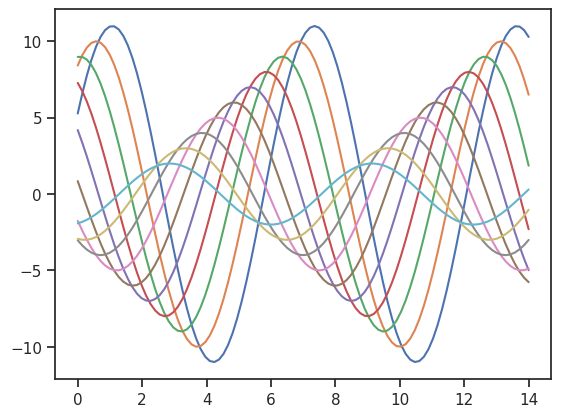

In [184]:
sns.set_style("ticks")
sinplot()

### Removing axes spines

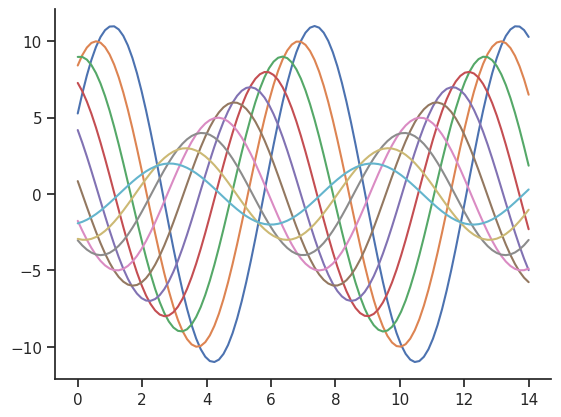

In [185]:
sinplot()
sns.despine()

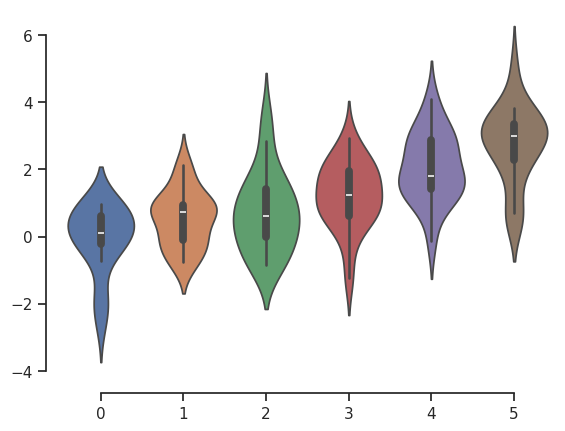

In [186]:
f, ax = plt.subplots()
sns.violinplot(data=data)
sns.despine(offset=10, trim=True);

### Temporarily setting figure styles

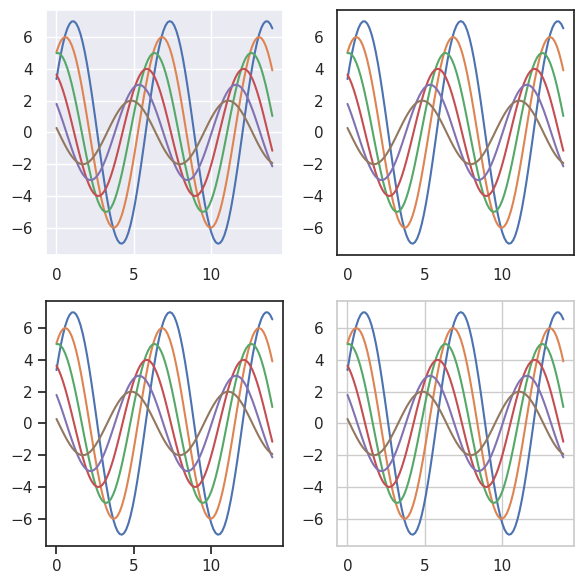

In [187]:
f = plt.figure(figsize=(6, 6))
gs = f.add_gridspec(2, 2)

with sns.axes_style("darkgrid"):
    ax = f.add_subplot(gs[0, 0])
    sinplot(6)

with sns.axes_style("white"):
    ax = f.add_subplot(gs[0, 1])
    sinplot(6)

with sns.axes_style("ticks"):
    ax = f.add_subplot(gs[1, 0])
    sinplot(6)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[1, 1])
    sinplot(6)

f.tight_layout()

### Overriding elements of the seaborn styles

In [188]:
sns.axes_style()

{'axes.facecolor': 'white',
 'axes.edgecolor': '.15',
 'axes.grid': False,
 'axes.axisbelow': True,
 'axes.labelcolor': '.15',
 'figure.facecolor': 'white',
 'grid.color': '.8',
 'grid.linestyle': '-',
 'text.color': '.15',
 'xtick.color': '.15',
 'ytick.color': '.15',
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'lines.solid_capstyle': <CapStyle.round: 'round'>,
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'image.cmap': 'rocket',
 'font.family': ['sans-serif'],
 'font.sans-serif': ['Arial',
  'DejaVu Sans',
  'Liberation Sans',
  'Bitstream Vera Sans',
  'sans-serif'],
 'xtick.bottom': True,
 'xtick.top': False,
 'ytick.left': True,
 'ytick.right': False,
 'axes.spines.left': True,
 'axes.spines.bottom': True,
 'axes.spines.right': True,
 'axes.spines.top': True}

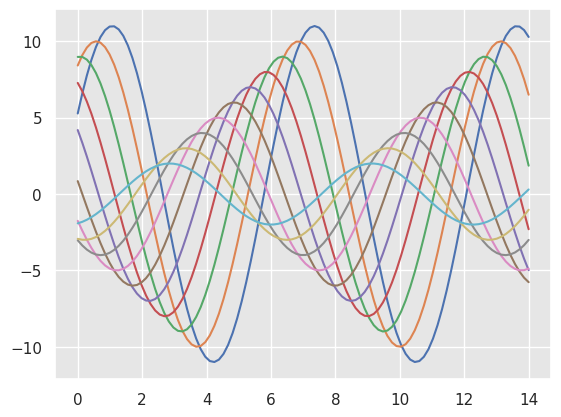

In [189]:
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sinplot()

### Scanning plot elements

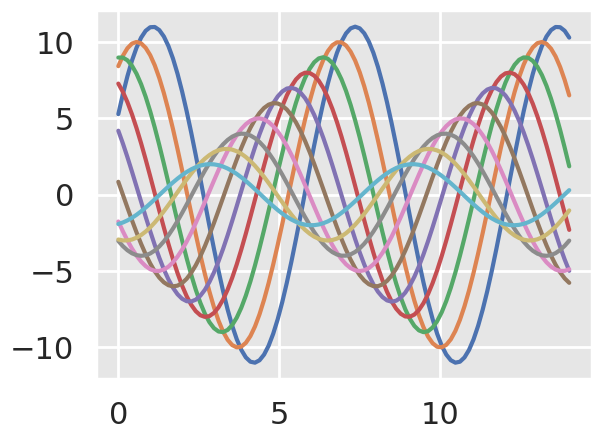

In [190]:
sns.set_context("poster")
sinplot()

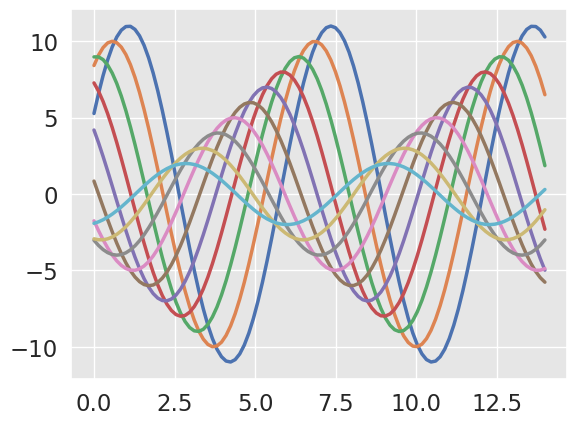

In [191]:
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
sinplot()

## Chossing color pallete

### Tools for chossing color pallete

In [194]:
# qualitative color pallete
sns.color_palette()

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [193]:
sns.color_palette("tab10")

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [195]:
# Using circular color systems
sns.color_palette("hls", 8)


[(0.86, 0.3712, 0.33999999999999997),
 (0.86, 0.7612000000000001, 0.33999999999999997),
 (0.5688000000000001, 0.86, 0.33999999999999997),
 (0.33999999999999997, 0.86, 0.5012000000000001),
 (0.33999999999999997, 0.8287999999999999, 0.86),
 (0.33999999999999997, 0.43879999999999986, 0.86),
 (0.6311999999999998, 0.33999999999999997, 0.86),
 (0.86, 0.33999999999999997, 0.6987999999999996)]

In [196]:
# Using categorical Color Brewer palettes
sns.color_palette("Set2")

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

In [197]:
sns.color_palette("Paired")


[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 1.0, 0.6),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

### Sequential Color palettes

 Perceptually uniform palettes

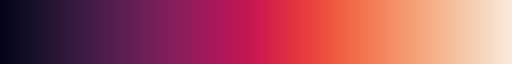

In [198]:
sns.color_palette("rocket", as_cmap=True)

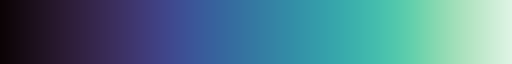

In [200]:
sns.color_palette("mako", as_cmap=True)

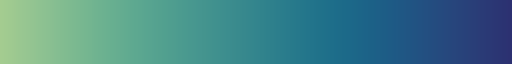

In [201]:
sns.color_palette("crest", as_cmap=True)

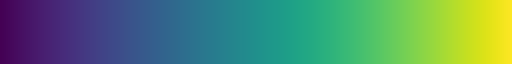

In [202]:
sns.color_palette("viridis", as_cmap=True)

Discrete vs. continuous mapping

In [203]:
sns.color_palette("rocket")

[(0.20973515, 0.09747934, 0.24238489),
 (0.43860848, 0.12177004, 0.34119475),
 (0.67824099, 0.09192342, 0.3504148),
 (0.8833417, 0.19830556, 0.26014181),
 (0.95381595, 0.46373781, 0.31769923),
 (0.96516917, 0.70776351, 0.5606593)]

Sequential “cubehelix” palettes

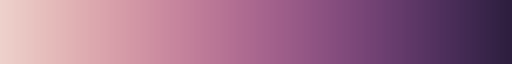

In [204]:
sns.cubehelix_palette(as_cmap=True)

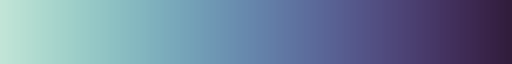

In [205]:
sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)

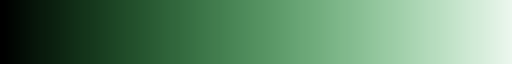

In [206]:
sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=True, as_cmap=True)

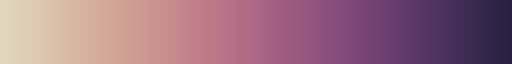

In [207]:
sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)

Custom sequential palettes

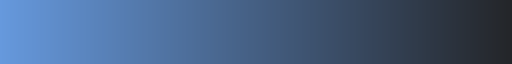

In [208]:
sns.dark_palette("#69d", reverse=True, as_cmap=True)

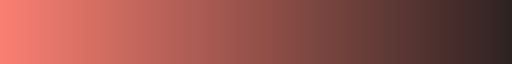

In [209]:
sns.color_palette("dark:salmon_r", as_cmap=True)

Sequential Color Brewer palettes

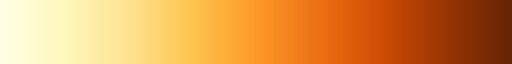

In [210]:
sns.color_palette("YlOrBr", as_cmap=True)

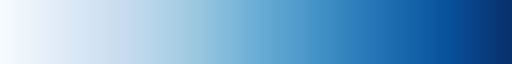

In [211]:
sns.color_palette("Blues", as_cmap=True)

### Diverging Color palettes

Perceptually uniform diverging palettes


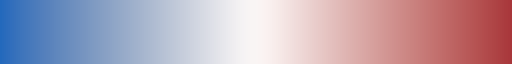

In [212]:
sns.color_palette("vlag", as_cmap=True)

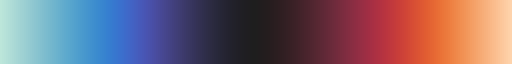

In [213]:
sns.color_palette("icefire", as_cmap=True)


Custom diverging palettes

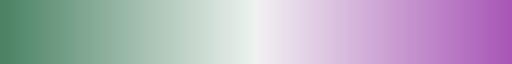

In [214]:
sns.diverging_palette(145, 300, s=60, as_cmap=True)

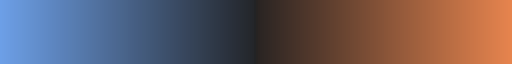

In [215]:
sns.diverging_palette(250, 30, l=65, center="dark", as_cmap=True)

Other diverging palettes


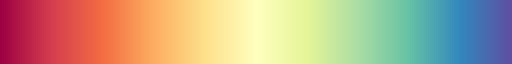

In [216]:
sns.color_palette("Spectral", as_cmap=True)

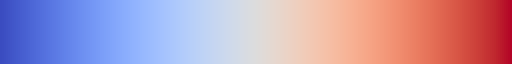

In [217]:
sns.color_palette("coolwarm", as_cmap=True)